In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
import warnings
warnings.simplefilter(action='ignore')

In [3]:
%matplotlib inline
sns.set_theme()
pd.set_option('display.max_columns', None)

In [4]:
AAL=pd.read_csv('AAL.csv')
AAPL=pd.read_csv('AAPL.csv')
ALK=pd.read_csv('ALK.csv')
AMZN=pd.read_csv('AMZN.csv')
BHC=pd.read_csv('BHC.csv')
CS=pd.read_csv('CS.csv')
DB=pd.read_csv('DB.csv')
GOOG=pd.read_csv('GOOG.csv')
GS=pd.read_csv('GS.csv')
HA=pd.read_csv('HA.csv')
JNJ=pd.read_csv('JNJ.csv')
MRK=pd.read_csv('MRK.csv')
SP500=pd.read_csv('S&P500.csv')


In [5]:
industry=pd.read_csv('Annexure-I.csv')

In [6]:
AAPL.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,10.219643,10.235000,10.048214,10.090000,8.719163,448142800
1,04-10-2010,10.057143,10.103572,9.920357,9.951428,8.599421,435302000
2,05-10-2010,10.071428,10.337500,10.065000,10.319285,8.917298,501967200
3,06-10-2010,10.342500,10.428214,10.187857,10.328215,8.925013,670868800
4,07-10-2010,10.369286,10.374286,10.246786,10.329286,8.925941,408399600


In [7]:
SP500.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,1143.489990,1150.300049,1139.420044,1146.239990,1146.239990,4298910000
1,04-10-2010,1144.959961,1148.160034,1131.869995,1137.030029,1137.030029,3604110000
2,05-10-2010,1140.680054,1162.760010,1140.680054,1160.750000,1160.750000,4068840000
3,06-10-2010,1159.810059,1162.329956,1154.849976,1159.969971,1159.969971,4073160000
4,07-10-2010,1161.569946,1163.869995,1151.410034,1158.060059,1158.060059,3910550000


In [8]:
industry

,Ticker,Industry,Company Name
0,AAL,Aviation,American Airlines Group Inc
1,ALK,Aviation,Alaska Air Group Inc
2,HA,Aviation,Hawaiian Holdings Inc
3,CS,Finance,Credit Suisse
4,DB,Finance,Deutsche Bank
5,GS,Finance,Goldman Sachs
6,JNJ,Healthcare,Johnson & Johnson
7,MRK,Healthcare,Merck and CO inc.
8,BHC,Pharmaceuticals,Bausch Health Companies inc
9,AAPL,Technology,Apple Inc


In [9]:
new_row={'Ticker':'SP500','Industry':'Index','Company Name':'S&P500'}
industry = industry.append(new_row, ignore_index=True)
industry

,Ticker,Industry,Company Name
0,AAL,Aviation,American Airlines Group Inc
1,ALK,Aviation,Alaska Air Group Inc
2,HA,Aviation,Hawaiian Holdings Inc
3,CS,Finance,Credit Suisse
4,DB,Finance,Deutsche Bank
5,GS,Finance,Goldman Sachs
6,JNJ,Healthcare,Johnson & Johnson
7,MRK,Healthcare,Merck and CO inc.
8,BHC,Pharmaceuticals,Bausch Health Companies inc
9,AAPL,Technology,Apple Inc


In [10]:
industry.loc[industry['Industry']=='Pharmaceuticals','Industry']='Healthcare'

In [11]:
industry

,Ticker,Industry,Company Name
0,AAL,Aviation,American Airlines Group Inc
1,ALK,Aviation,Alaska Air Group Inc
2,HA,Aviation,Hawaiian Holdings Inc
3,CS,Finance,Credit Suisse
4,DB,Finance,Deutsche Bank
5,GS,Finance,Goldman Sachs
6,JNJ,Healthcare,Johnson & Johnson
7,MRK,Healthcare,Merck and CO inc.
8,BHC,Healthcare,Bausch Health Companies inc
9,AAPL,Technology,Apple Inc


In [12]:
CS.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,04-01-2010,49.902344,51.035156,49.765625,50.771484,34.852165,734200.0
1,05-01-2010,51.250000,51.318359,50.644531,51.191406,35.140423,447700.0
2,06-01-2010,50.224609,50.917969,49.951172,50.478516,34.651054,751200.0
3,07-01-2010,51.250000,52.646484,51.201172,52.519531,36.052116,833700.0
4,08-01-2010,52.548828,53.339844,52.441406,53.291016,36.581703,706900.0


In [13]:
CS.shape

(2712, 7)

In [14]:
data=pd.DataFrame()
dataframes = {name: globals()[name] for name in industry['Ticker']}
for df_name, df in dataframes.items():
    df['Industry']=industry.loc[industry['Ticker']==df_name,'Industry'].at[industry.loc[industry['Ticker']==df_name,'Industry'].index[0]]
    df['Company Name']=industry.loc[industry['Ticker']==df_name,'Company Name'].at[industry.loc[industry['Ticker']==df_name,'Company Name'].index[0]]
    df['Date']=pd.to_datetime(df.Date,format='%d-%m-%Y')
    df=df[df.Date.between('2010-10-01','2020-09-30')]
    df=df.set_index('Date')
    print("{} has shape {}".format(df_name,df.shape))
    data=pd.concat([data,df])

AAL has shape (2517, 8)
ALK has shape (2517, 8)
HA has shape (2517, 8)
CS has shape (2517, 8)
DB has shape (2517, 8)
GS has shape (2517, 8)
JNJ has shape (2517, 8)
MRK has shape (2517, 8)
BHC has shape (2517, 8)
AAPL has shape (2517, 8)
AMZN has shape (2517, 8)
GOOG has shape (2517, 8)
SP500 has shape (2517, 8)


In [15]:
data.head()

,Open,High,Low,Close,Adj Close,Volume,Industry,Company Name
Date,,,,,,,,
2010-10-01,9.29,9.39,9.21,9.29,8.758067,3603800.0,Aviation,American Airlines Group Inc
2010-10-04,9.24,9.48,9.05,9.12,8.597802,3856800.0,Aviation,American Airlines Group Inc
2010-10-05,9.27,9.35,9.15,9.23,8.701504,3896600.0,Aviation,American Airlines Group Inc
2010-10-06,9.27,9.40,9.15,9.23,8.701504,3230200.0,Aviation,American Airlines Group Inc
2010-10-07,9.30,9.31,9.07,9.24,8.710930,3877700.0,Aviation,American Airlines Group Inc


In [16]:
data.isnull().sum()

Open            0
High            0
Low             0
Close           0
Adj Close       0
Volume          0
Industry        0
Company Name    0
dtype: int64

In [17]:
data.shape

(32721, 8)

In [18]:
AAL.shape[0]*13

32721

In [19]:
data.drop(['Open','High','Low','Adj Close'],axis=1,inplace=True)

In [20]:
data.head()

,Close,Volume,Industry,Company Name
Date,,,,
2010-10-01,9.29,3603800.0,Aviation,American Airlines Group Inc
2010-10-04,9.12,3856800.0,Aviation,American Airlines Group Inc
2010-10-05,9.23,3896600.0,Aviation,American Airlines Group Inc
2010-10-06,9.23,3230200.0,Aviation,American Airlines Group Inc
2010-10-07,9.24,3877700.0,Aviation,American Airlines Group Inc


In [21]:
data.tail()

,Close,Volume,Industry,Company Name
Date,,,,
2020-09-24,3246.590088,4.599470e+09,Index,S&P500
2020-09-25,3298.459961,3.792220e+09,Index,S&P500
2020-09-28,3351.600098,3.946060e+09,Index,S&P500
2020-09-29,3335.469971,3.651880e+09,Index,S&P500
2020-09-30,3363.000000,4.722530e+09,Index,S&P500


In [22]:
# Creating a cleaned merged DataFrame which can be used for various Industry Wise and Company Wise A
data.to_csv('Merged_data.csv')

In [23]:
CS.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Industry,Company Name
0,2010-01-04,49.902344,51.035156,49.765625,50.771484,34.852165,734200.0,Finance,Credit Suisse
1,2010-01-05,51.250000,51.318359,50.644531,51.191406,35.140423,447700.0,Finance,Credit Suisse
2,2010-01-06,50.224609,50.917969,49.951172,50.478516,34.651054,751200.0,Finance,Credit Suisse
3,2010-01-07,51.250000,52.646484,51.201172,52.519531,36.052116,833700.0,Finance,Credit Suisse
4,2010-01-08,52.548828,53.339844,52.441406,53.291016,36.581703,706900.0,Finance,Credit Suisse


In [24]:
data.head()

,Close,Volume,Industry,Company Name
Date,,,,
2010-10-01,9.29,3603800.0,Aviation,American Airlines Group Inc
2010-10-04,9.12,3856800.0,Aviation,American Airlines Group Inc
2010-10-05,9.23,3896600.0,Aviation,American Airlines Group Inc
2010-10-06,9.23,3230200.0,Aviation,American Airlines Group Inc
2010-10-07,9.24,3877700.0,Aviation,American Airlines Group Inc


In [25]:
prices=pd.pivot_table(data=data,values='Close',index='Date',columns=['Industry','Company Name'])
prices.head()

Industry                 Aviation                              \
Company Name Alaska Air Group Inc American Airlines Group Inc   
Date                                                            
2010-10-01                12.4475                        9.29   
2010-10-04                12.1425                        9.12   
2010-10-05                12.2150                        9.23   
2010-10-06                12.1875                        9.23   
2010-10-07                11.6250                        9.24   

Industry                                 Finance                              \
Company Name Hawaiian Holdings Inc Credit Suisse Deutsche Bank Goldman Sachs   
Date                                                                           
2010-10-01                    5.96     42.226563     52.595421    147.699997   
2010-10-04                    5.75     41.914063     51.755726    146.570007   
2010-10-05                    5.85     43.154297     53.950382    149.570007   
2010-10-06                    5.97     43.437500     54.608780    150.839996   
2010-10-07                    6.15     43.671875     54.036259    151.110001   

Industry                      Healthcare                                      \
Company Name Bausch Health Companies inc Johnson & Johnson Merck and CO inc.   
Date                                                                           
2010-10-01                     25.750000         61.750000         36.599998   
2010-10-04                     25.870001         61.669998         36.520000   
2010-10-05                     26.299999         62.799999         37.020000   
2010-10-06                     26.690001         63.209999         37.009998   
2010-10-07                     26.600000         63.220001         36.709999   

Industry            Index  Technology                         
Company Name       S&P500    Alphabet      Amazon  Apple Inc  
Date                                                          
2010-10-01    1146.239990  261.828613  153.710007  10.090000  
2010-10-04    1137.030029  260.199707  155.389999   9.951428  
2010-10-05    1160.750000  268.110046  160.869995  10.319285  
2010-10-06    1159.969971  266.177307  155.399994  10.328215  
2010-10-07    1158.060059  264.015411  156.270004  10.329286

In [26]:
prices.isnull().sum()

Industry    Company Name               
Aviation    Alaska Air Group Inc           0
            American Airlines Group Inc    0
            Hawaiian Holdings Inc          0
Finance     Credit Suisse                  0
            Deutsche Bank                  0
            Goldman Sachs                  0
Healthcare  Bausch Health Companies inc    0
            Johnson & Johnson              0
            Merck and CO inc.              0
Index       S&P500                         0
Technology  Alphabet                       0
            Amazon                         0
            Apple Inc                      0
dtype: int64

In [27]:
prices.shape

(2517, 13)

In [28]:
prices.columns

MultiIndex([(  'Aviation',        'Alaska Air Group Inc'),
            (  'Aviation', 'American Airlines Group Inc'),
            (  'Aviation',       'Hawaiian Holdings Inc'),
            (   'Finance',               'Credit Suisse'),
            (   'Finance',               'Deutsche Bank'),
            (   'Finance',               'Goldman Sachs'),
            ('Healthcare', 'Bausch Health Companies inc'),
            ('Healthcare',           'Johnson & Johnson'),
            ('Healthcare',           'Merck and CO inc.'),
            (     'Index',                      'S&P500'),
            ('Technology',                    'Alphabet'),
            ('Technology',                      'Amazon'),
            ('Technology',                   'Apple Inc')],
           names=['Industry', 'Company Name'])

In [29]:
dict(prices.columns).keys()


dict_keys(['Aviation', 'Finance', 'Healthcare', 'Index', 'Technology'])

In [265]:
pd.pivot_table?

In [266]:
price_vol=pd.pivot_table(data=data,values=['Close','Volume'],index='Date',columns='Company Name')

In [270]:
price_vol.head()

Close                          \
Company Name Alaska Air Group Inc    Alphabet      Amazon   
Date                                                        
2010-10-01                12.4475  261.828613  153.710007   
2010-10-04                12.1425  260.199707  155.389999   
2010-10-05                12.2150  268.110046  160.869995   
2010-10-06                12.1875  266.177307  155.399994   
2010-10-07                11.6250  264.015411  156.270004   

                                                     \
Company Name American Airlines Group Inc  Apple Inc   
Date                                                  
2010-10-01                          9.29  10.090000   
2010-10-04                          9.12   9.951428   
2010-10-05                          9.23  10.319285   
2010-10-06                          9.23  10.328215   
2010-10-07                          9.24  10.329286   

                                                                      \
Company Name Bausch Health Companies inc Credit Suisse Deutsche Bank   
Date                                                                   
2010-10-01                     25.750000     42.226563     52.595421   
2010-10-04                     25.870001     41.914063     51.755726   
2010-10-05                     26.299999     43.154297     53.950382   
2010-10-06                     26.690001     43.437500     54.608780   
2010-10-07                     26.600000     43.671875     54.036259   

                                                                    \
Company Name Goldman Sachs Hawaiian Holdings Inc Johnson & Johnson   
Date                                                                 
2010-10-01      147.699997                  5.96         61.750000   
2010-10-04      146.570007                  5.75         61.669998   
2010-10-05      149.570007                  5.85         62.799999   
2010-10-06      150.839996                  5.97         63.209999   
2010-10-07      151.110001                  6.15         63.220001   

                                                          Volume             \
Company Name Merck and CO inc.       S&P500 Alaska Air Group Inc   Alphabet   
Date                                                                          
2010-10-01           36.599998  1146.239990            1663600.0  4466600.0   
2010-10-04           36.520000  1137.030029            1512400.0  3895400.0   
2010-10-05           37.020000  1160.750000            2567200.0  7040400.0   
2010-10-06           37.009998  1159.969971            1043600.0  5545200.0   
2010-10-07           36.709999  1158.060059            7682400.0  4809400.0   

                                                                  \
Company Name     Amazon American Airlines Group Inc    Apple Inc   
Date                                                               
2010-10-01    8683400.0                   3603800.0  448142800.0   
2010-10-04    5346500.0                   3856800.0  435302000.0   
2010-10-05    5620000.0                   3896600.0  501967200.0   
2010-10-06    6060800.0                   3230200.0  670868800.0   
2010-10-07    4622000.0                   3877700.0  408399600.0   

                                                                      \
Company Name Bausch Health Companies inc Credit Suisse Deutsche Bank   
Date                                                                   
2010-10-01                     5778700.0     1814900.0     2010600.0   
2010-10-04                     4187200.0     1085600.0     1245600.0   
2010-10-05                     4610300.0     1025300.0     2270900.0   
2010-10-06                     4448900.0      871300.0     1887400.0   
2010-10-07                     2453900.0     1377000.0     1191000.0   

                                                                    \
Company Name Goldman Sachs Hawaiian Holdings Inc Johnson & Johnson   
Date                                                             

In [279]:
price_vol.loc[:,'Close'].columns

Index(['Alaska Air Group Inc', 'Alphabet', 'Amazon',
       'American Airlines Group Inc', 'Apple Inc',
       'Bausch Health Companies inc', 'Credit Suisse', 'Deutsche Bank',
       'Goldman Sachs', 'Hawaiian Holdings Inc', 'Johnson & Johnson',
       'Merck and CO inc.', 'S&P500'],
      dtype='object', name='Company Name')

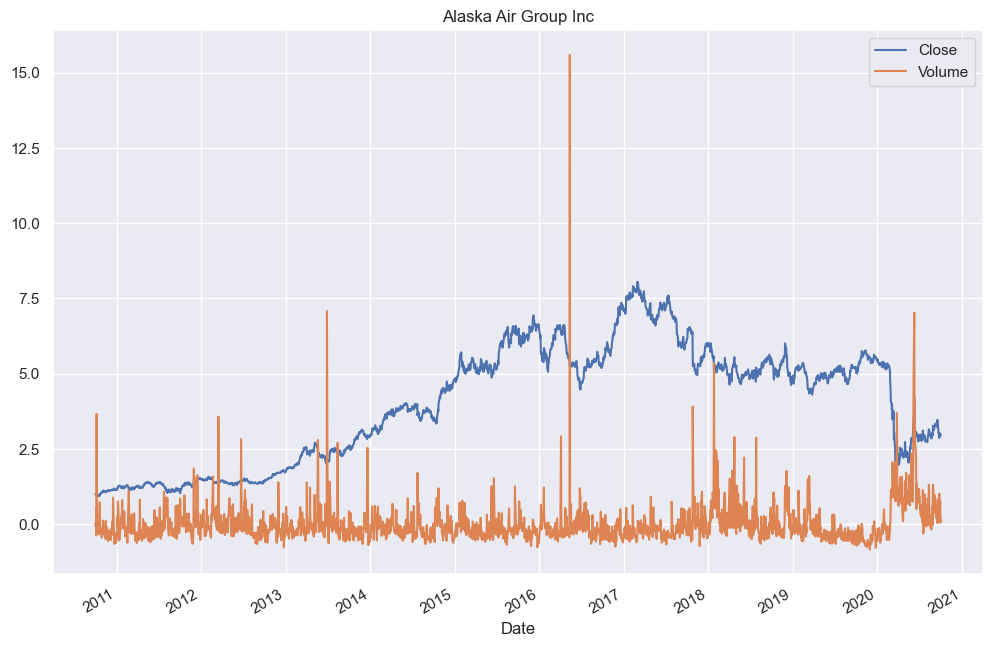

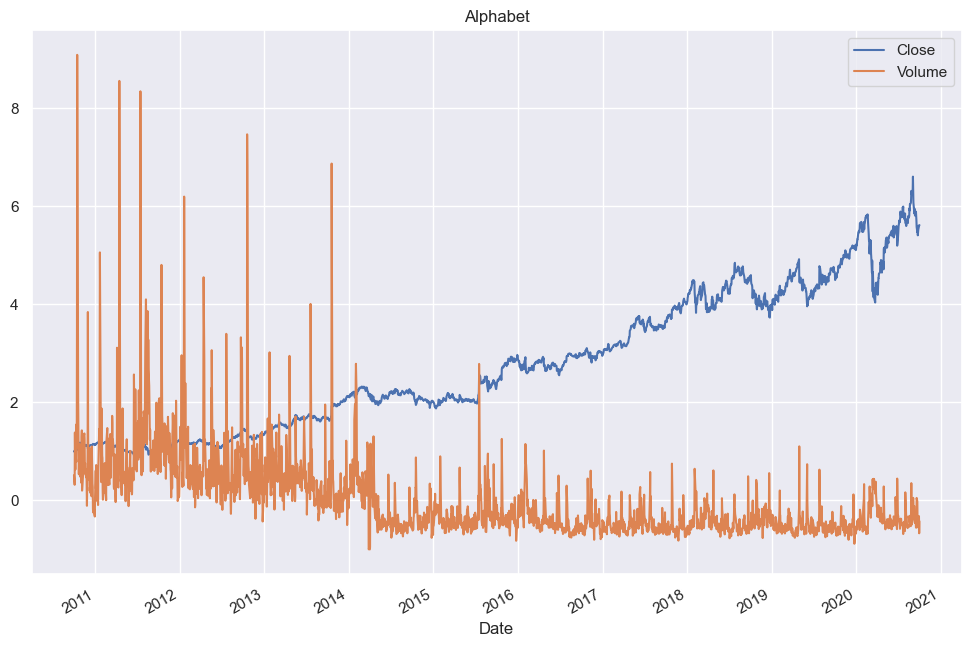

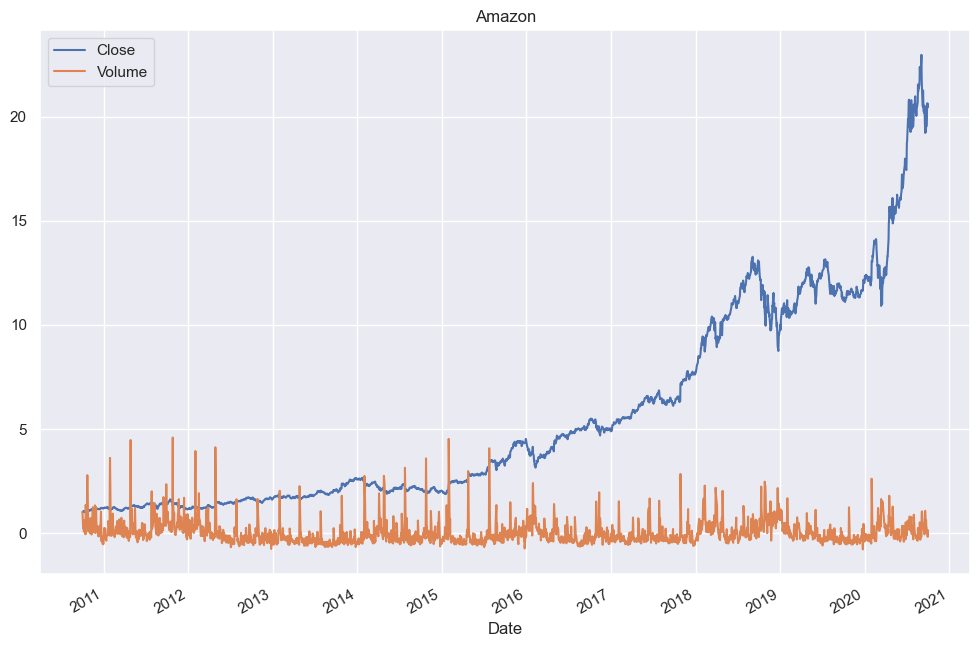

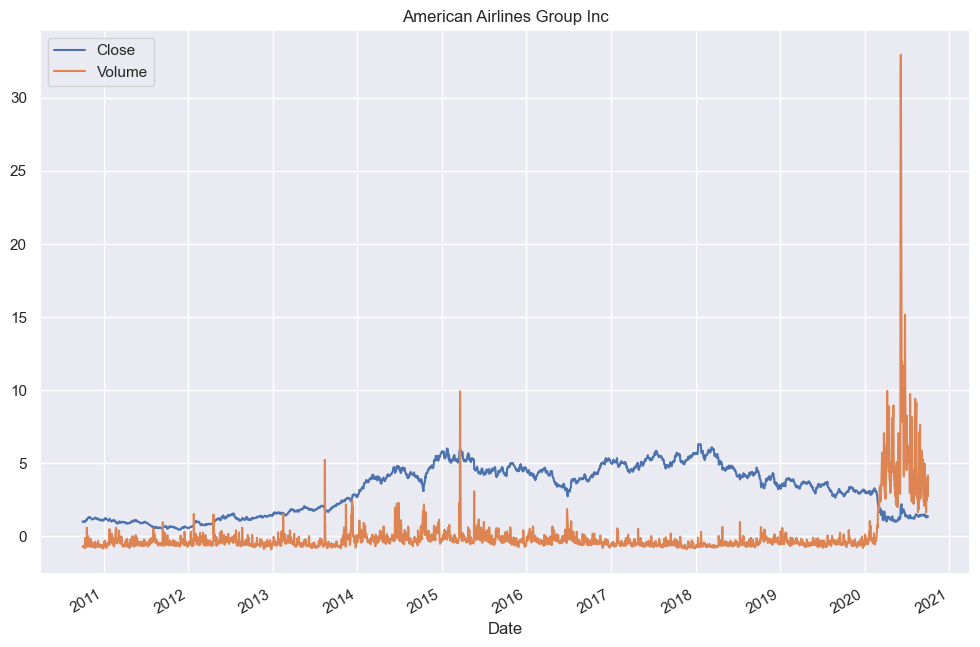

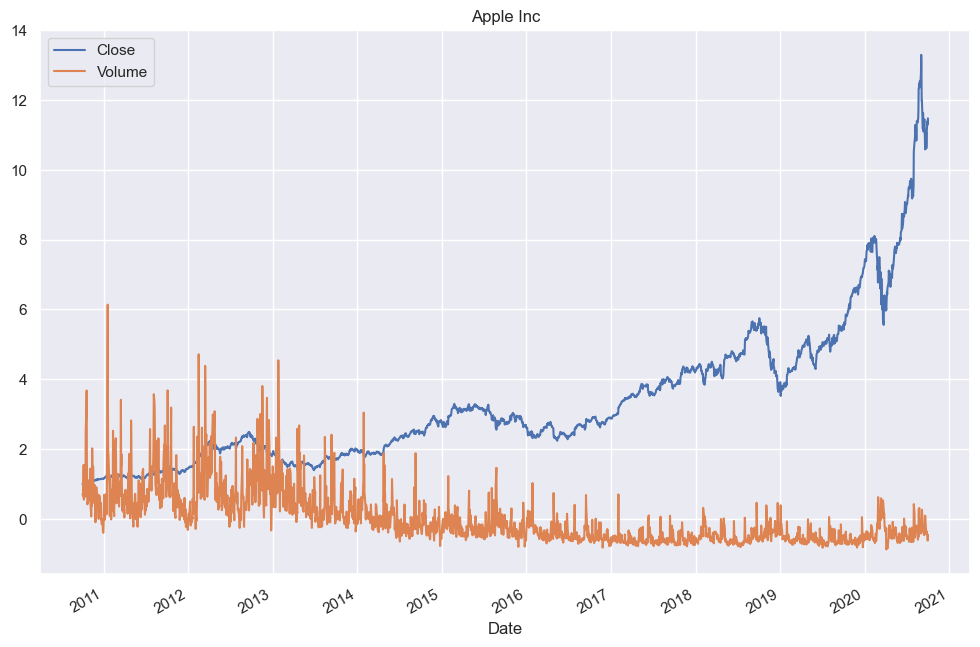

...

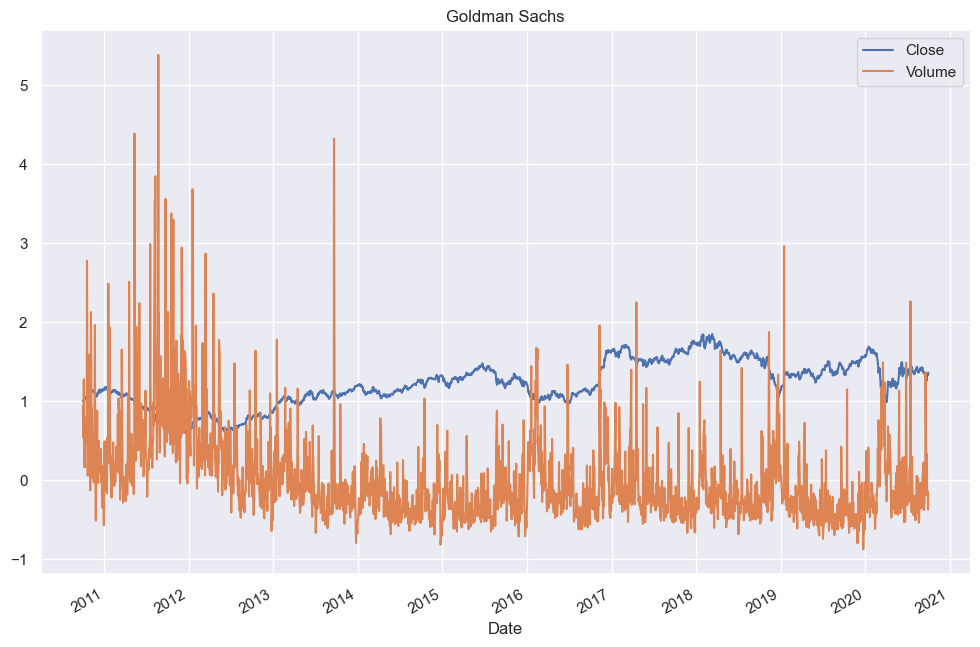

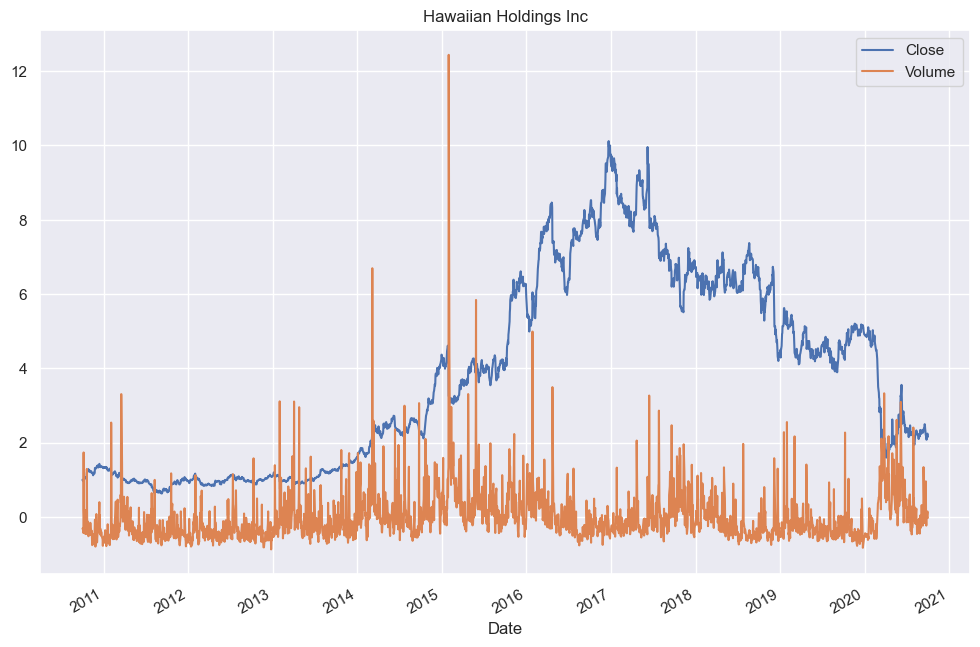

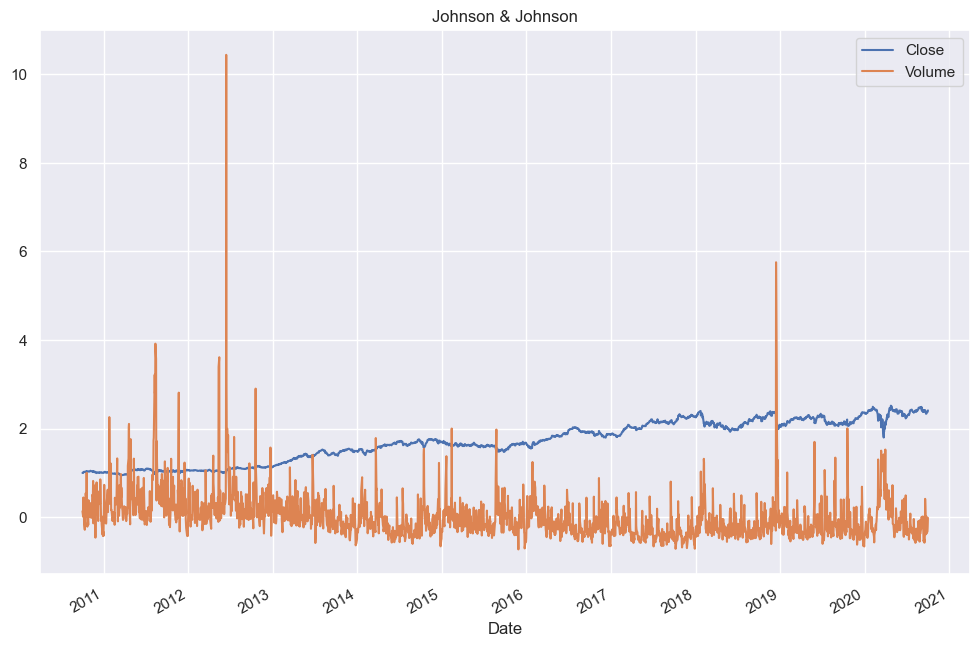

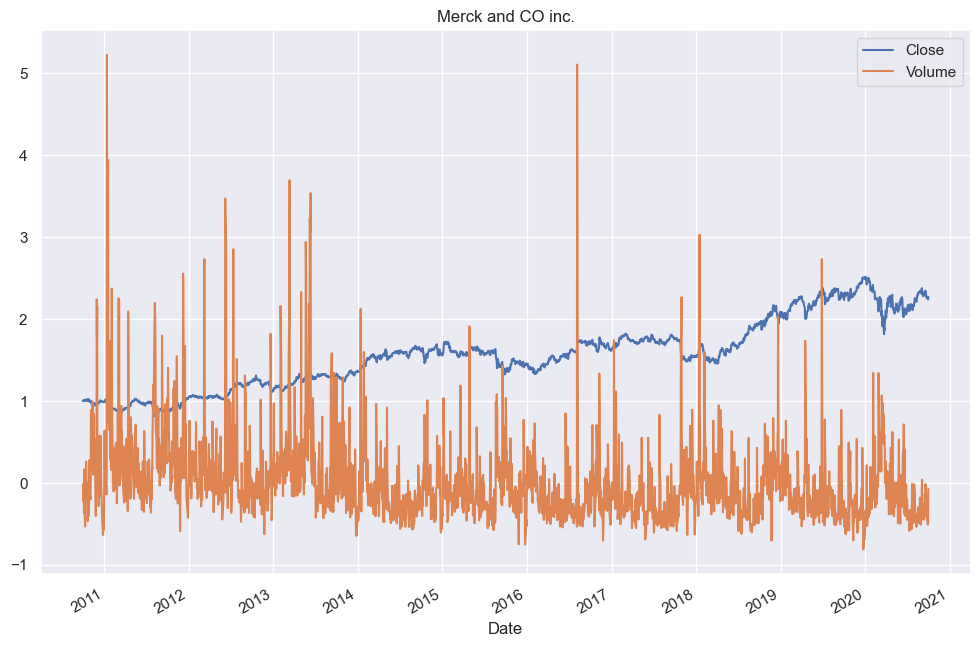

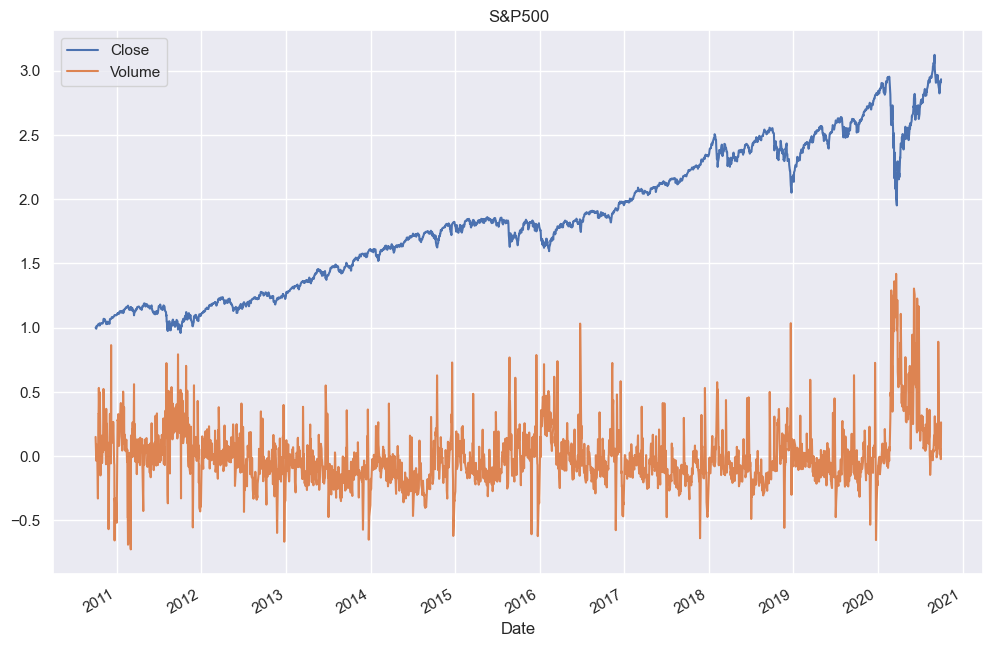

In [290]:
for i in price_vol.loc[:,'Close'].columns:
    for j in dict(price_vol.columns).keys():
        if j=='Close':
            (price_vol[j,i]/price_vol[j,i][0]).plot(label=j,figsize=[12,8])
        else:
            x=price_vol[j,i]-price_vol[j,i].mean()
            (x/price_vol[j,i].mean()).plot(label=j,figsize=[12,8])
    plt.legend()
    plt.title(i)
    plt.show()

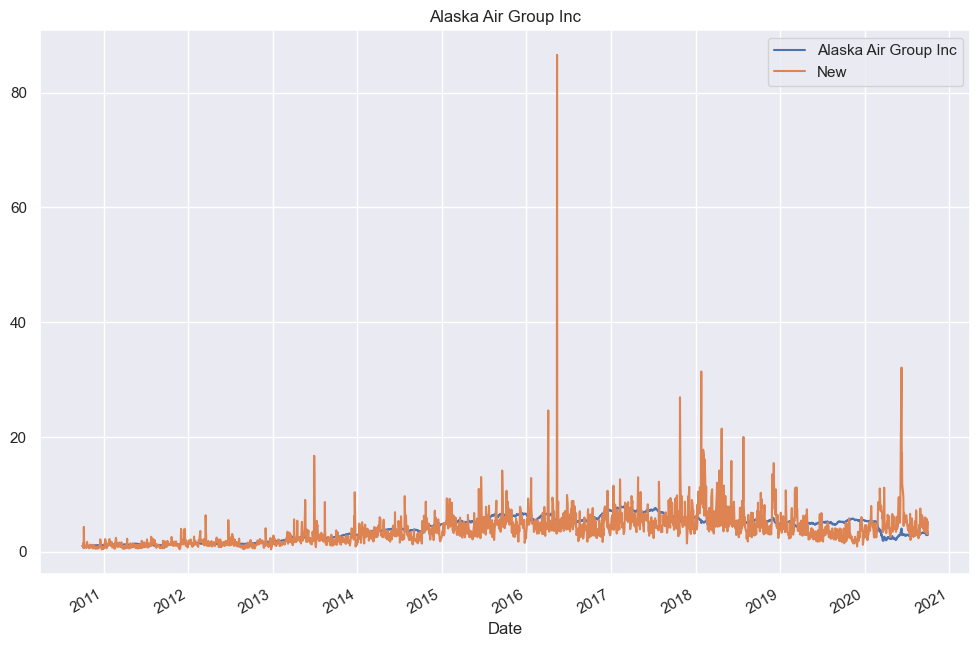

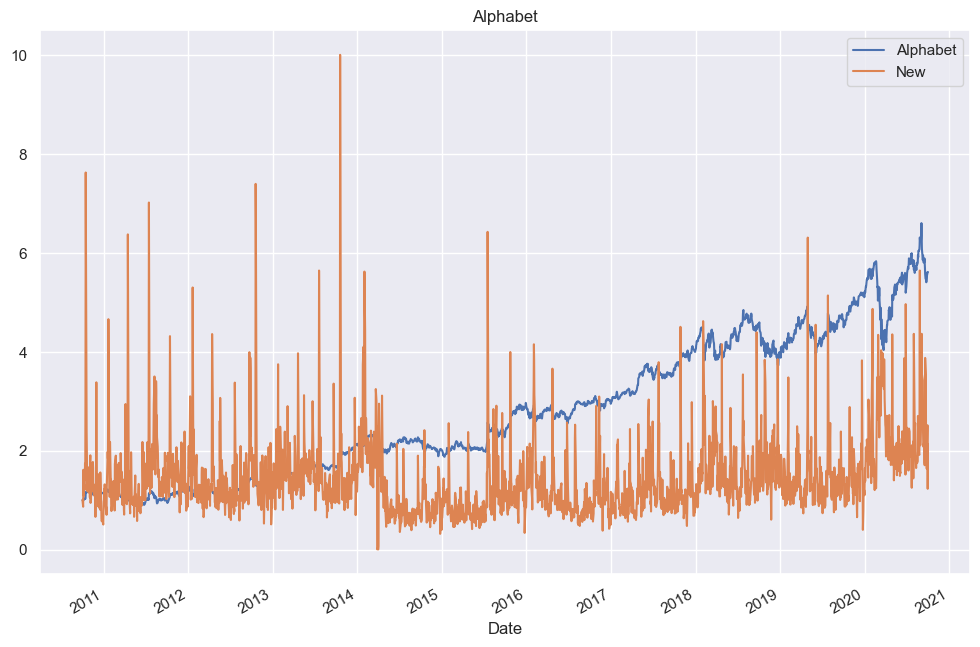

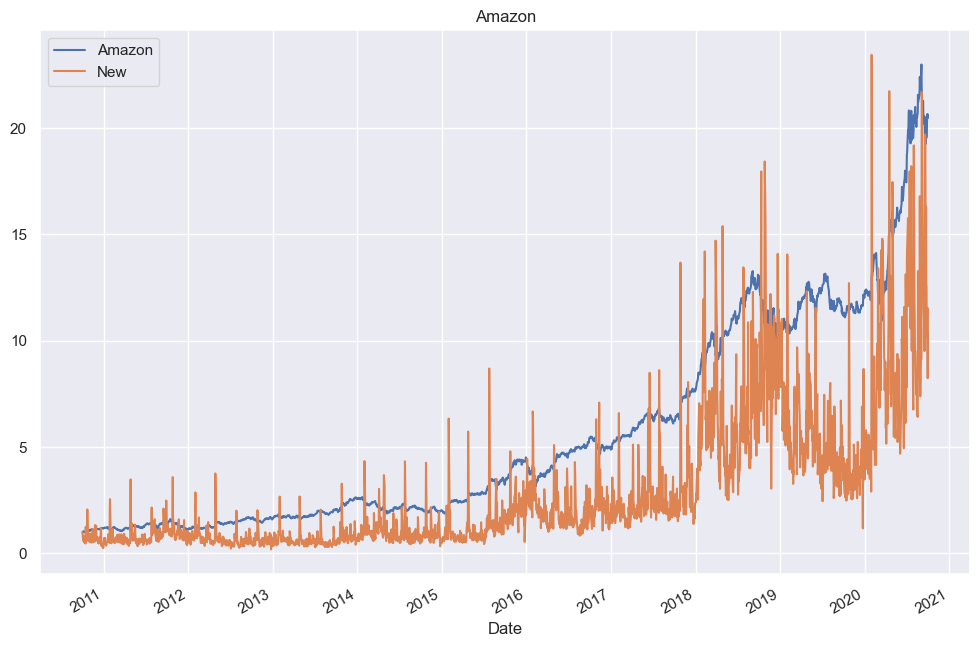

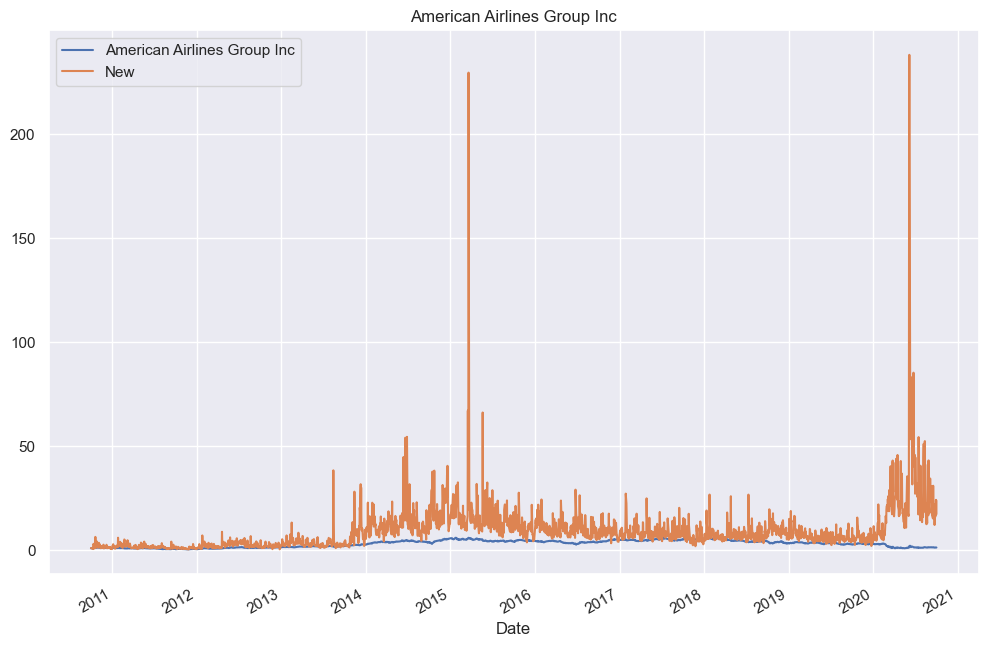

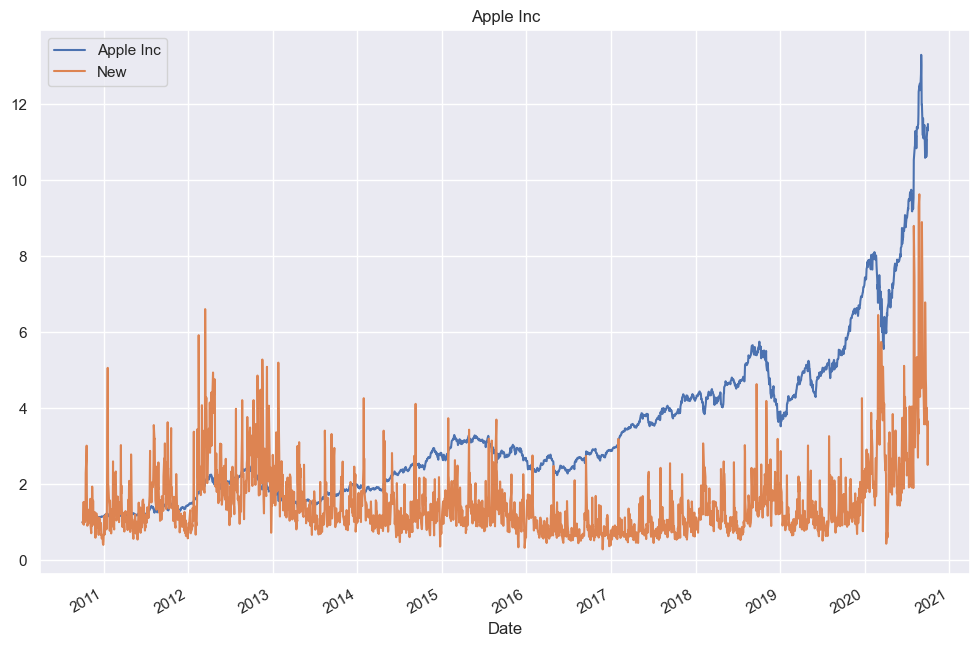

...

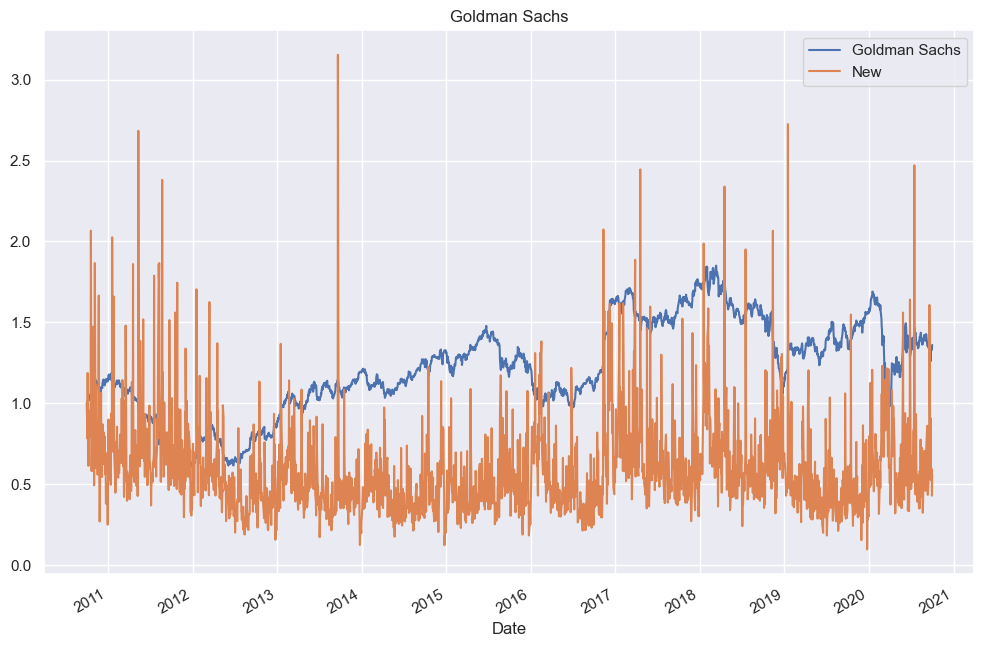

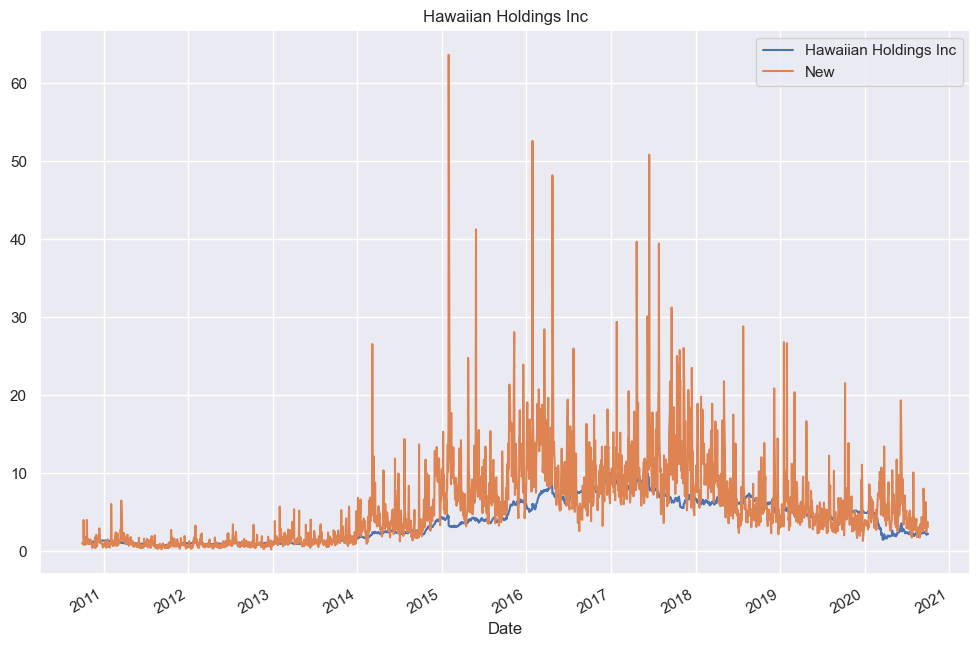

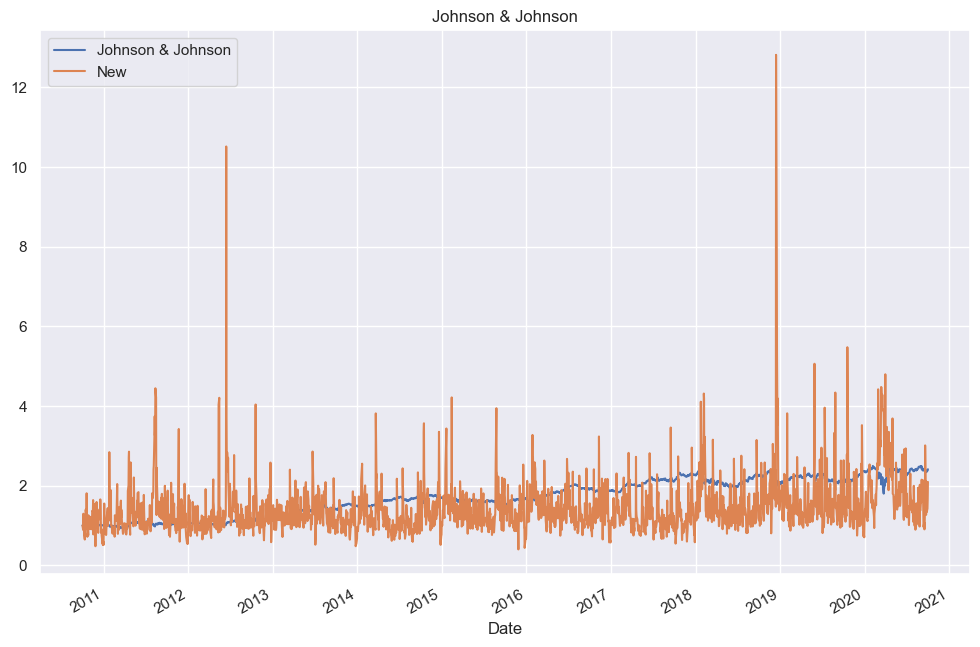

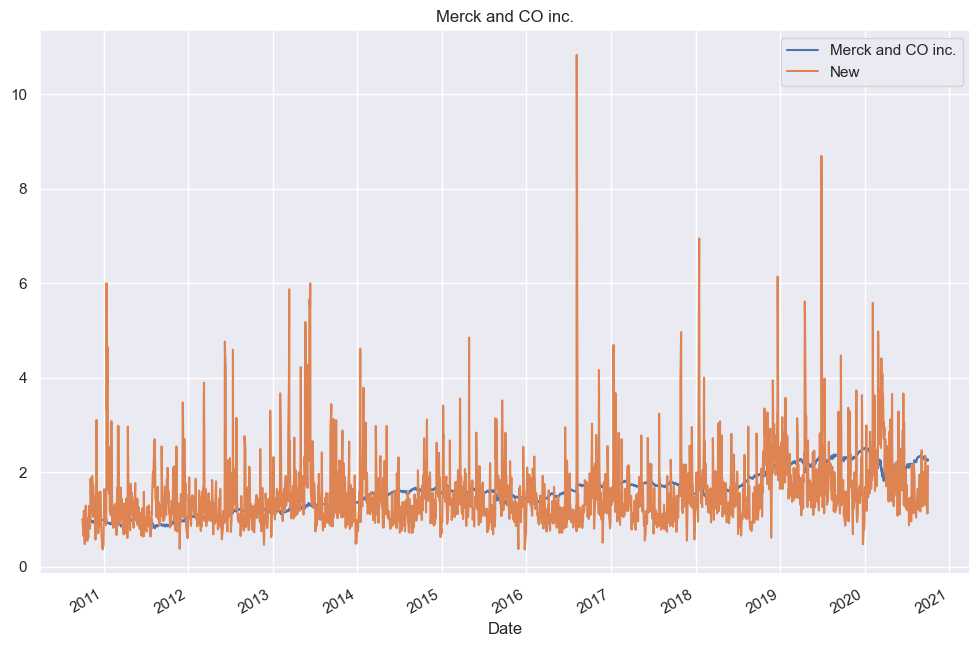

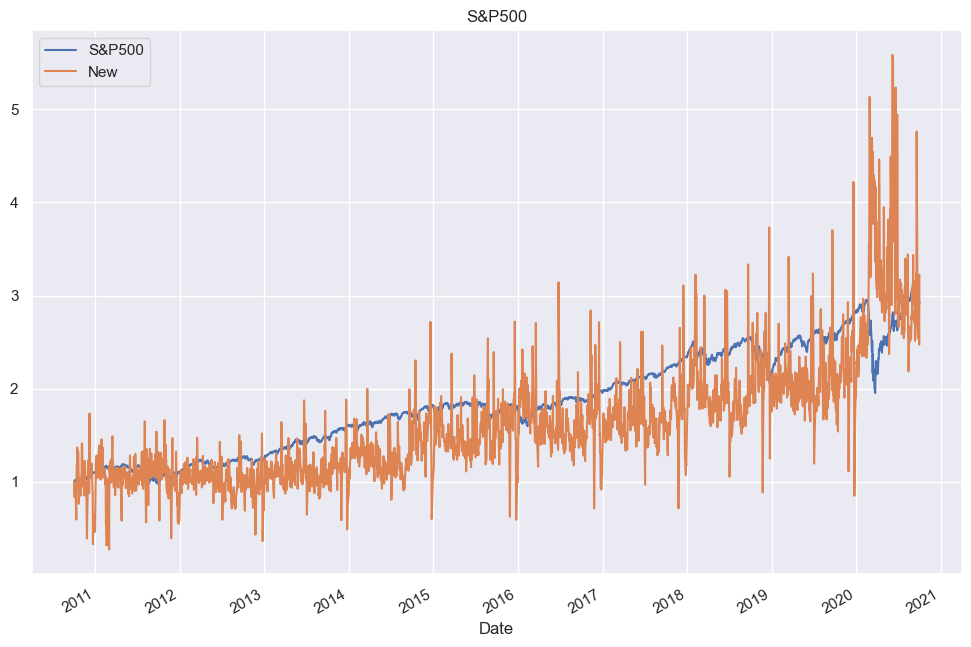

In [329]:
for i in price_vol.loc[:,'Close'].columns:
    y=price_vol['Close',i]*price_vol['Volume',i]
    (price_vol['Close',i]/price_vol['Close',i][0]).plot(label=i,figsize=[12,8])
    (y/y[0]).plot(label='New',figsize=[12,8])    
    plt.legend()
    plt.title(i)
    plt.show()

{'Close': 'S&P500', 'Volume': 'S&P500'}

## Price Charts

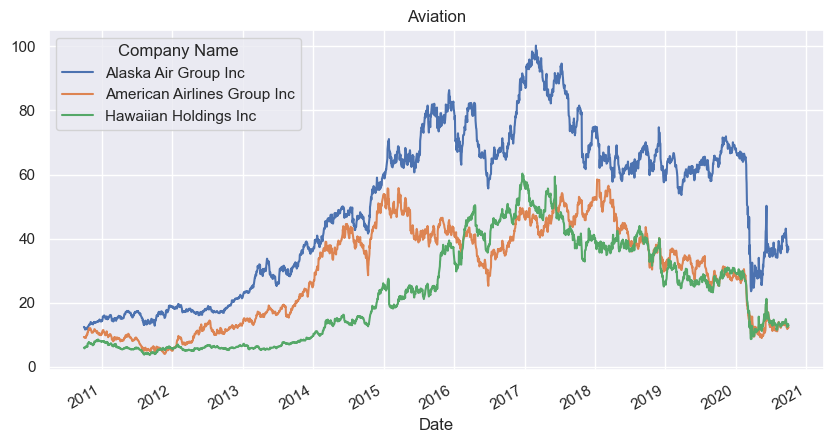

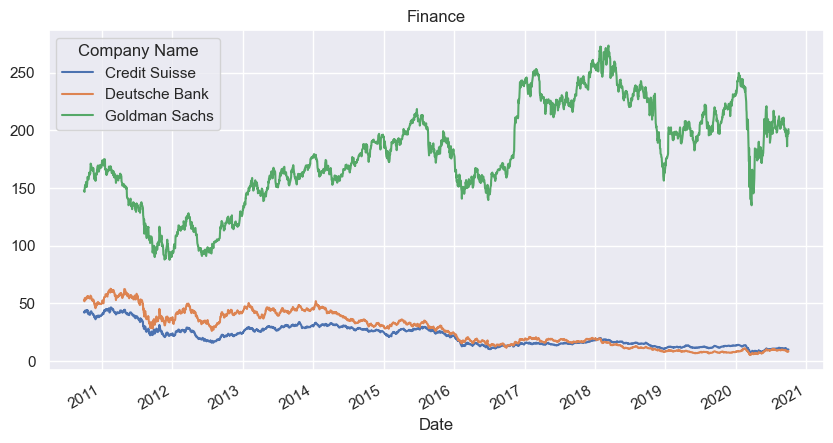

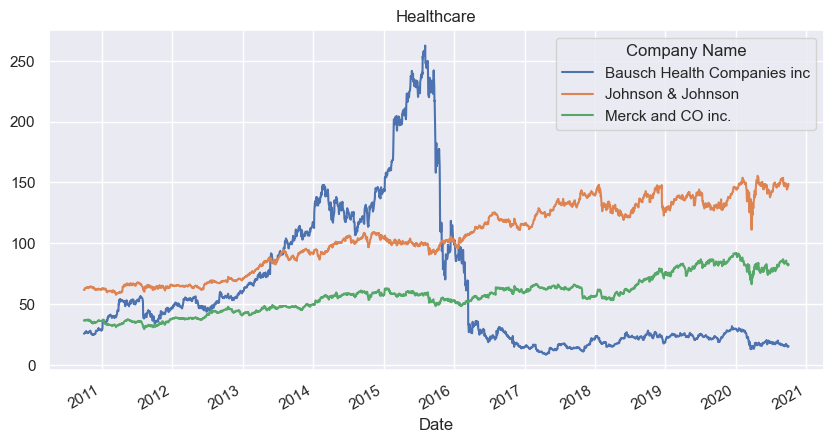

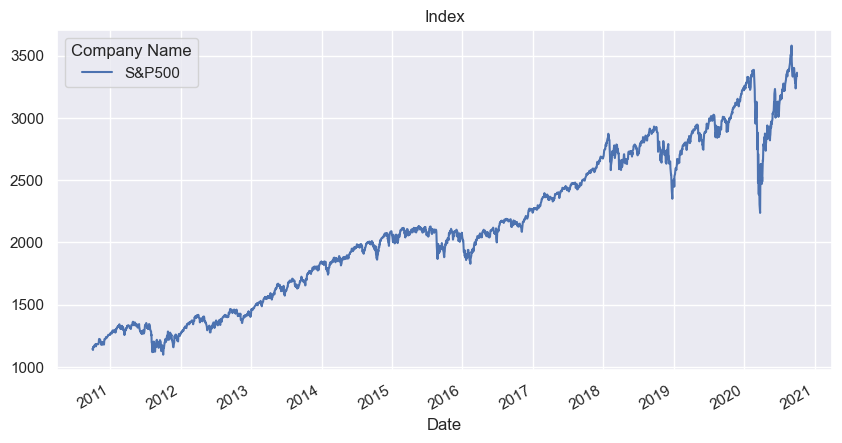

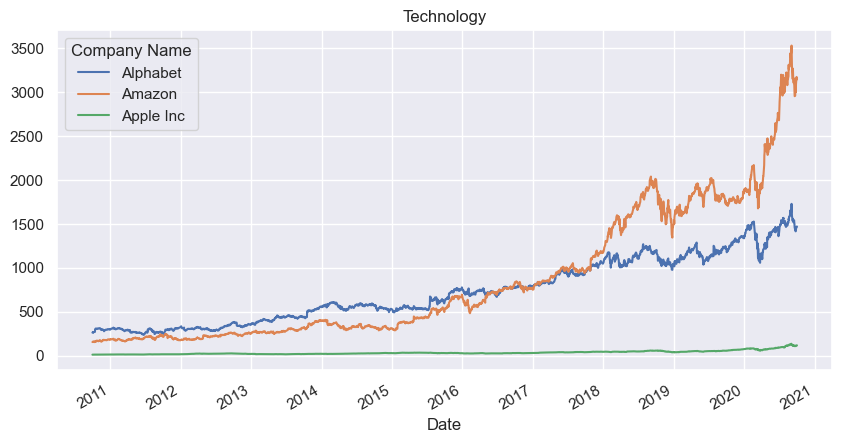

In [30]:
for i in dict(prices.columns).keys():
    prices[i].plot(title = i, figsize=(10,5))
    plt.title(i)
    plt.show()



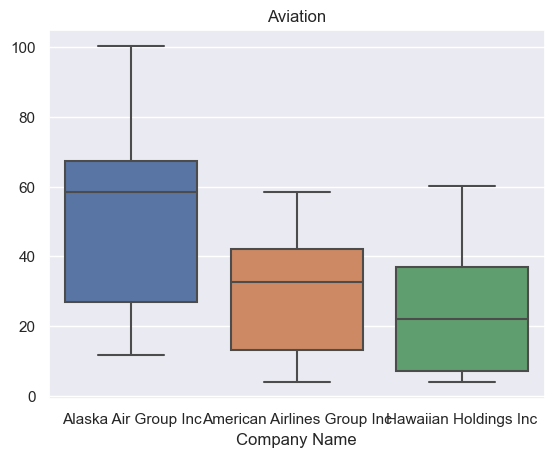

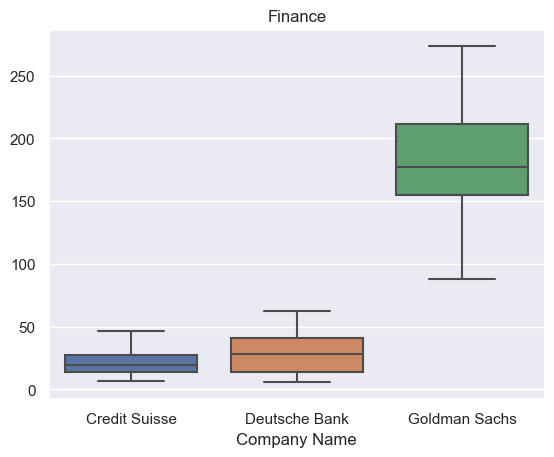

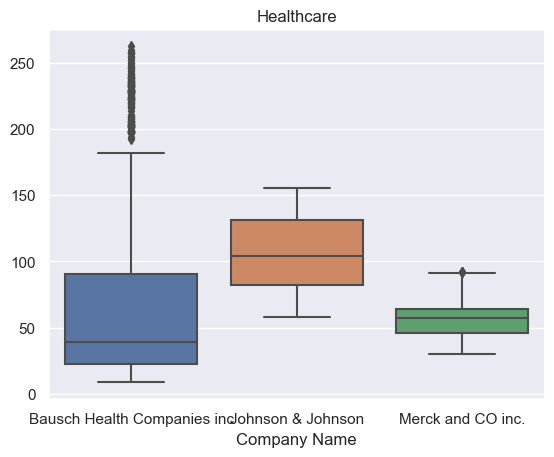

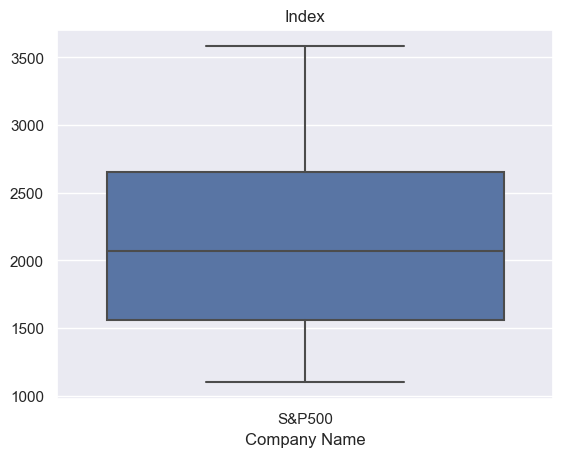

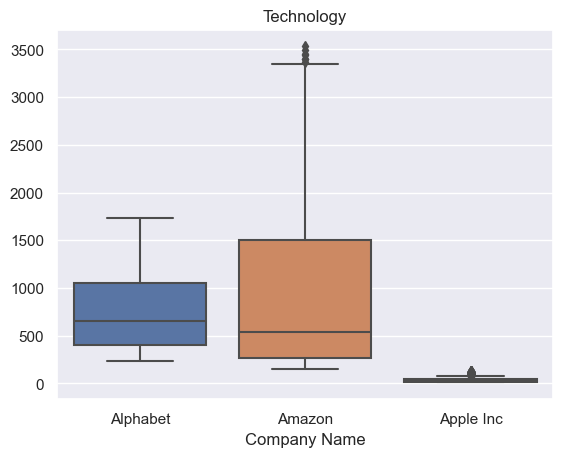

In [31]:
for i in dict(prices.columns).keys():
    sns.boxplot(prices[i])
    plt.title(i)
    plt.show()

## Normalized Price Charts

In [32]:
prices_normalized=prices/prices.iloc[0]

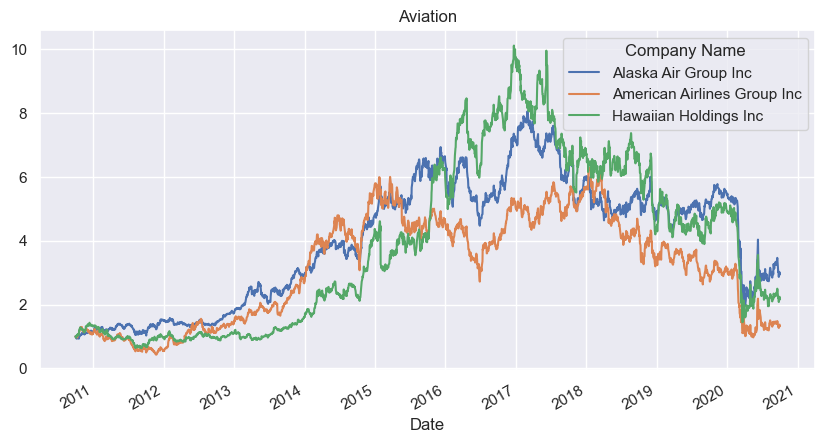

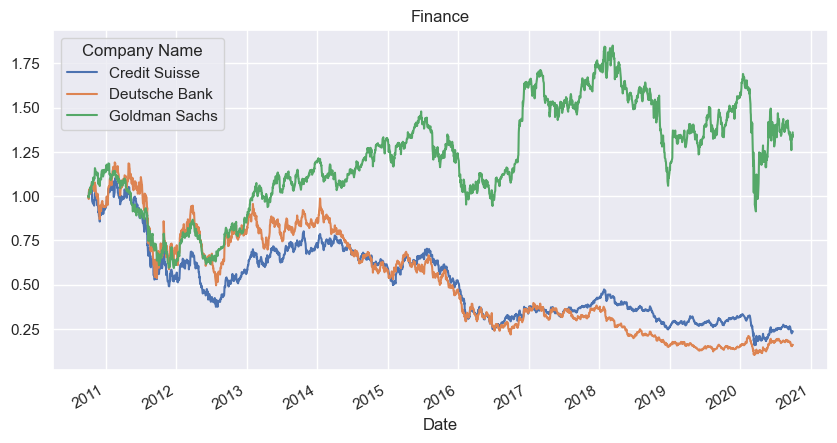

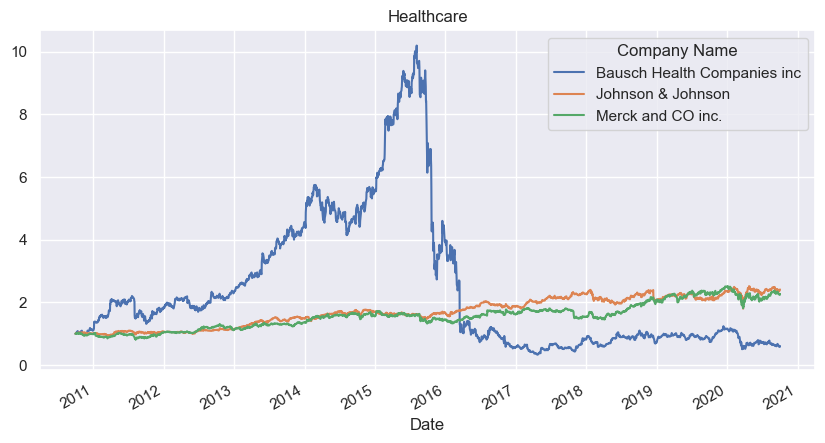

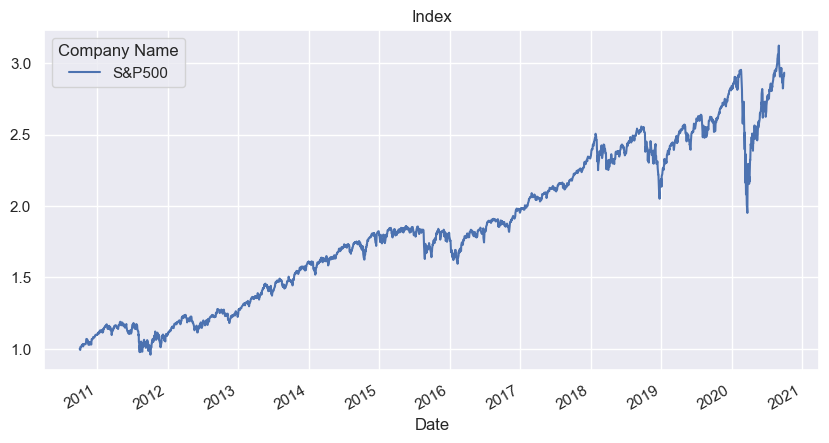

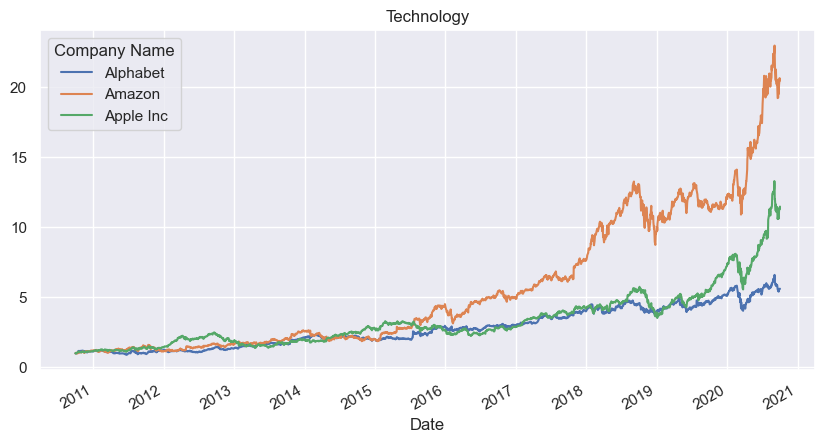

In [33]:
for i in dict(prices_normalized.columns).keys():
    prices_normalized[i].plot(title = i, figsize=(10,5))
    plt.title(i)
    plt.show()


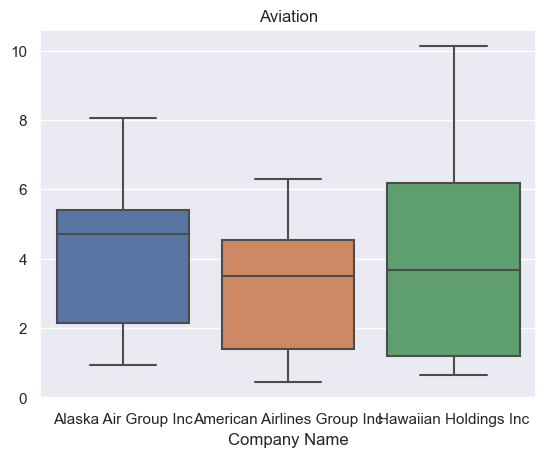

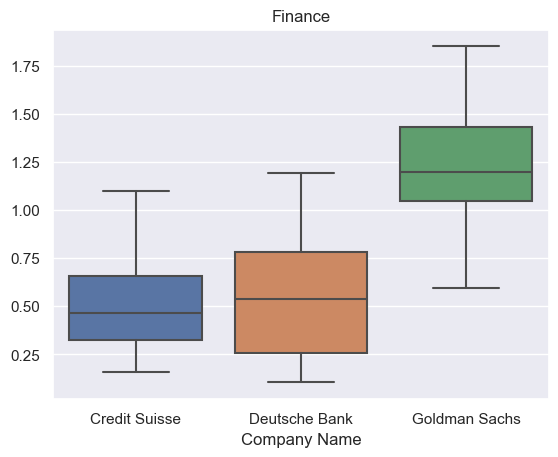

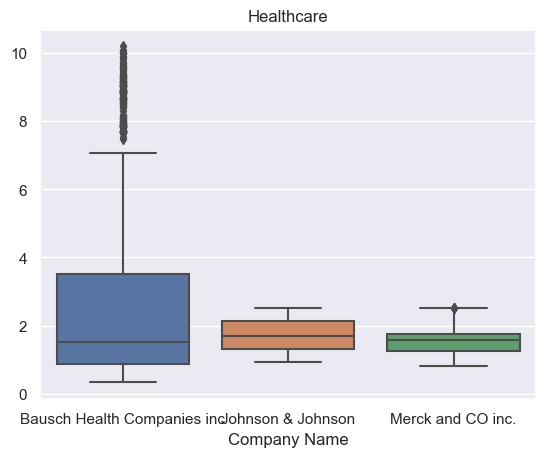

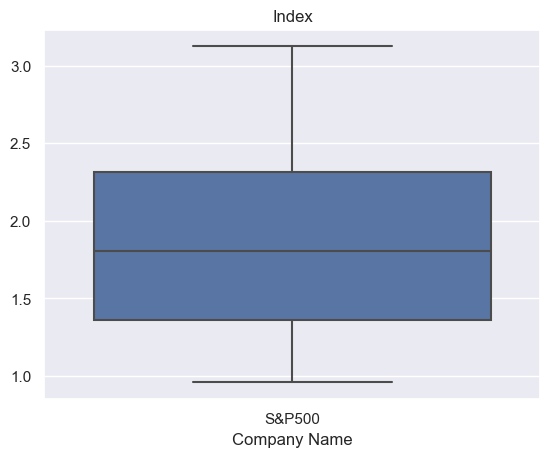

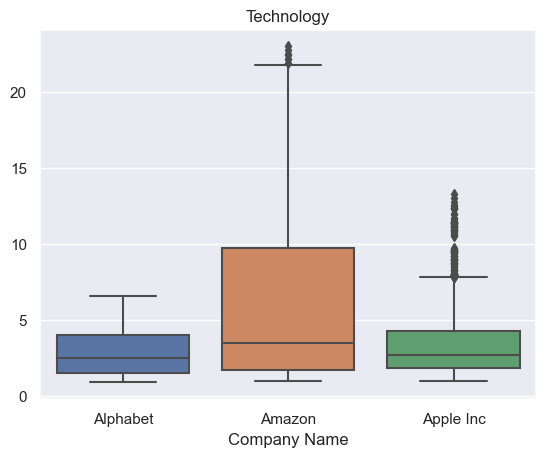

In [34]:
for i in dict(prices.columns).keys():
    sns.boxplot(prices_normalized[i])
    plt.title(i)
    plt.show()

## Industry Wise Price Variation
Assuming the price action of an industry is the mean of the prices of the stocks of the companies belonging to an industry

In [35]:
industry_prices=pd.pivot_table(data=data,values='Close',index='Date',columns='Industry',aggfunc='mean')
industry_prices.head()

Industry,Aviation,Finance,Healthcare,Index,Technology
Date,,,,,
2010-10-01,9.232500,80.840660,41.366666,1146.239990,141.876207
2010-10-04,9.004167,80.079932,41.353333,1137.030029,141.847045
2010-10-05,9.098333,82.224895,42.039999,1160.750000,146.433109
2010-10-06,9.129167,82.962092,42.303333,1159.969971,143.968505
2010-10-07,9.005000,82.939378,42.176667,1158.060059,143.538234


In [36]:
industry_prices.shape

(2517, 5)

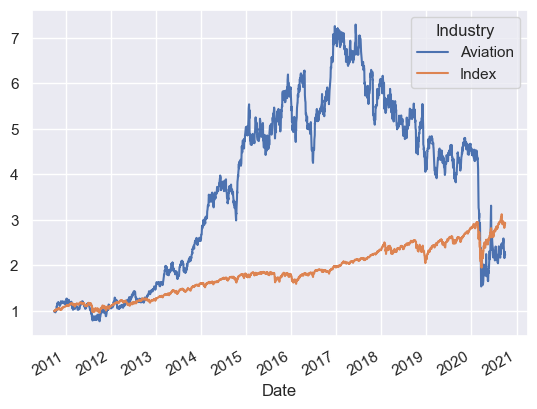

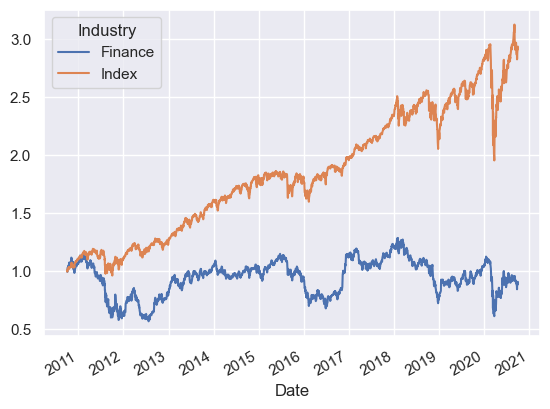

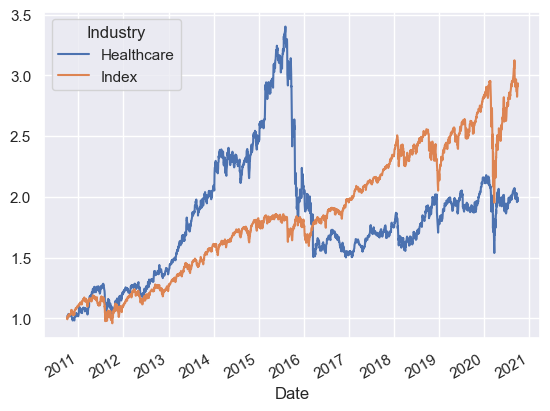

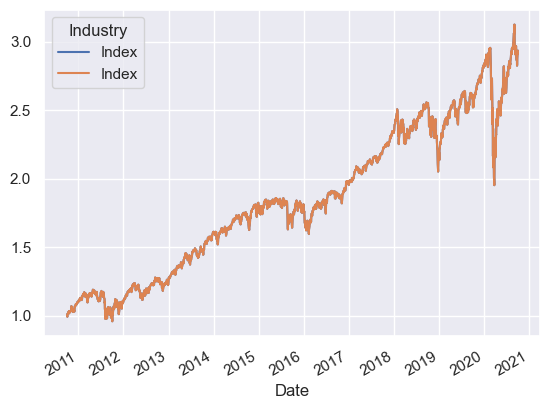

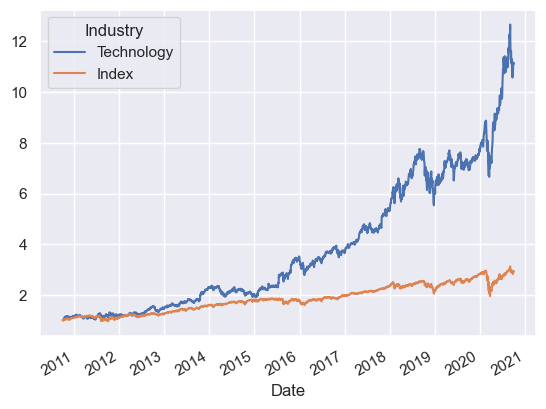

In [37]:
norm=industry_prices/industry_prices.iloc[0]
for i in industry_prices.columns:
    norm[[i,'Index']].plot()
    plt.show()

## Histograms of Price Fluctuations About Thier Means

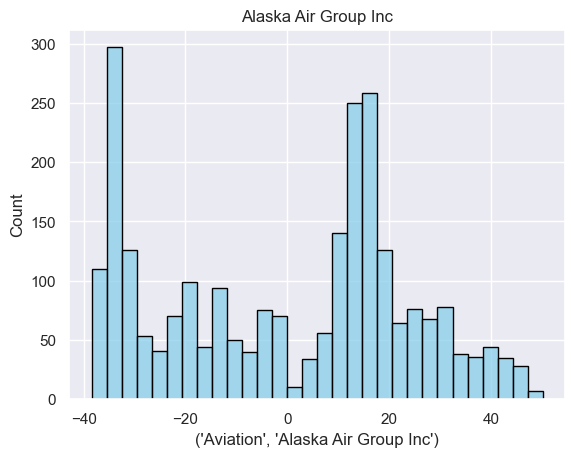

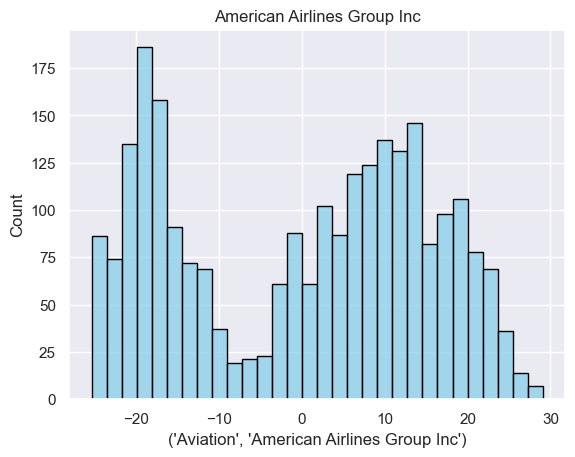

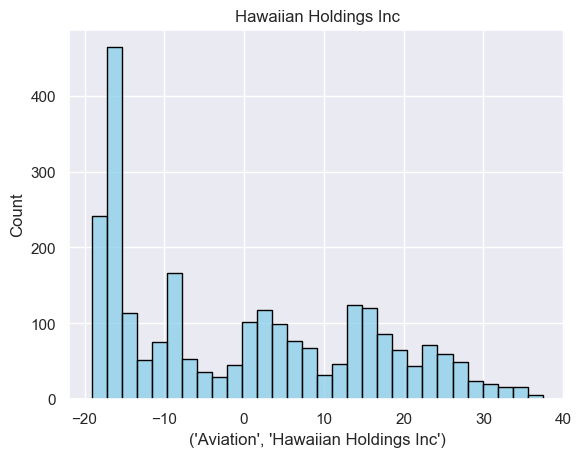

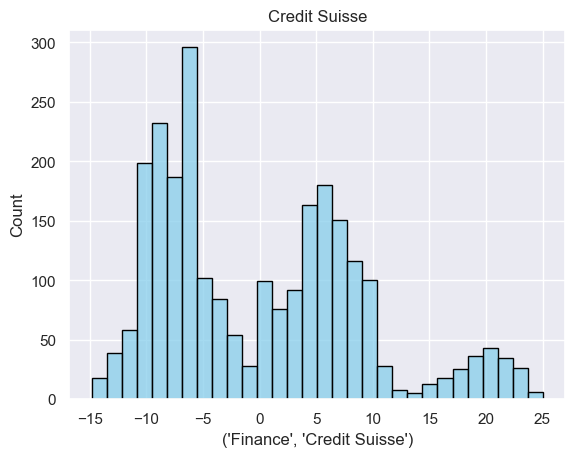

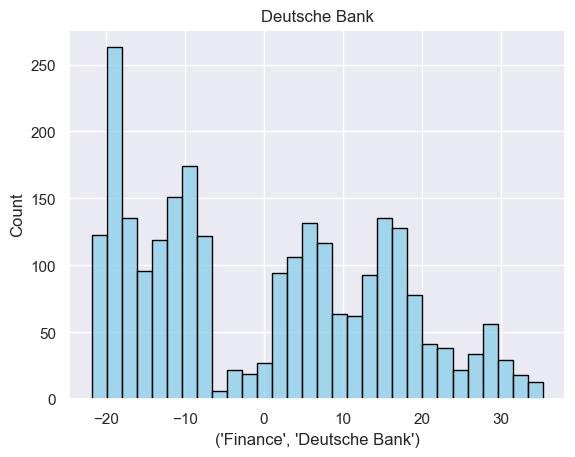

...

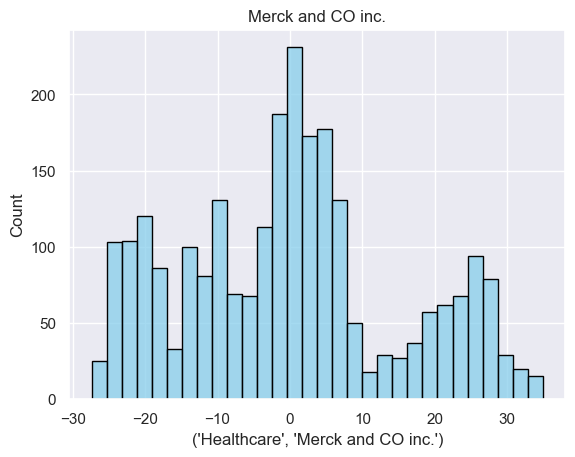

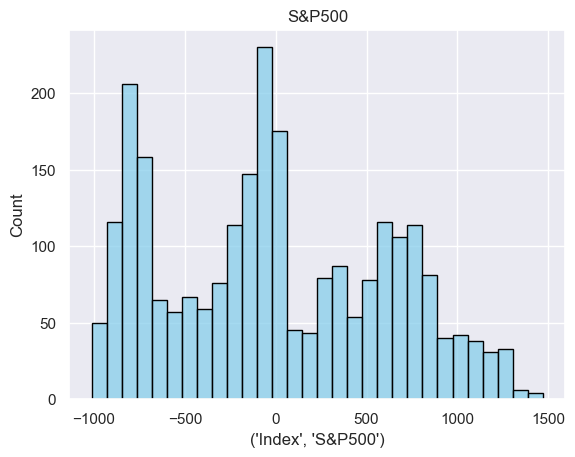

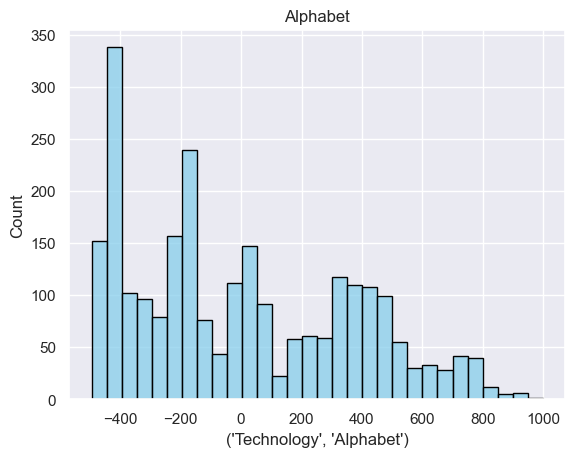

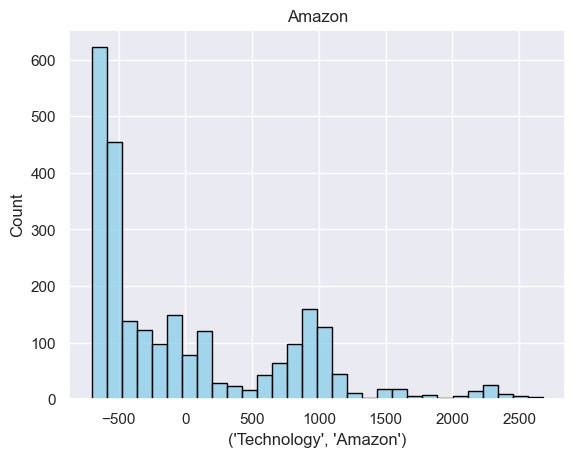

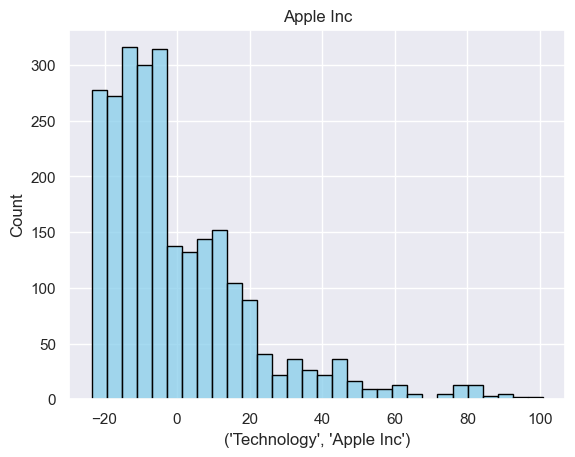

In [38]:
for i,j in prices.columns:
    mean=np.mean(prices[i,j])
    deviation=prices[i,j]-mean
    sns.histplot(deviation,bins=30, color='skyblue', edgecolor='black')
    plt.title(j)
    plt.show()

## Highest And Least Prices Of Each Company's Stock Between Oct 2010 to Sep 2020

In [39]:
prices.agg(['min','max'])

Industry                 Aviation                              \
Company Name Alaska Air Group Inc American Airlines Group Inc   
min                     11.620000                    4.000000   
max                    100.239998                   58.470001   

Industry                                 Finance                              \
Company Name Hawaiian Holdings Inc Credit Suisse Deutsche Bank Goldman Sachs   
min                       3.780000      6.670000      5.480000     87.699997   
max                      60.299999     46.513672     62.624046    273.380005   

Industry                      Healthcare                                      \
Company Name Bausch Health Companies inc Johnson & Johnson Merck and CO inc.   
min                             8.510000         57.660000         29.809999   
max                           262.519989        155.509995         92.040001   

Industry            Index   Technology                           
Company Name       S&P500     Alphabet       Amazon   Apple Inc  
min           1099.229980   236.553345   153.029999    9.951428  
max           3580.840088  1728.280029  3531.449951  134.179993

In [40]:
price_change=prices.pct_change()
price_change.dropna(inplace=True)

In [41]:
price_change.head()

Industry                 Aviation                              \
Company Name Alaska Air Group Inc American Airlines Group Inc   
Date                                                            
2010-10-04              -0.024503                   -0.018299   
2010-10-05               0.005971                    0.012061   
2010-10-06              -0.002251                    0.000000   
2010-10-07              -0.046154                    0.001083   
2010-10-08               0.036344                   -0.018398   

Industry                                 Finance                              \
Company Name Hawaiian Holdings Inc Credit Suisse Deutsche Bank Goldman Sachs   
Date                                                                           
2010-10-04               -0.035235     -0.007401     -0.015965     -0.007651   
2010-10-05                0.017391      0.029590      0.042404      0.020468   
2010-10-06                0.020513      0.006563      0.012204      0.008491   
2010-10-07                0.030151      0.005396     -0.010484      0.001790   
2010-10-08                0.000000     -0.015653     -0.003002      0.010257   

Industry                      Healthcare                                      \
Company Name Bausch Health Companies inc Johnson & Johnson Merck and CO inc.   
Date                                                                           
2010-10-04                      0.004660         -0.001296         -0.002186   
2010-10-05                      0.016621          0.018323          0.013691   
2010-10-06                      0.014829          0.006529         -0.000270   
2010-10-07                     -0.003372          0.000158         -0.008106   
2010-10-08                      0.009023          0.000158          0.005448   

Industry         Index Technology                      
Company Name    S&P500   Alphabet    Amazon Apple Inc  
Date                                                   
2010-10-04   -0.008035  -0.006221  0.010930 -0.013734  
2010-10-05    0.020861   0.030401  0.035266  0.036965  
2010-10-06   -0.000672  -0.007209 -0.034003  0.000865  
2010-10-07   -0.001647  -0.008122  0.005599  0.000104  
2010-10-08    0.006122   0.011962 -0.004607  0.016769

## Distribution Of Daily Price Changes Of Each Stock

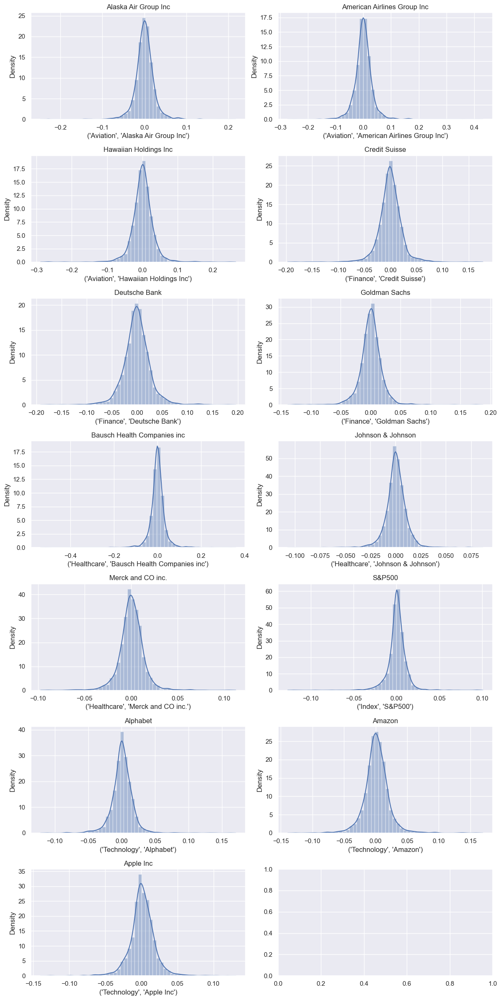

In [42]:
fig, axes = plt.subplots(7, 2, figsize=(12, 24))  # Create a figure with 7 rows and 2 columns of subplots

for (i, j), ax in zip(prices.columns, axes.flatten()):
    sns.distplot(price_change[i, j], ax=ax)
    ax.set_title(j)
    
plt.tight_layout()    
plt.show()
    

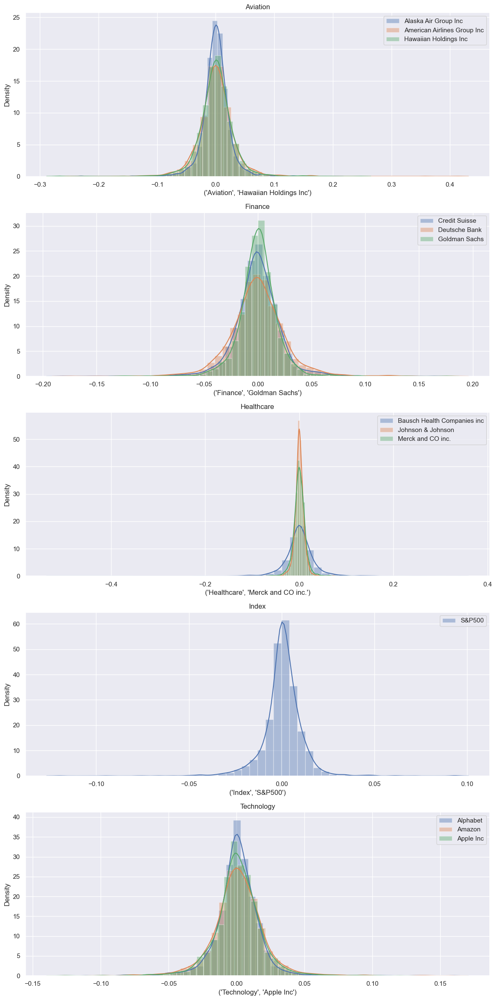

In [43]:
fig, axes = plt.subplots(5, 1, figsize=(12, 24))
for i,ax in  zip(dict(prices.columns).keys(), axes.flatten()):
    for j in prices[i].columns:
        sns.distplot(price_change[i, j], hist=True,label=j,ax=ax)
        ax.set_title(i)
        ax.legend()
plt.tight_layout()
plt.show()

In [44]:
# Risk in each Stock considering that they are indiependent
Risk=price_change.std().reset_index()
Risk.columns=['Industry', 'Company Name', 'Risk']
Risk=Risk.sort_values(by='Risk',ascending=True).reset_index().drop('index',axis=1)
Risk['Risk_Rank']=Risk.index+1
Risk

,Industry,Company Name,Risk,Risk_Rank
0,Healthcare,Johnson & Johnson,0.010847,1
1,Index,S&P500,0.010934,2
2,Healthcare,Merck and CO inc.,0.013049,3
3,Technology,Alphabet,0.016288,4
4,Technology,Apple Inc,0.017719,5
5,Finance,Goldman Sachs,0.018331,6
6,Technology,Amazon,0.019889,7
7,Finance,Credit Suisse,0.022206,8
8,Aviation,Alaska Air Group Inc,0.023562,9
9,Finance,Deutsche Bank,0.026374,10


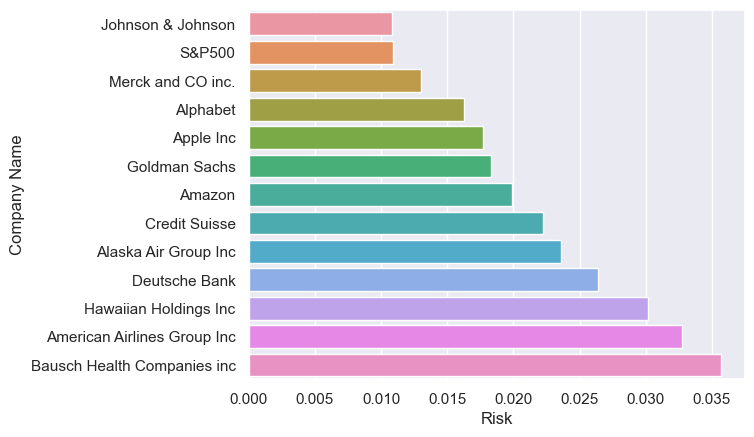

In [45]:
sns.barplot(data=Risk,y='Company Name',x='Risk')
plt.show()

In [46]:
# Mean Daily Returns
Returns=price_change.mean().reset_index()
Returns.columns=['Industry', 'Company Name', 'Avg_Daily_Returns']
Returns=Returns.sort_values(by='Avg_Daily_Returns',ascending=False).reset_index().drop('index',axis=1)
Returns['Avg_Annual_Returns']=Returns['Avg_Daily_Returns']*252
Returns['Returns_Rank']=Returns.index+1
Returns

,Industry,Company Name,Avg_Daily_Returns,Avg_Annual_Returns,Returns_Rank
0,Technology,Amazon,0.001398,0.352201,1
1,Technology,Apple Inc,0.001128,0.284164,2
2,Technology,Alphabet,0.000818,0.206023,3
3,Aviation,Hawaiian Holdings Inc,0.000765,0.192824,4
4,Aviation,Alaska Air Group Inc,0.000709,0.178792,5
5,Aviation,American Airlines Group Inc,0.000637,0.160489,6
6,Index,S&P500,0.000488,0.122966,7
7,Healthcare,Bausch Health Companies inc,0.000464,0.116973,8
8,Healthcare,Merck and CO inc.,0.000410,0.103385,9
9,Healthcare,Johnson & Johnson,0.000409,0.103009,10


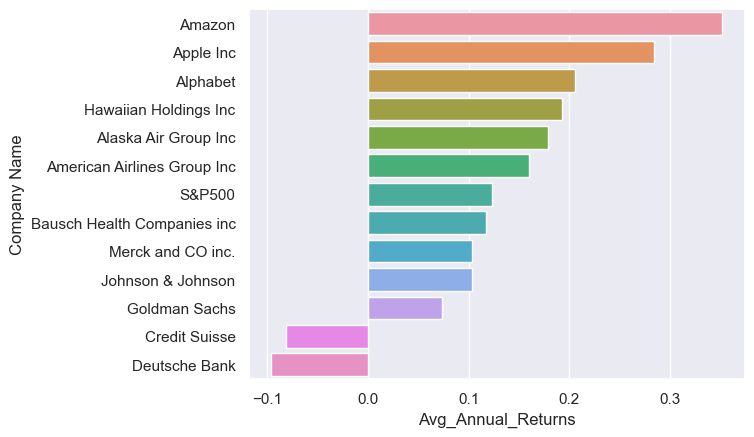

In [47]:
sns.barplot(data=Returns,y='Company Name',x='Avg_Annual_Returns')
plt.show()

In [48]:
# Cummulative Returns in the given time period
Cummulative=(price_change+1).cumprod()
Cummulative.tail()

Industry                 Aviation                              \
Company Name Alaska Air Group Inc American Airlines Group Inc   
Date                                                            
2020-09-24               2.868046                    1.266954   
2020-09-25               2.948383                    1.322928   
2020-09-28               3.015867                    1.373520   
2020-09-29               2.945973                    1.318622   
2020-09-30               2.942760                    1.322928   

Industry                                 Finance                              \
Company Name Hawaiian Holdings Inc Credit Suisse Deutsche Bank Goldman Sachs   
Date                                                                           
2020-09-24                2.080537      0.227819      0.154196      1.320989   
2020-09-25                2.147651      0.224503      0.152104      1.319905   
2020-09-28                2.244966      0.234450      0.160280      1.347800   
2020-09-29                2.157718      0.232792      0.157238      1.332363   
2020-09-30                2.162752      0.236107      0.159710      1.360664   

Industry                      Healthcare                                      \
Company Name Bausch Health Companies inc Johnson & Johnson Merck and CO inc.   
Date                                                                           
2020-09-24                      0.591068          2.342834          2.271858   
2020-09-25                      0.594175          2.358866          2.265847   
2020-09-28                      0.593010          2.382348          2.261202   
2020-09-29                      0.577864          2.381538          2.237705   
2020-09-30                      0.603495          2.411012          2.266393   

Industry         Index Technology                        
Company Name    S&P500   Alphabet     Amazon  Apple Inc  
Date                                                     
2020-09-24    2.832382   5.455057  19.646021  10.725471  
2020-09-25    2.877635   5.518724  20.136164  11.127849  
2020-09-28    2.923995   5.593430  20.649599  11.393459  
2020-09-29    2.909923   5.611801  20.459825  11.307234  
2020-09-30    2.933941   5.612832  20.484873  11.477700

In [49]:
Risk_return=pd.merge(Risk[['Company Name','Risk']],Returns[['Company Name','Avg_Annual_Returns']],on='Company Name')
Risk_return['Annual_Risk']=(252**0.5)*Risk_return['Risk']
Risk_return

,Company Name,Risk,Avg_Annual_Returns,Annual_Risk
0,Johnson & Johnson,0.010847,0.103009,0.172187
1,S&P500,0.010934,0.122966,0.173574
2,Merck and CO inc.,0.013049,0.103385,0.207142
3,Alphabet,0.016288,0.206023,0.258561
4,Apple Inc,0.017719,0.284164,0.281273
5,Goldman Sachs,0.018331,0.073212,0.290996
6,Amazon,0.019889,0.352201,0.315735
7,Credit Suisse,0.022206,-0.081888,0.352509
8,Alaska Air Group Inc,0.023562,0.178792,0.374043
9,Deutsche Bank,0.026374,-0.096102,0.418676


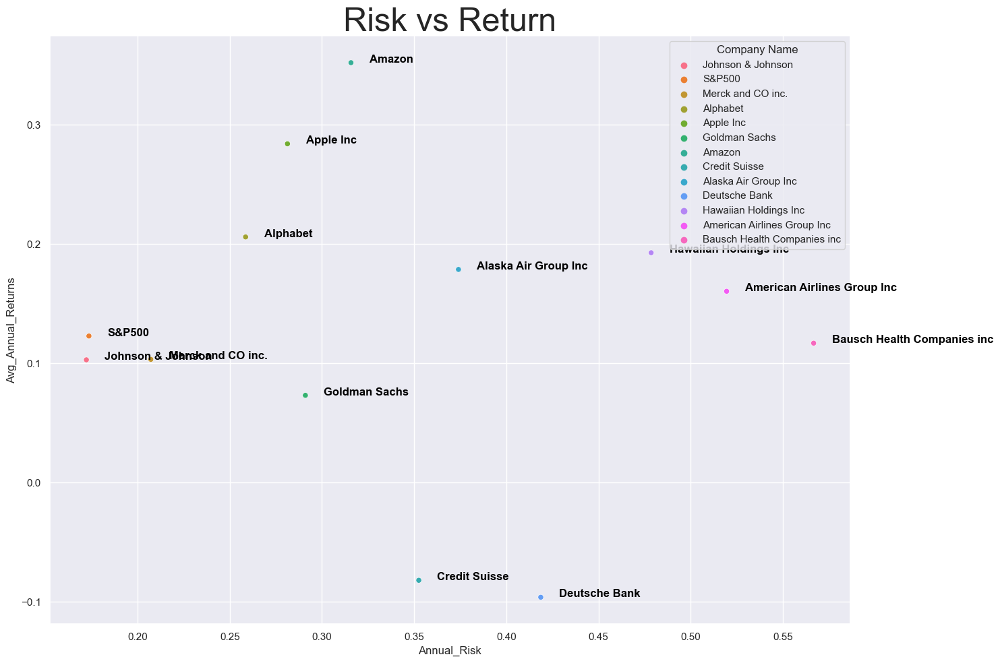

In [50]:
plt.figure(figsize=[15,10])
# Create the scatter plot
scatterplot = sns.scatterplot(data=Risk_return,x='Annual_Risk',y='Avg_Annual_Returns',hue='Company Name',legend='brief')

# Add annotations for each point
for line in range(0, Risk.shape[0]):
     scatterplot.text(Risk_return['Annual_Risk'][line]+0.01, Risk_return['Avg_Annual_Returns'][line], 
                      Risk_return['Company Name'][line], horizontalalignment='left', 
                      size='medium', color='black', weight='semibold')

plt.title('Risk vs Return',size=35)
plt.tight_layout()
# Show the plot
plt.show()

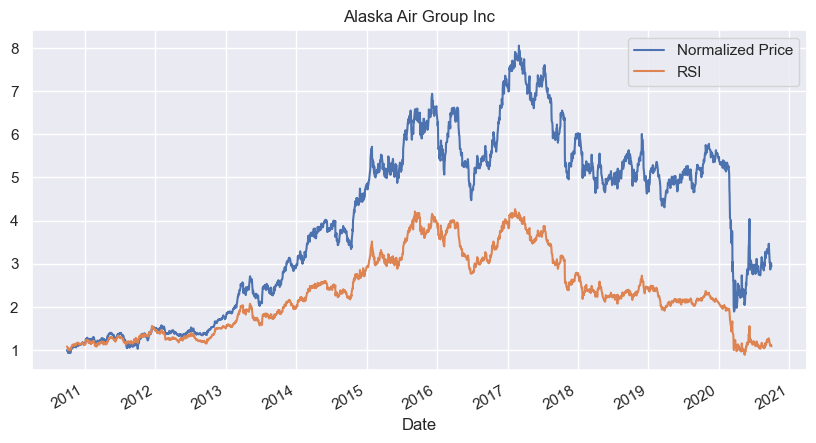

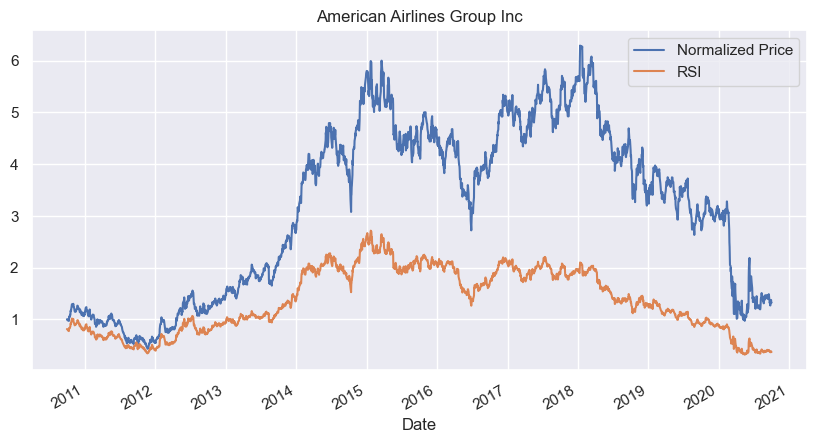

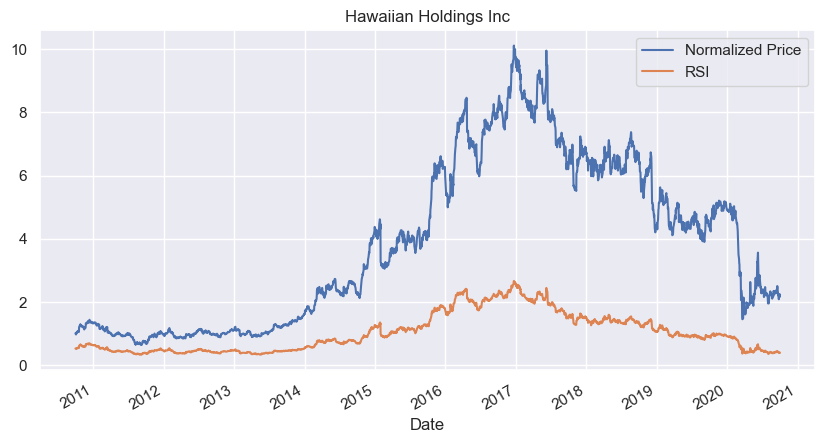

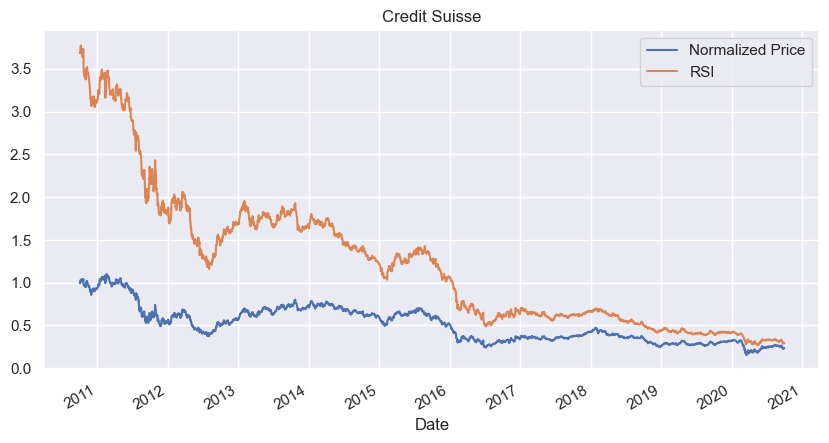

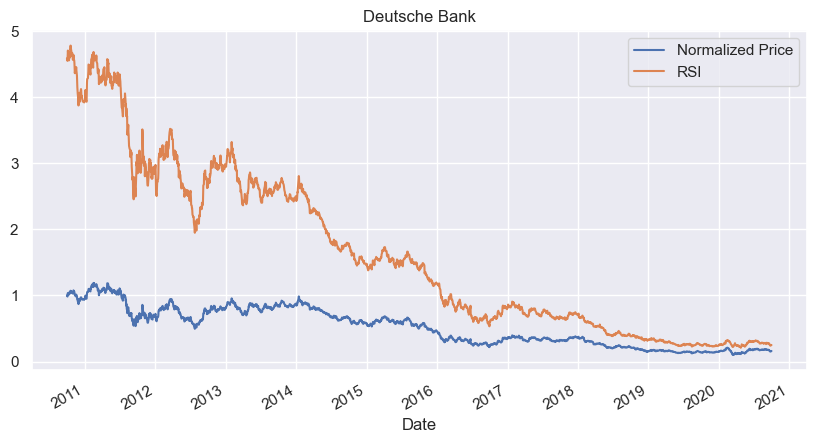

...

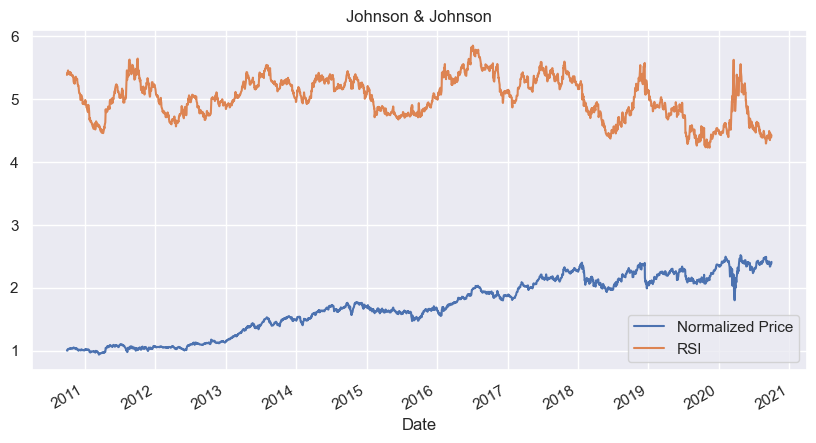

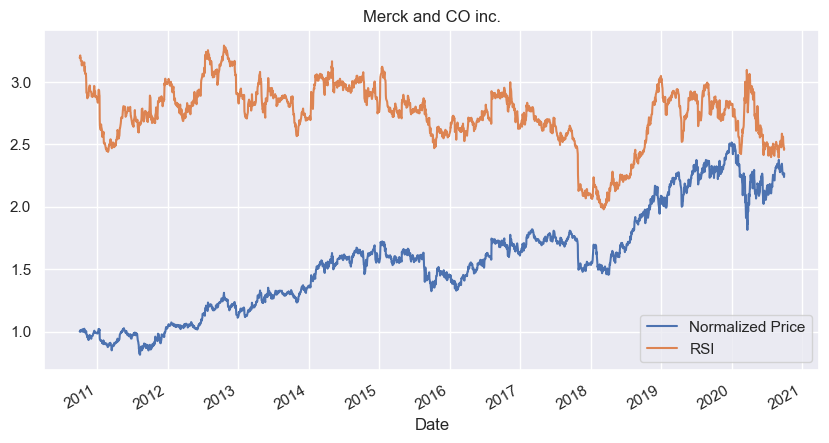

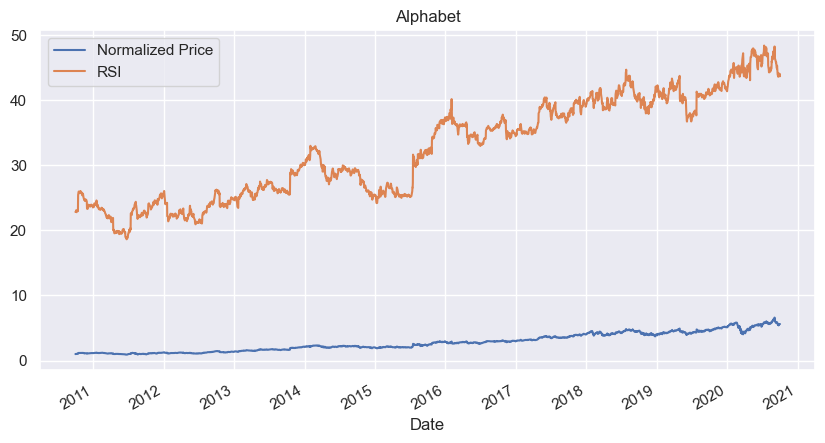

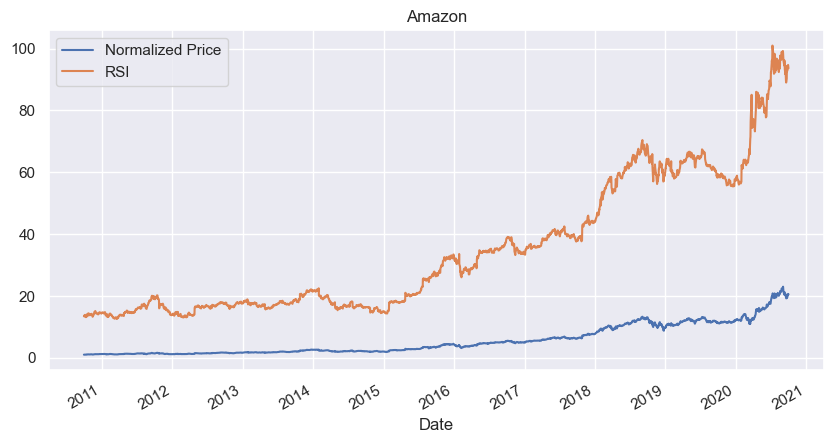

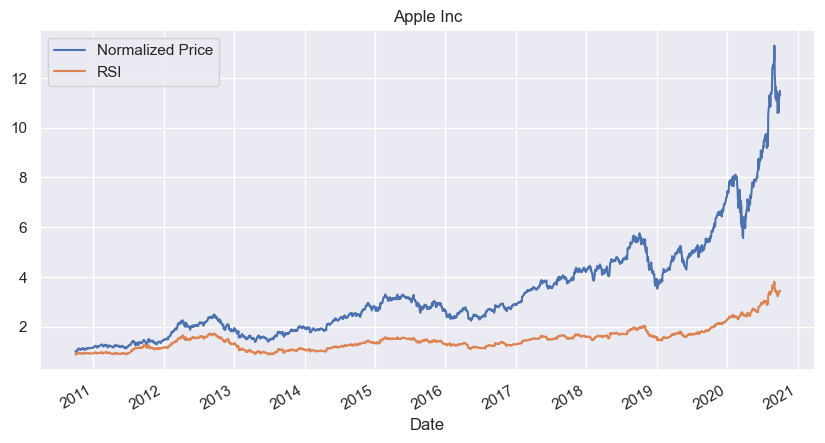

In [51]:
#RSI for each stock
for i,j in prices.columns:
    if i!='Index':
        plt.figure(figsize=[10,5])
        prices_normalized[i,j].plot(label='Normalized Price')
        (100*prices[i,j]/prices['Index','S&P500']).plot(label='RSI')
        plt.title(j)
        plt.legend()
        plt.show()

In [52]:
RSI=prices.copy()
for i,j in prices.columns:
    if i != 'Index':
        RSI[i,j]=prices[i,j]/prices['Index','S&P500']
RSI.head()        

Industry                 Aviation                              \
Company Name Alaska Air Group Inc American Airlines Group Inc   
Date                                                            
2010-10-01               0.010859                    0.008105   
2010-10-04               0.010679                    0.008021   
2010-10-05               0.010523                    0.007952   
2010-10-06               0.010507                    0.007957   
2010-10-07               0.010038                    0.007979   

Industry                                 Finance                              \
Company Name Hawaiian Holdings Inc Credit Suisse Deutsche Bank Goldman Sachs   
Date                                                                           
2010-10-01                0.005200      0.036839      0.045885      0.128856   
2010-10-04                0.005057      0.036863      0.045518      0.128906   
2010-10-05                0.005040      0.037178      0.046479      0.128856   
2010-10-06                0.005147      0.037447      0.047078      0.130038   
2010-10-07                0.005311      0.037711      0.046661      0.130485   

Industry                      Healthcare                                      \
Company Name Bausch Health Companies inc Johnson & Johnson Merck and CO inc.   
Date                                                                           
2010-10-01                      0.022465          0.053872          0.031930   
2010-10-04                      0.022752          0.054238          0.032119   
2010-10-05                      0.022658          0.054103          0.031893   
2010-10-06                      0.023009          0.054493          0.031906   
2010-10-07                      0.022969          0.054591          0.031700   

Industry            Index Technology                      
Company Name       S&P500   Alphabet    Amazon Apple Inc  
Date                                                      
2010-10-01    1146.239990   0.228424  0.134099  0.008803  
2010-10-04    1137.030029   0.228842  0.136663  0.008752  
2010-10-05    1160.750000   0.230980  0.138591  0.008890  
2010-10-06    1159.969971   0.229469  0.133969  0.008904  
2010-10-07    1158.060059   0.227981  0.134941  0.008919

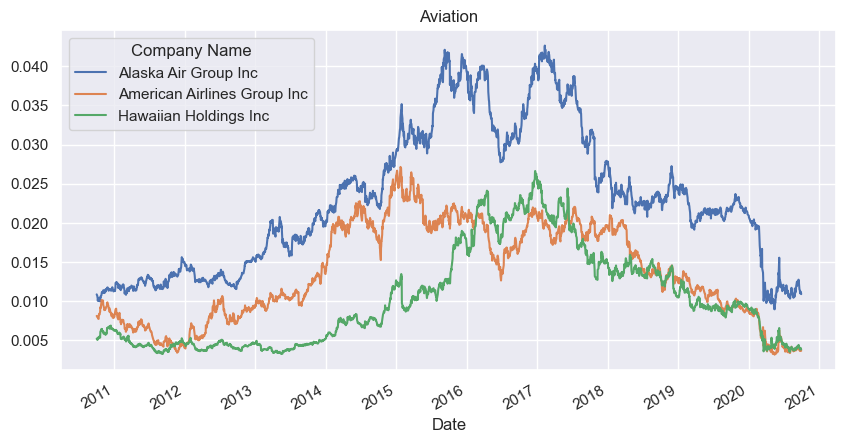

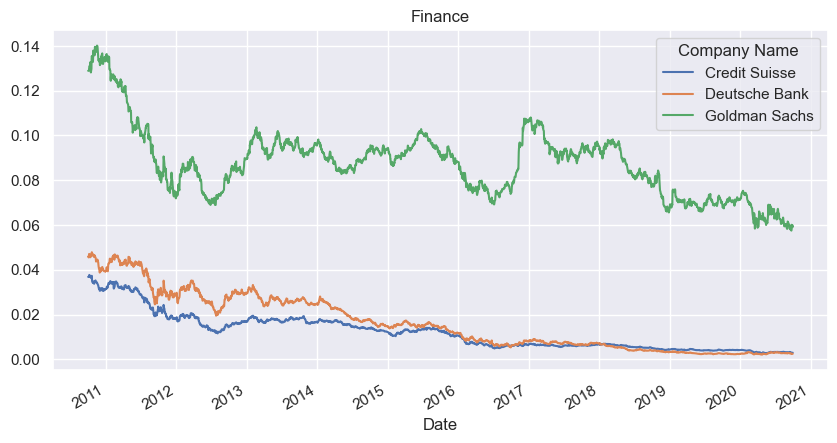

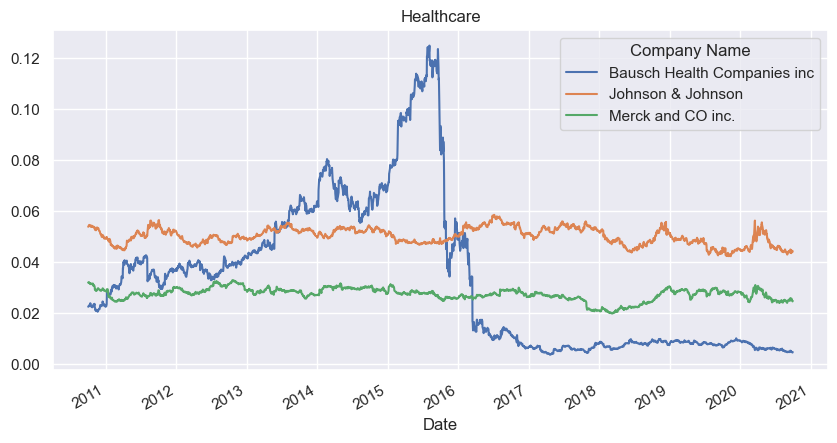

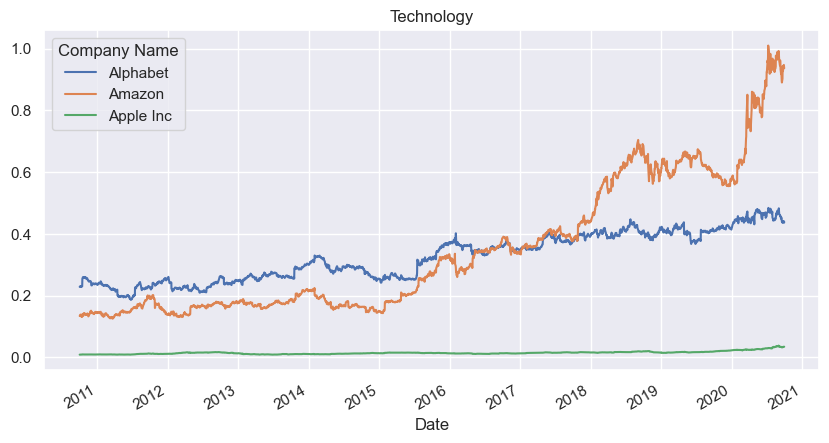

In [53]:
# Industry wise RSI comparision 
for i in dict(prices.columns).keys():
    if i != 'Index':
        (RSI[i]).plot(title = i, figsize=(10,5))
        plt.title(i)
        plt.show()

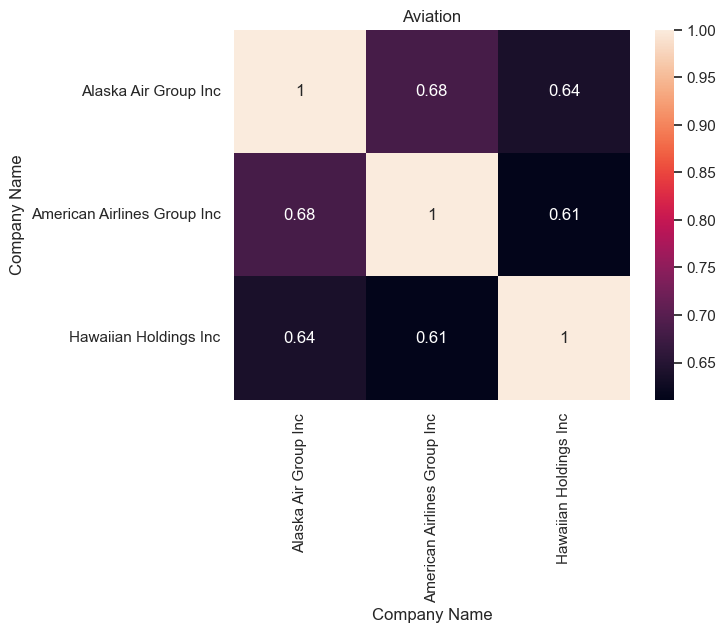

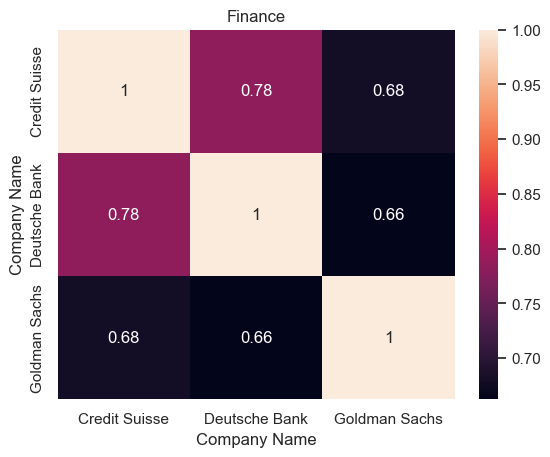

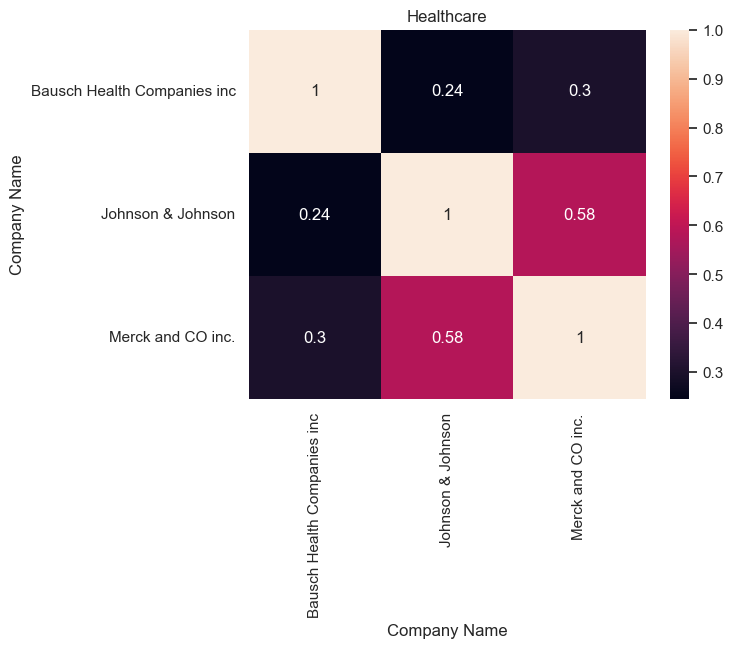

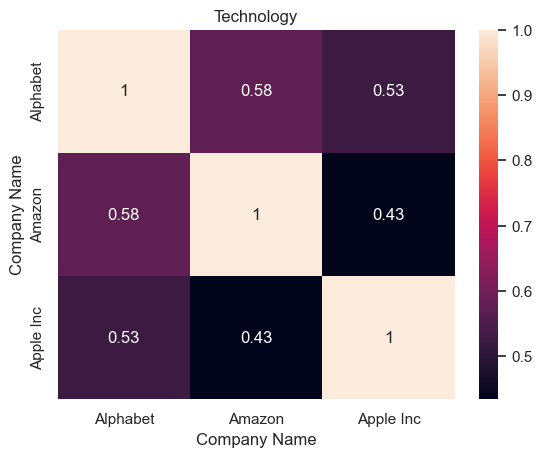

In [54]:
for i in dict(price_change.columns).keys():
    if i!='Index':
        col=[]
        for n,m in price_change.columns:
            if n==i:
                col.append(m)
        sns.heatmap(price_change[i][col].corr(),annot=True)
        plt.title(i)
        plt.show()

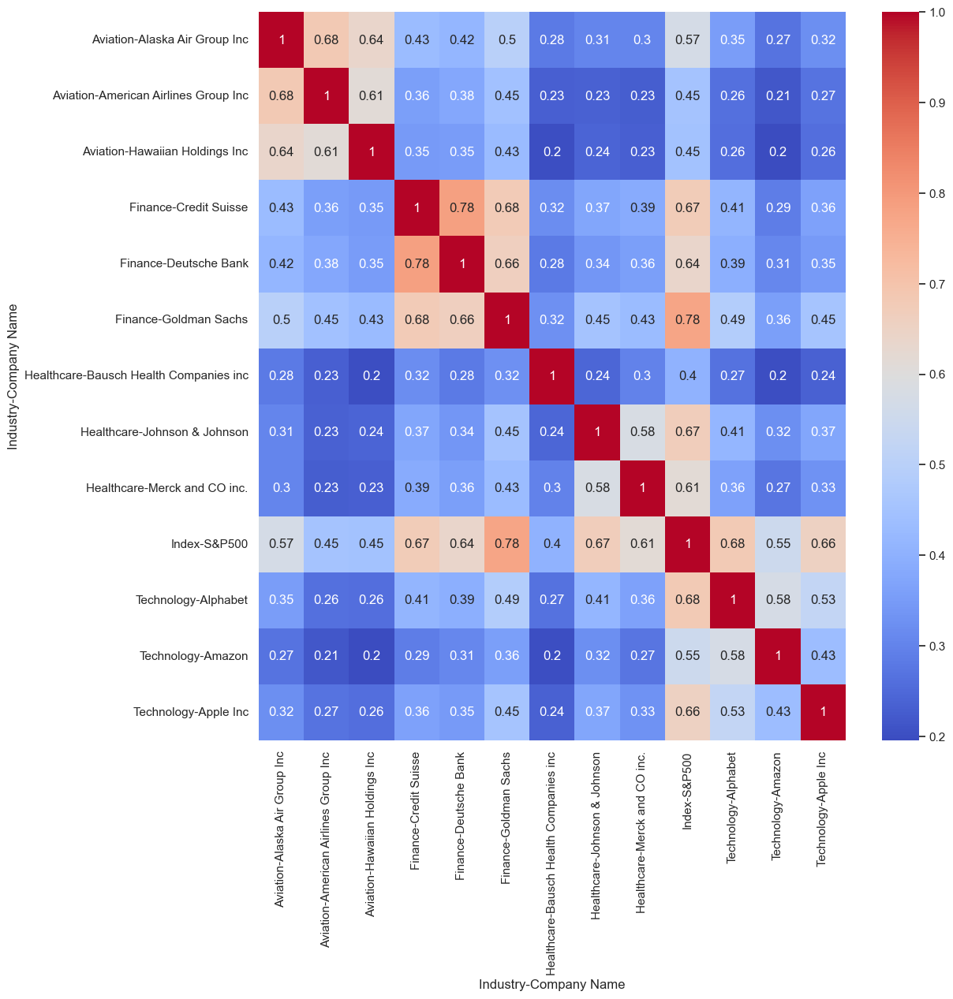

In [55]:
plt.figure(figsize=(12,12))
sns.heatmap(price_change.corr(),annot=True,cmap='coolwarm')
plt.show()

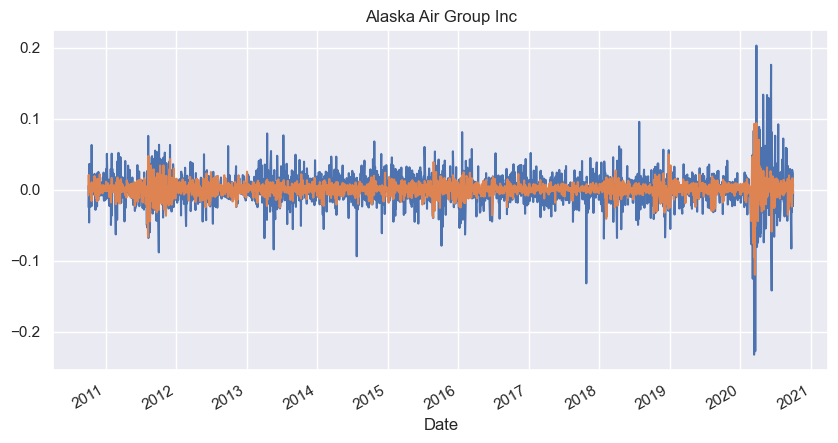

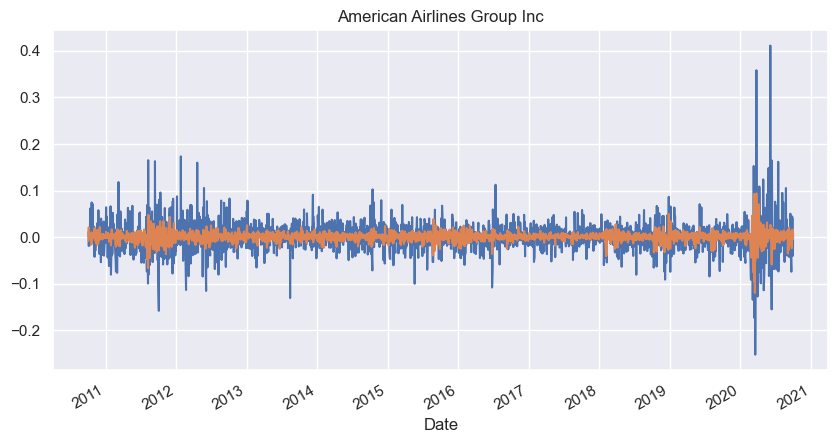

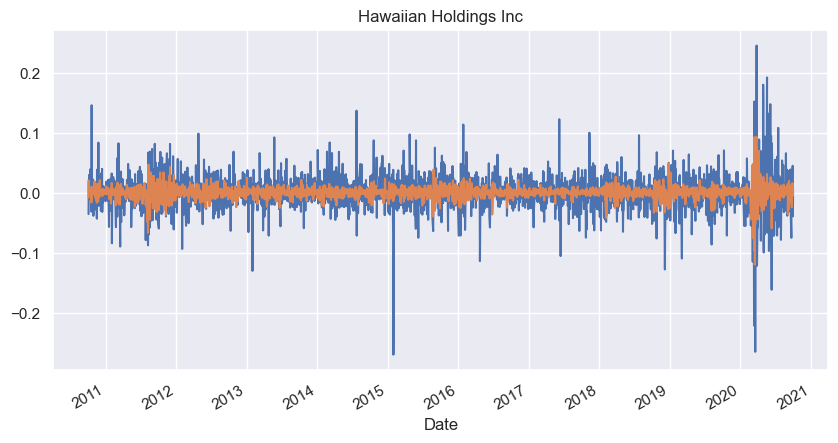

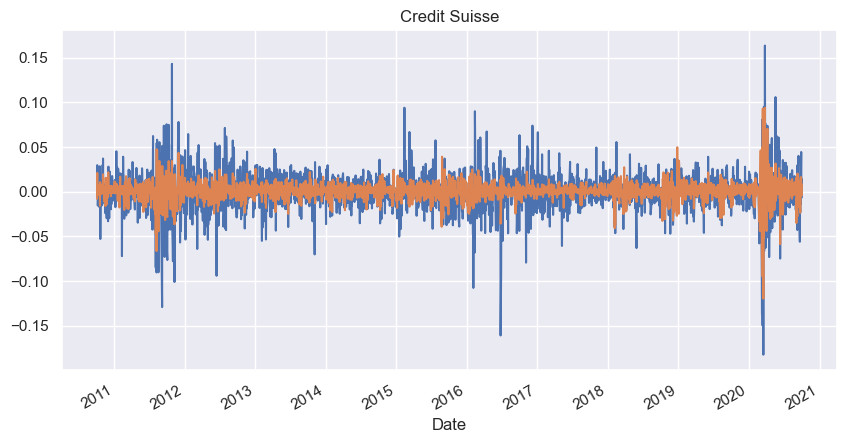

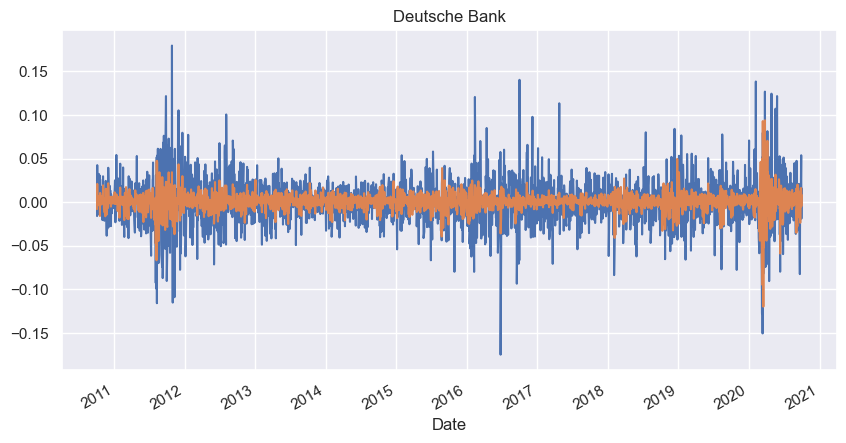

...

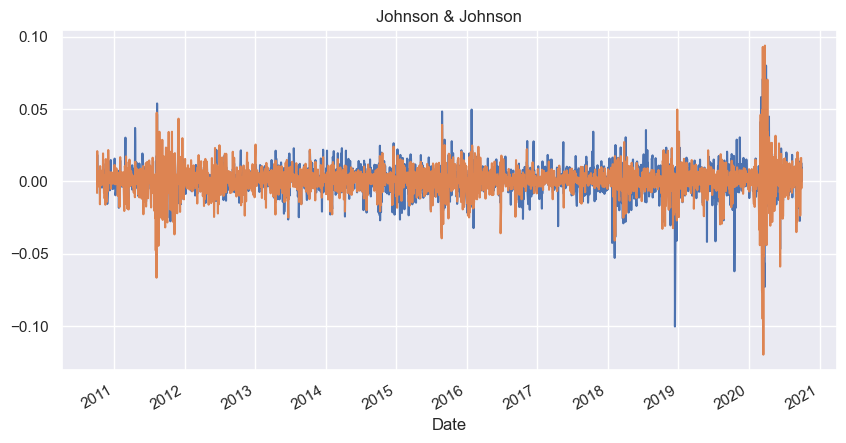

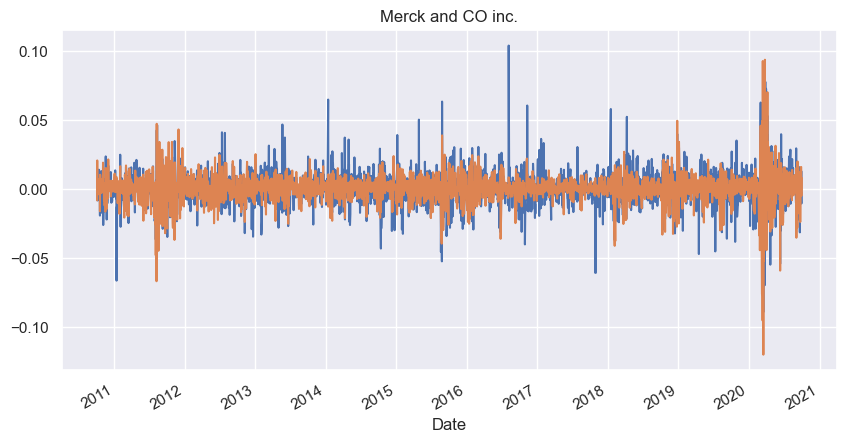

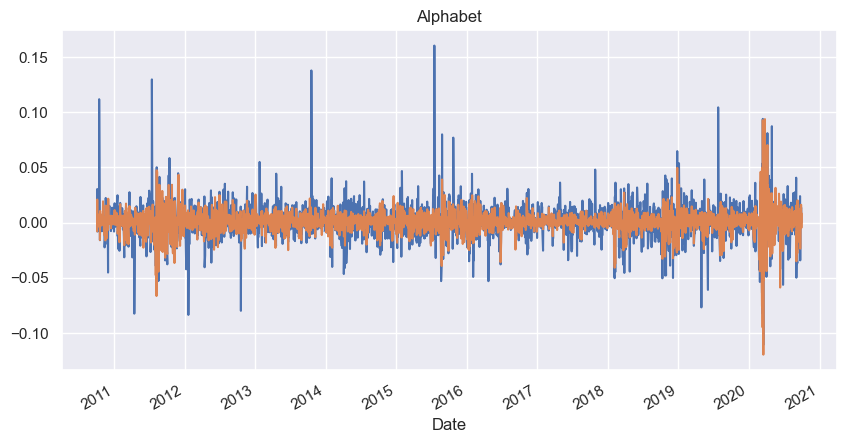

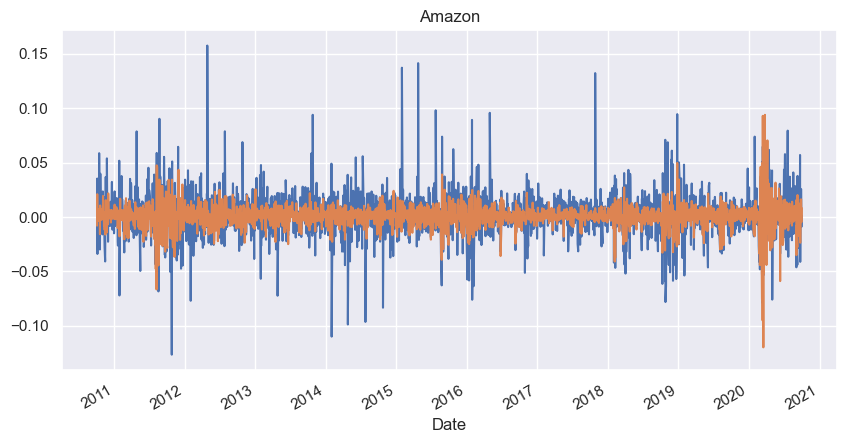

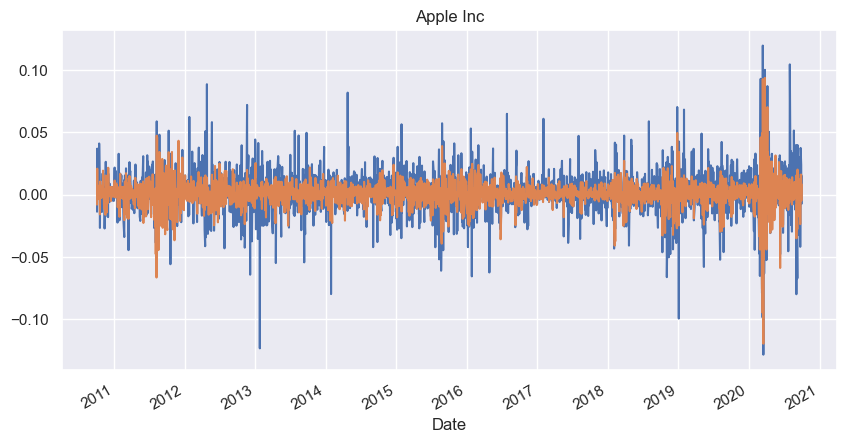

In [56]:
#Comparing the daily returns with market index returns
for i,j in price_change.columns:
    if i!='Index':
        plt.figure(figsize=[10,5])
        price_change[i,j].plot(label=j)
        price_change['Index','S&P500'].plot(label='S&P500')
        plt.title(j)
        plt.show()

In [57]:
Returns

,Industry,Company Name,Avg_Daily_Returns,Avg_Annual_Returns,Returns_Rank
0,Technology,Amazon,0.001398,0.352201,1
1,Technology,Apple Inc,0.001128,0.284164,2
2,Technology,Alphabet,0.000818,0.206023,3
3,Aviation,Hawaiian Holdings Inc,0.000765,0.192824,4
4,Aviation,Alaska Air Group Inc,0.000709,0.178792,5
5,Aviation,American Airlines Group Inc,0.000637,0.160489,6
6,Index,S&P500,0.000488,0.122966,7
7,Healthcare,Bausch Health Companies inc,0.000464,0.116973,8
8,Healthcare,Merck and CO inc.,0.000410,0.103385,9
9,Healthcare,Johnson & Johnson,0.000409,0.103009,10


In [58]:
#Calculating Sharp Ratio for each stock. 
Returns=pd.merge(Returns,Risk_return[['Company Name','Annual_Risk']],on='Company Name')



In [59]:
Returns

,Industry,Company Name,Avg_Daily_Returns,Avg_Annual_Returns,Returns_Rank,Annual_Risk
0,Technology,Amazon,0.001398,0.352201,1,0.315735
1,Technology,Apple Inc,0.001128,0.284164,2,0.281273
2,Technology,Alphabet,0.000818,0.206023,3,0.258561
3,Aviation,Hawaiian Holdings Inc,0.000765,0.192824,4,0.478573
4,Aviation,Alaska Air Group Inc,0.000709,0.178792,5,0.374043
5,Aviation,American Airlines Group Inc,0.000637,0.160489,6,0.519504
6,Index,S&P500,0.000488,0.122966,7,0.173574
7,Healthcare,Bausch Health Companies inc,0.000464,0.116973,8,0.566714
8,Healthcare,Merck and CO inc.,0.000410,0.103385,9,0.207142
9,Healthcare,Johnson & Johnson,0.000409,0.103009,10,0.172187


In [60]:
Returns['Sharp']=(Returns['Avg_Annual_Returns']-0.0075)/(Returns['Annual_Risk'])
Returns

,Industry,Company Name,Avg_Daily_Returns,Avg_Annual_Returns,Returns_Rank,Annual_Risk,Sharp
0,Technology,Amazon,0.001398,0.352201,1,0.315735,1.091742
1,Technology,Apple Inc,0.001128,0.284164,2,0.281273,0.983613
2,Technology,Alphabet,0.000818,0.206023,3,0.258561,0.767801
3,Aviation,Hawaiian Holdings Inc,0.000765,0.192824,4,0.478573,0.387244
4,Aviation,Alaska Air Group Inc,0.000709,0.178792,5,0.374043,0.457947
5,Aviation,American Airlines Group Inc,0.000637,0.160489,6,0.519504,0.294490
6,Index,S&P500,0.000488,0.122966,7,0.173574,0.665225
7,Healthcare,Bausch Health Companies inc,0.000464,0.116973,8,0.566714,0.193172
8,Healthcare,Merck and CO inc.,0.000410,0.103385,9,0.207142,0.462895
9,Healthcare,Johnson & Johnson,0.000409,0.103009,10,0.172187,0.554679


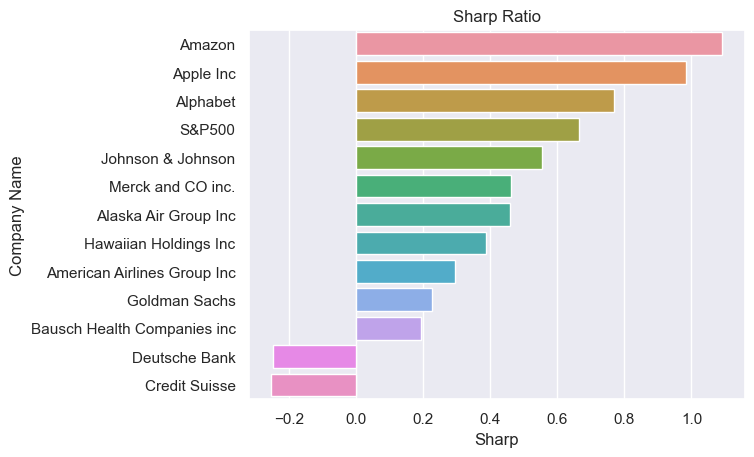

In [61]:
order = Returns.sort_values(by='Sharp',ascending=False)['Company Name']
sns.barplot(data=Returns,y='Company Name',x='Sharp',order=order)
plt.title('Sharp Ratio')
plt.show()

In [62]:
sns.barplot?

In [63]:
prices.head()

Industry                 Aviation                              \
Company Name Alaska Air Group Inc American Airlines Group Inc   
Date                                                            
2010-10-01                12.4475                        9.29   
2010-10-04                12.1425                        9.12   
2010-10-05                12.2150                        9.23   
2010-10-06                12.1875                        9.23   
2010-10-07                11.6250                        9.24   

Industry                                 Finance                              \
Company Name Hawaiian Holdings Inc Credit Suisse Deutsche Bank Goldman Sachs   
Date                                                                           
2010-10-01                    5.96     42.226563     52.595421    147.699997   
2010-10-04                    5.75     41.914063     51.755726    146.570007   
2010-10-05                    5.85     43.154297     53.950382    149.570007   
2010-10-06                    5.97     43.437500     54.608780    150.839996   
2010-10-07                    6.15     43.671875     54.036259    151.110001   

Industry                      Healthcare                                      \
Company Name Bausch Health Companies inc Johnson & Johnson Merck and CO inc.   
Date                                                                           
2010-10-01                     25.750000         61.750000         36.599998   
2010-10-04                     25.870001         61.669998         36.520000   
2010-10-05                     26.299999         62.799999         37.020000   
2010-10-06                     26.690001         63.209999         37.009998   
2010-10-07                     26.600000         63.220001         36.709999   

Industry            Index  Technology                         
Company Name       S&P500    Alphabet      Amazon  Apple Inc  
Date                                                          
2010-10-01    1146.239990  261.828613  153.710007  10.090000  
2010-10-04    1137.030029  260.199707  155.389999   9.951428  
2010-10-05    1160.750000  268.110046  160.869995  10.319285  
2010-10-06    1159.969971  266.177307  155.399994  10.328215  
2010-10-07    1158.060059  264.015411  156.270004  10.329286

In [64]:
Beta=[]
for i in range(0,13):
    np_array = price_change.values
    m = np_array[:,9] # market returns are column zero from numpy array
    s = np_array[:,i] # stock returns are column one from numpy array
    covariance = np.cov(s,m) # Calculate covariance between stock and market
    beta = covariance[0,1]/covariance[1,1]
    Beta.append(round(beta,2))
Beta

[1.23, 1.35, 1.23, 1.37, 1.54, 1.3, 1.32, 0.66, 0.73, 1.0, 1.01, 1.0, 1.06]

In [65]:
Company=[]
for i,j in price_change.columns:
    Company.append(j)
Beta_df=pd.DataFrame({'Company Name':Company,'Beta':Beta})
Beta_df

,Company Name,Beta
0,Alaska Air Group Inc,1.23
1,American Airlines Group Inc,1.35
2,Hawaiian Holdings Inc,1.23
3,Credit Suisse,1.37
4,Deutsche Bank,1.54
5,Goldman Sachs,1.30
6,Bausch Health Companies inc,1.32
7,Johnson & Johnson,0.66
8,Merck and CO inc.,0.73
9,S&P500,1.00


In [66]:
Returns=pd.merge(Returns,Beta_df,on='Company Name')

In [67]:
Returns

,Industry,Company Name,Avg_Daily_Returns,Avg_Annual_Returns,Returns_Rank,Annual_Risk,Sharp,Beta
0,Technology,Amazon,0.001398,0.352201,1,0.315735,1.091742,1.00
1,Technology,Apple Inc,0.001128,0.284164,2,0.281273,0.983613,1.06
2,Technology,Alphabet,0.000818,0.206023,3,0.258561,0.767801,1.01
3,Aviation,Hawaiian Holdings Inc,0.000765,0.192824,4,0.478573,0.387244,1.23
4,Aviation,Alaska Air Group Inc,0.000709,0.178792,5,0.374043,0.457947,1.23
5,Aviation,American Airlines Group Inc,0.000637,0.160489,6,0.519504,0.294490,1.35
6,Index,S&P500,0.000488,0.122966,7,0.173574,0.665225,1.00
7,Healthcare,Bausch Health Companies inc,0.000464,0.116973,8,0.566714,0.193172,1.32
8,Healthcare,Merck and CO inc.,0.000410,0.103385,9,0.207142,0.462895,0.73
9,Healthcare,Johnson & Johnson,0.000409,0.103009,10,0.172187,0.554679,0.66


In [68]:
Returns['Expected_Returns']=0.0075+Returns['Beta']*(Returns.loc[Returns['Company Name']=='S&P500','Avg_Annual_Returns'].values[0]-0.0075)

In [69]:
Returns.loc[Returns['Company Name']=='S&P500','Avg_Annual_Returns'].values[0]

0.12296594451619881

In [70]:
Returns

,Industry,Company Name,Avg_Daily_Returns,Avg_Annual_Returns,Returns_Rank,Annual_Risk,Sharp,Beta,Expected_Returns
0,Technology,Amazon,0.001398,0.352201,1,0.315735,1.091742,1.00,0.122966
1,Technology,Apple Inc,0.001128,0.284164,2,0.281273,0.983613,1.06,0.129894
2,Technology,Alphabet,0.000818,0.206023,3,0.258561,0.767801,1.01,0.124121
3,Aviation,Hawaiian Holdings Inc,0.000765,0.192824,4,0.478573,0.387244,1.23,0.149523
4,Aviation,Alaska Air Group Inc,0.000709,0.178792,5,0.374043,0.457947,1.23,0.149523
5,Aviation,American Airlines Group Inc,0.000637,0.160489,6,0.519504,0.294490,1.35,0.163379
6,Index,S&P500,0.000488,0.122966,7,0.173574,0.665225,1.00,0.122966
7,Healthcare,Bausch Health Companies inc,0.000464,0.116973,8,0.566714,0.193172,1.32,0.159915
8,Healthcare,Merck and CO inc.,0.000410,0.103385,9,0.207142,0.462895,0.73,0.091790
9,Healthcare,Johnson & Johnson,0.000409,0.103009,10,0.172187,0.554679,0.66,0.083708


In [71]:
Capm_df=Returns.drop(['Avg_Daily_Returns','Returns_Rank'],axis=1)

In [72]:
Capm_df

,Industry,Company Name,Avg_Annual_Returns,Annual_Risk,Sharp,Beta,Expected_Returns
0,Technology,Amazon,0.352201,0.315735,1.091742,1.00,0.122966
1,Technology,Apple Inc,0.284164,0.281273,0.983613,1.06,0.129894
2,Technology,Alphabet,0.206023,0.258561,0.767801,1.01,0.124121
3,Aviation,Hawaiian Holdings Inc,0.192824,0.478573,0.387244,1.23,0.149523
4,Aviation,Alaska Air Group Inc,0.178792,0.374043,0.457947,1.23,0.149523
5,Aviation,American Airlines Group Inc,0.160489,0.519504,0.294490,1.35,0.163379
6,Index,S&P500,0.122966,0.173574,0.665225,1.00,0.122966
7,Healthcare,Bausch Health Companies inc,0.116973,0.566714,0.193172,1.32,0.159915
8,Healthcare,Merck and CO inc.,0.103385,0.207142,0.462895,0.73,0.091790
9,Healthcare,Johnson & Johnson,0.103009,0.172187,0.554679,0.66,0.083708


In [73]:
Capm_df[Capm_df.describe().columns]=round(Capm_df[Capm_df.describe().columns],2)

In [74]:
cum_return=(price_change+1).cumprod()
cum_return.tail()

Industry                 Aviation                              \
Company Name Alaska Air Group Inc American Airlines Group Inc   
Date                                                            
2020-09-24               2.868046                    1.266954   
2020-09-25               2.948383                    1.322928   
2020-09-28               3.015867                    1.373520   
2020-09-29               2.945973                    1.318622   
2020-09-30               2.942760                    1.322928   

Industry                                 Finance                              \
Company Name Hawaiian Holdings Inc Credit Suisse Deutsche Bank Goldman Sachs   
Date                                                                           
2020-09-24                2.080537      0.227819      0.154196      1.320989   
2020-09-25                2.147651      0.224503      0.152104      1.319905   
2020-09-28                2.244966      0.234450      0.160280      1.347800   
2020-09-29                2.157718      0.232792      0.157238      1.332363   
2020-09-30                2.162752      0.236107      0.159710      1.360664   

Industry                      Healthcare                                      \
Company Name Bausch Health Companies inc Johnson & Johnson Merck and CO inc.   
Date                                                                           
2020-09-24                      0.591068          2.342834          2.271858   
2020-09-25                      0.594175          2.358866          2.265847   
2020-09-28                      0.593010          2.382348          2.261202   
2020-09-29                      0.577864          2.381538          2.237705   
2020-09-30                      0.603495          2.411012          2.266393   

Industry         Index Technology                        
Company Name    S&P500   Alphabet     Amazon  Apple Inc  
Date                                                     
2020-09-24    2.832382   5.455057  19.646021  10.725471  
2020-09-25    2.877635   5.518724  20.136164  11.127849  
2020-09-28    2.923995   5.593430  20.649599  11.393459  
2020-09-29    2.909923   5.611801  20.459825  11.307234  
2020-09-30    2.933941   5.612832  20.484873  11.477700

In [75]:
# Cumulative Returns for the 10 year period for each stock
cumulative=[]
company=[]
for i,j in prices.columns:
    x=(prices[i,j][-1]-prices[i,j][0])/prices[i,j][0]
    x=round(x,2)
    cumulative.append(x)
    company.append(j)
cumu_return=pd.DataFrame({'Company Name':company,'Cumulative_return':cumulative})

In [76]:
Capm_df=pd.merge(Capm_df,cumu_return,on='Company Name')

In [77]:
Capm_df.columns

Index(['Industry', 'Company Name', 'Avg_Annual_Returns', 'Annual_Risk',
       'Sharp', 'Beta', 'Expected_Returns', 'Cumulative_return'],
      dtype='object')

In [78]:
Capm_df=Capm_df[['Industry', 'Company Name',  'Annual_Risk','Avg_Annual_Returns','Cumulative_return', 
       'Sharp', 'Beta', 'Expected_Returns']]

In [79]:
Capm_df.sort_values(by='Sharp',ascending=False)

,Industry,Company Name,Annual_Risk,Avg_Annual_Returns,Cumulative_return,Sharp,Beta,Expected_Returns
0,Technology,Amazon,0.32,0.35,19.48,1.09,1.00,0.12
1,Technology,Apple Inc,0.28,0.28,10.48,0.98,1.06,0.13
2,Technology,Alphabet,0.26,0.21,4.61,0.77,1.01,0.12
6,Index,S&P500,0.17,0.12,1.93,0.67,1.00,0.12
9,Healthcare,Johnson & Johnson,0.17,0.10,1.41,0.55,0.66,0.08
4,Aviation,Alaska Air Group Inc,0.37,0.18,1.94,0.46,1.23,0.15
8,Healthcare,Merck and CO inc.,0.21,0.10,1.27,0.46,0.73,0.09
3,Aviation,Hawaiian Holdings Inc,0.48,0.19,1.16,0.39,1.23,0.15
5,Aviation,American Airlines Group Inc,0.52,0.16,0.32,0.29,1.35,0.16
10,Finance,Goldman Sachs,0.29,0.07,0.36,0.23,1.30,0.16


In [80]:
Capm_df

,Industry,Company Name,Annual_Risk,Avg_Annual_Returns,Cumulative_return,Sharp,Beta,Expected_Returns
0,Technology,Amazon,0.32,0.35,19.48,1.09,1.00,0.12
1,Technology,Apple Inc,0.28,0.28,10.48,0.98,1.06,0.13
2,Technology,Alphabet,0.26,0.21,4.61,0.77,1.01,0.12
3,Aviation,Hawaiian Holdings Inc,0.48,0.19,1.16,0.39,1.23,0.15
4,Aviation,Alaska Air Group Inc,0.37,0.18,1.94,0.46,1.23,0.15
5,Aviation,American Airlines Group Inc,0.52,0.16,0.32,0.29,1.35,0.16
6,Index,S&P500,0.17,0.12,1.93,0.67,1.00,0.12
7,Healthcare,Bausch Health Companies inc,0.57,0.12,-0.40,0.19,1.32,0.16
8,Healthcare,Merck and CO inc.,0.21,0.10,1.27,0.46,0.73,0.09
9,Healthcare,Johnson & Johnson,0.17,0.10,1.41,0.55,0.66,0.08


In [81]:
# Lets short list stocks which has Beta close to 1 or less than 1
Capm_df[Capm_df.Beta<1.1]

,Industry,Company Name,Annual_Risk,Avg_Annual_Returns,Cumulative_return,Sharp,Beta,Expected_Returns
0,Technology,Amazon,0.32,0.35,19.48,1.09,1.00,0.12
1,Technology,Apple Inc,0.28,0.28,10.48,0.98,1.06,0.13
2,Technology,Alphabet,0.26,0.21,4.61,0.77,1.01,0.12
6,Index,S&P500,0.17,0.12,1.93,0.67,1.00,0.12
8,Healthcare,Merck and CO inc.,0.21,0.10,1.27,0.46,0.73,0.09
9,Healthcare,Johnson & Johnson,0.17,0.10,1.41,0.55,0.66,0.08


Assuming we take all three tech stocks ans J&J which has least risk and has decent returns

In [ ]:
'Johnson & Johnson','Merck and CO inc.','Apple Inc','Alphabet'

# Portfolio Selection

In [439]:
portfolio=pd.DataFrame()
for i,j in prices.columns:
        if j in ['Johnson & Johnson','Amazon','Apple Inc','Alaska Air Group Inc']:
            portfolio[j]=prices[i,j]
portfolio.head()

,Alaska Air Group Inc,Johnson & Johnson,Amazon,Apple Inc
Date,,,,
2010-10-01,12.4475,61.750000,153.710007,10.090000
2010-10-04,12.1425,61.669998,155.389999,9.951428
2010-10-05,12.2150,62.799999,160.869995,10.319285
2010-10-06,12.1875,63.209999,155.399994,10.328215
2010-10-07,11.6250,63.220001,156.270004,10.329286


Assuming equal weights for each stock since we dont know the total investment amount

In [440]:
port_columns=portfolio.columns

In [441]:
port_columns

Index(['Alaska Air Group Inc', 'Johnson & Johnson', 'Amazon', 'Apple Inc'], dtype='object')

In [442]:
weightage=1/len(port_columns)

In [443]:
initial_weight = []
i=0
while i<len(port_columns):
    initial_weight.append(weightage)
    i=i+1

initial_weight=np.array(initial_weight)


In [444]:
portfolio['portfolio']=0
for i in port_columns:
    portfolio['portfolio']=portfolio['portfolio']+portfolio[i]*weightage
portfolio.head()
    

,Alaska Air Group Inc,Johnson & Johnson,Amazon,Apple Inc,portfolio
Date,,,,,
2010-10-01,12.4475,61.750000,153.710007,10.090000,59.499377
2010-10-04,12.1425,61.669998,155.389999,9.951428,59.788481
2010-10-05,12.2150,62.799999,160.869995,10.319285,61.551070
2010-10-06,12.1875,63.209999,155.399994,10.328215,60.281427
2010-10-07,11.6250,63.220001,156.270004,10.329286,60.361073


In [445]:
portfolio.tail()

,Alaska Air Group Inc,Johnson & Johnson,Amazon,Apple Inc,portfolio
Date,,,,,
2020-09-24,35.700001,144.669998,3019.790039,108.220001,827.095010
2020-09-25,36.700001,145.660004,3095.129883,112.279999,847.442472
2020-09-28,37.540001,147.110001,3174.050049,114.959999,868.415012
2020-09-29,36.669998,147.059998,3144.879883,114.089996,860.674969
2020-09-30,36.630001,148.880005,3148.729980,115.809998,862.512496


<Axes: xlabel='Date'>

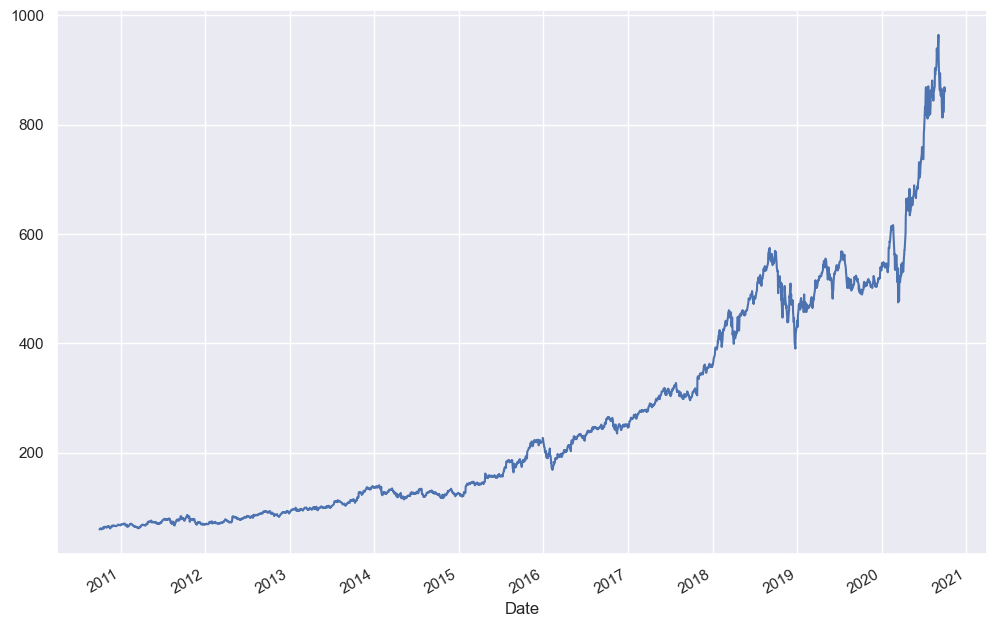

In [446]:
portfolio.portfolio.plot()

In [447]:
portfolio_returns=portfolio.pct_change()

In [448]:
portfolio_returns.portfolio.mean()

0.0011956106252903292

In [449]:
portfolio_returns.portfolio.mean()*252

0.30129387757316295

In [450]:
Annual_returns=portfolio_returns.portfolio.mean()*252

In [451]:
portfolio_returns.portfolio.std()

0.016287334530049217

In [452]:
portfolio_returns.portfolio.std()*252**0.5

0.25855342011975174

In [453]:
covariance_portfolio = portfolio_returns.iloc[:,:-1]
covariance_portfolio = (covariance_portfolio.cov())*252

covariance_portfolio

,Alaska Air Group Inc,Johnson & Johnson,Amazon,Apple Inc
Alaska Air Group Inc,0.139908,0.019655,0.031852,0.034074
Johnson & Johnson,0.019655,0.029648,0.017524,0.018014
Amazon,0.031852,0.017524,0.099689,0.038568
Apple Inc,0.034074,0.018014,0.038568,0.079115


In [454]:
portfolio_variance = np.dot(initial_weight.T,np.dot(covariance_portfolio, initial_weight))

In [455]:
portfolio_variance

0.041733257083352855

In [456]:
portfolio_risk = np.sqrt(portfolio_variance)
portfolio_risk

0.20428719265620363

In [457]:
Sharp_ratio=(Annual_returns-0.0075)/portfolio_risk
Sharp_ratio

1.4381414407490085

In [458]:
portfolio_returns.dropna(inplace=True)

In [459]:
portfolio_returns=pd.merge(portfolio_returns,price_change['Index'],on=portfolio_returns.index)

In [460]:
portfolio_returns.head()

,key_0,Alaska Air Group Inc,Johnson & Johnson,Amazon,Apple Inc,portfolio,S&P500
0,2010-10-04,-0.024503,-0.001296,0.010930,-0.013734,0.004859,-0.008035
1,2010-10-05,0.005971,0.018323,0.035266,0.036965,0.029480,0.020861
2,2010-10-06,-0.002251,0.006529,-0.034003,0.000865,-0.020627,-0.000672
3,2010-10-07,-0.046154,0.000158,0.005599,0.000104,0.001321,-0.001647
4,2010-10-08,0.036344,0.000158,-0.004607,0.016769,-0.000473,0.006122


In [461]:
np_array = portfolio_returns[['portfolio','S&P500']].values
m = np_array[:,1] 
s = np_array[:,0] 
covariance = np.cov(s, m)
beta = covariance[0,1]/covariance[1,1]
beta

0.953939061469519

In [463]:
252*portfolio_returns['S&P500'].mean()

0.12296594451619881

In [462]:
#expected return
round(0.0075+beta*(252*portfolio_returns['S&P500'].mean()-0.0075),2)

0.12

In [259]:
portfolio_returns.set_index('key_0')

,Johnson & Johnson,Merck and CO inc.,Alphabet,Amazon,Apple Inc,portfolio,S&P500
key_0,,,,,,,
2010-10-04,-0.001296,-0.002186,-0.006221,0.010930,-0.013734,-0.000472,-0.008035
2010-10-05,0.018323,0.013691,0.030401,0.035266,0.036965,0.029382,0.020861
2010-10-06,0.006529,-0.000270,-0.007209,-0.034003,0.000865,-0.012973,-0.000672
2010-10-07,0.000158,-0.008106,-0.008122,0.005599,0.000104,-0.002971,-0.001647
2010-10-08,0.000158,0.005448,0.011962,-0.004607,0.016769,0.005318,0.006122
...,...,...,...,...,...,...,...
2020-09-24,0.001592,0.006293,0.009242,0.006644,0.010269,0.007340,0.002987
2020-09-25,0.006843,-0.002646,0.011671,0.024949,0.037516,0.020242,0.015977
2020-09-28,0.009955,-0.002050,0.013537,0.025498,0.023869,0.020988,0.016111


# Forecasting

In [337]:
df_close=pd.DataFrame()
df_vol=pd.DataFrame()
for i,j in price_vol.columns:
    if j in ['Johnson & Johnson','Merck and CO inc.','Amazon','Apple Inc','Alphabet']:
        if i=='Close':
            df_close[j]=price_vol[i,j]
        else:
            df_vol[j]=price_vol[i,j]

In [338]:
df_close.head()

,Alphabet,Amazon,Apple Inc,Johnson & Johnson,Merck and CO inc.
Date,,,,,
2010-10-01,261.828613,153.710007,10.090000,61.750000,36.599998
2010-10-04,260.199707,155.389999,9.951428,61.669998,36.520000
2010-10-05,268.110046,160.869995,10.319285,62.799999,37.020000
2010-10-06,266.177307,155.399994,10.328215,63.209999,37.009998
2010-10-07,264.015411,156.270004,10.329286,63.220001,36.709999


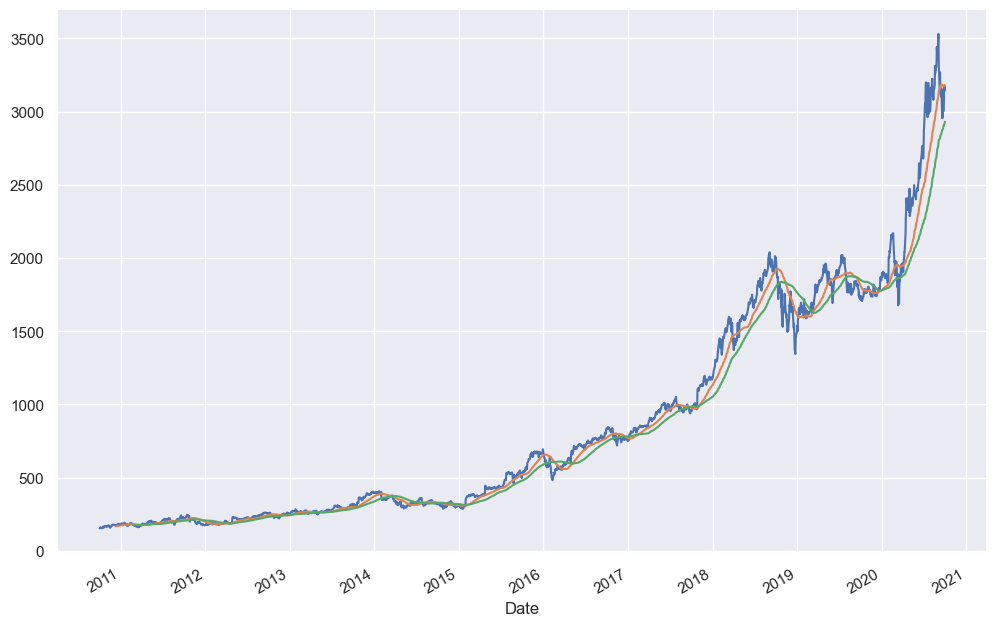

In [350]:
df_close['Amazon'].plot()
df_close['Amazon'].rolling(50).mean().plot()
df_close['Amazon'].rolling(100).mean().plot()
plt.show()

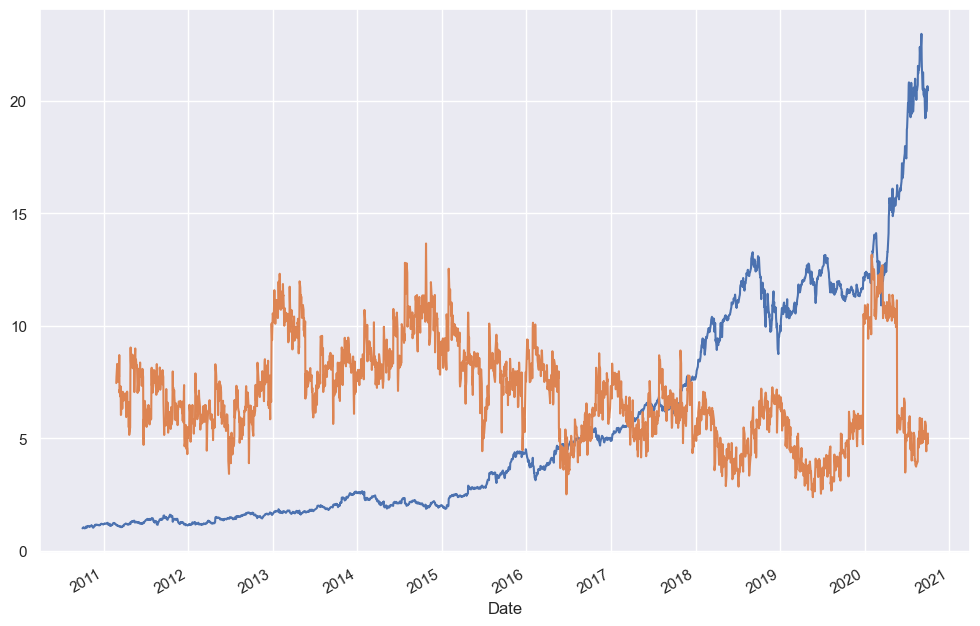

In [349]:
(df_close['Amazon']/df_close['Amazon'][0]).plot()
(100*df_vol['Amazon'].pct_change()).rolling(100).mean().plot()
plt.show()

In [ ]:
rcParams['figure.figsize'] = 12, 8
add_result = seasonal_decompose(price_vol[i,j], model='additive', period =1) # additive seasonal index
fig = add_result.plot()
plt.show()

In [351]:
df_vol['Amazon'].pct_change()

Date
2010-10-01         NaN
2010-10-04   -0.384285
2010-10-05    0.051155
2010-10-06    0.078434
2010-10-07   -0.237394
                ...   
2020-09-24   -0.021813
2020-09-25   -0.165334
2020-09-28   -0.084720
2020-09-29   -0.172435
2020-09-30    0.396933
Name: Amazon, Length: 2517, dtype: float64

In [322]:
from statsmodels.tsa.stattools import kpss

for i,j in price_vol.columns:
    if j in ['Johnson & Johnson','Merck and CO inc.','Amazon','Apple Inc','Alphabet']:
        kpss_test = kpss(price_vol[i,j])

        print(i+'-'+j)
        print('KPSS Statistic: %f' % kpss_test[0])
        print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
        print('p-value: %f' % kpss_test[1])

        if kpss_test[1] >= 0.05:
            print("\nSeries is Stationary")
        else:
            print("\nSeries is Non-Stationary")

        print('\n--------------------------------------\n')

Close-Alphabet
KPSS Statistic: 7.892446
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------

Close-Amazon
KPSS Statistic: 6.956628
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------

Close-Apple Inc
KPSS Statistic: 6.131432
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------

Close-Johnson & Johnson
KPSS Statistic: 7.880246
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------

Close-Merck and CO inc.
KPSS Statistic: 7.087248
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------

Volume-Alphabet
KPSS Statistic: 6.352296
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Non-Stationary

--------------------------------------

Volume-Amazon
KPSS Statistic: 0.505779
Critical Values @ 0

C:\Users\HP\AppData\Local\Temp\ipykernel_15944\2623084365.py:5: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_test = kpss(price_vol[i,j])
C:\Users\HP\AppData\Local\Temp\ipykernel_15944\2623084365.py:5: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_test = kpss(price_vol[i,j])
C:\Users\HP\AppData\Local\Temp\ipykernel_15944\2623084365.py:5: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_test = kpss(price_vol[i,j])
C:\Users\HP\AppData\Local\Temp\ipykernel_15944\2623084365.py:5: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller

All the series are stationary. Hence, differencing is required not for any columns.

In [323]:
from pylab import rcParams
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse

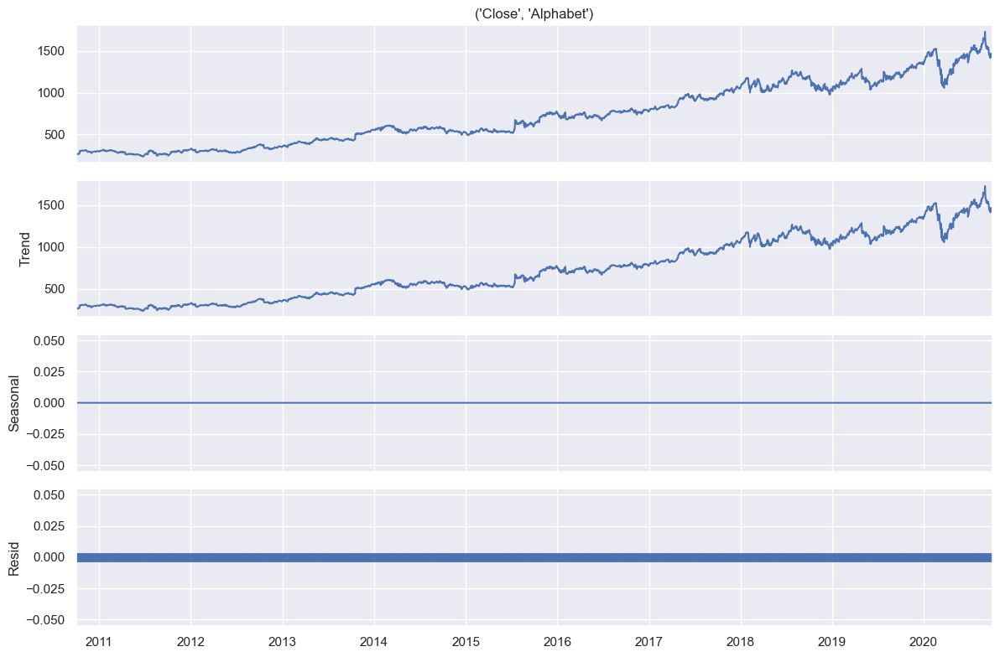

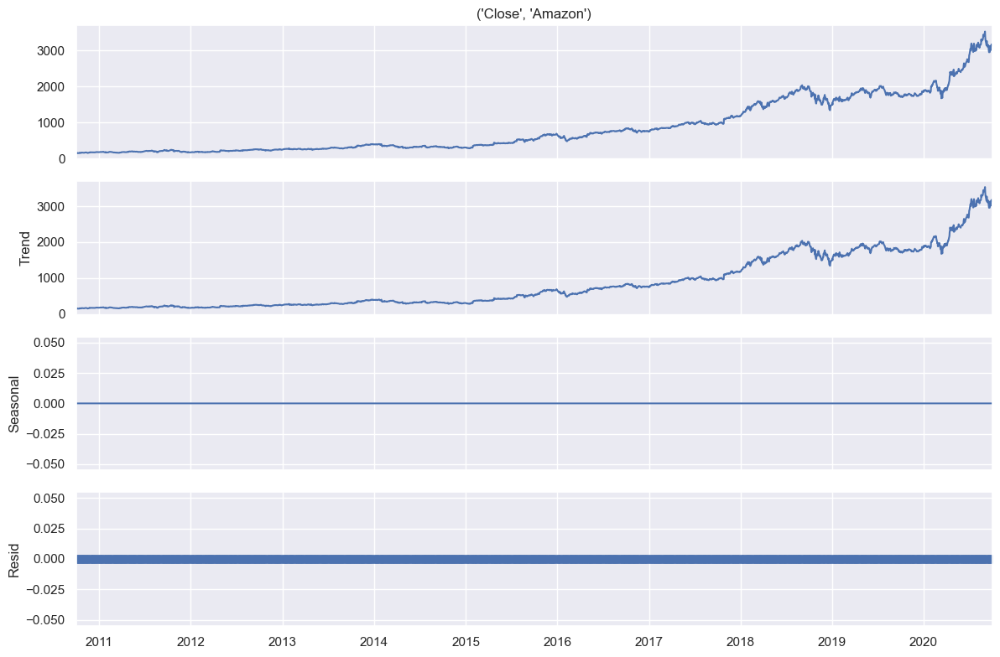

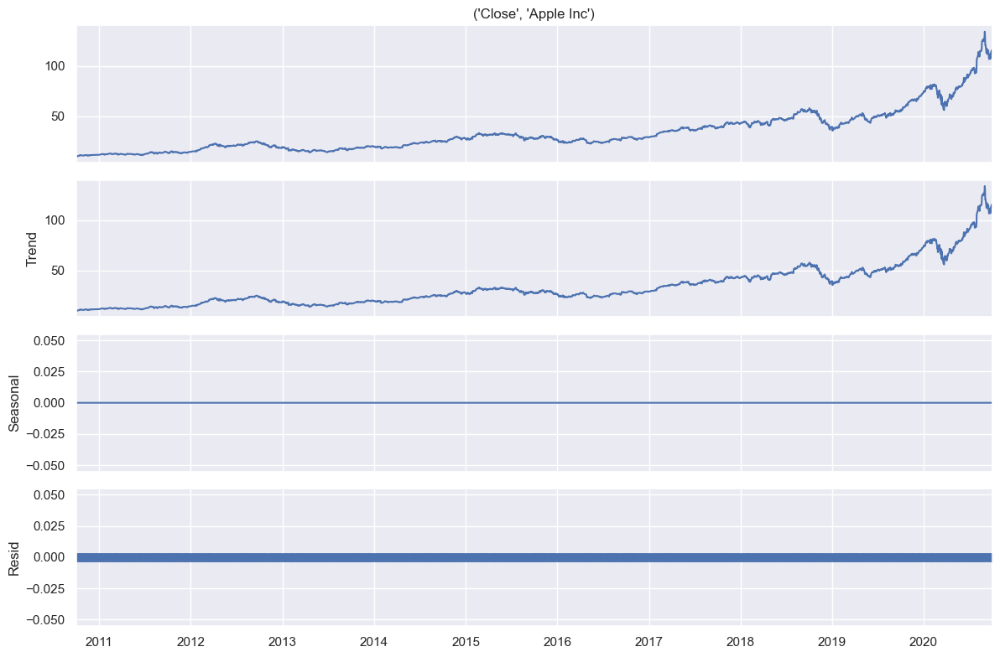

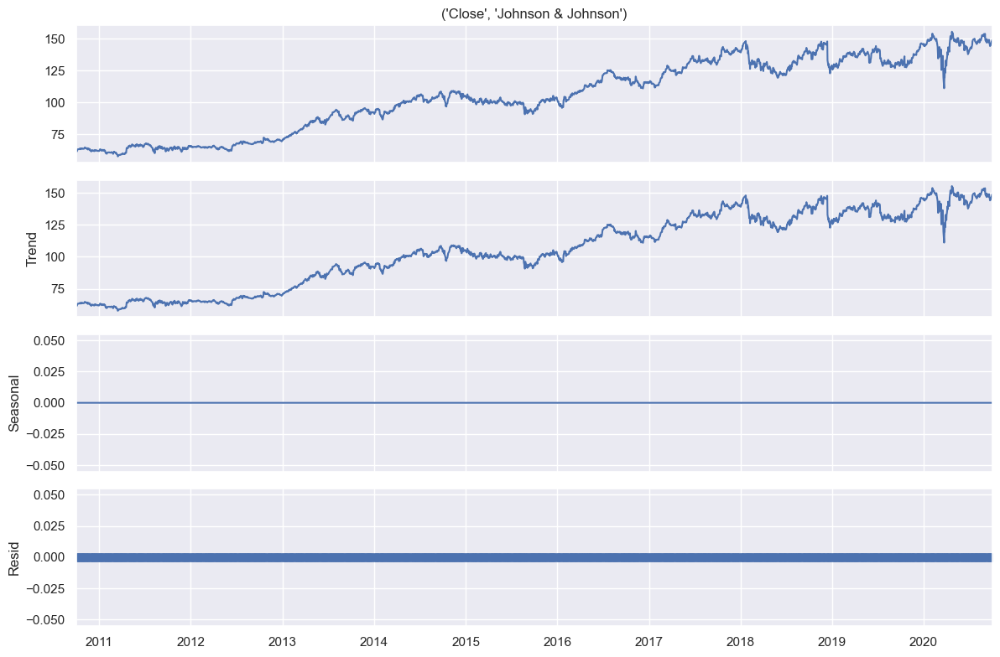

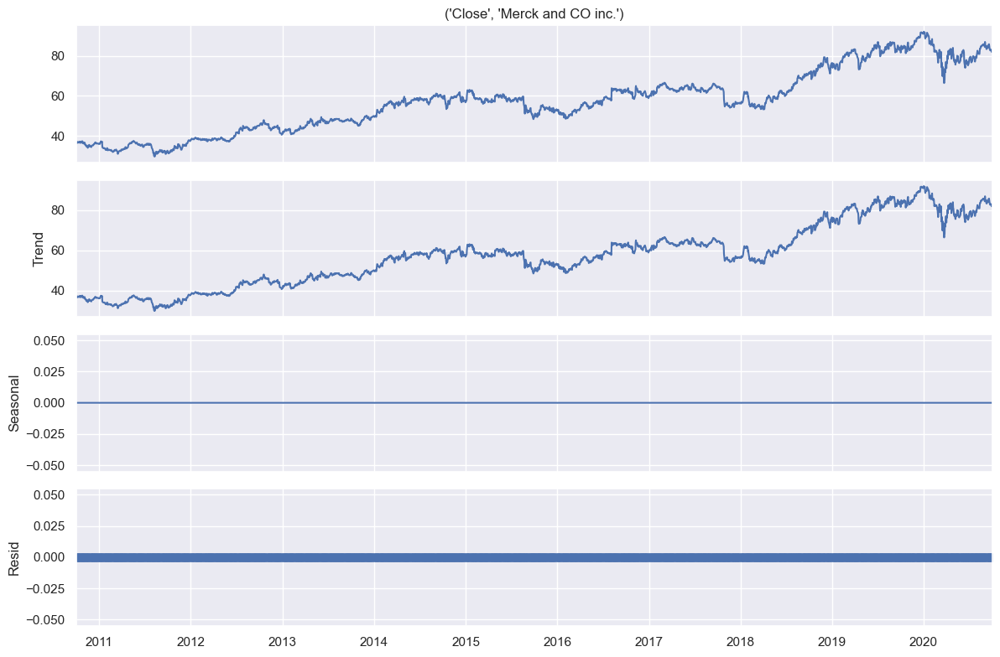

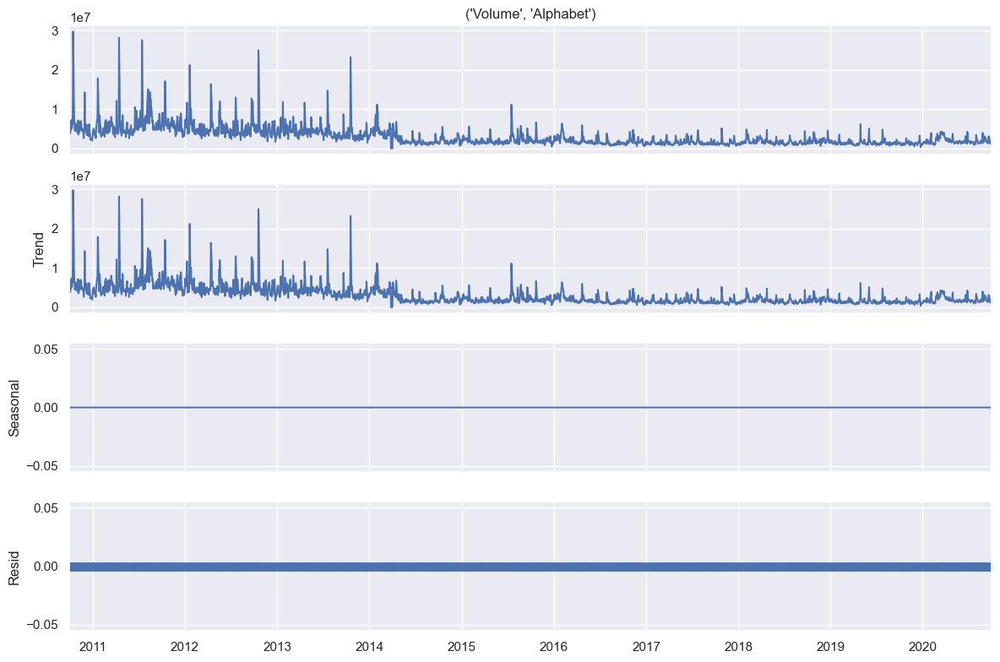

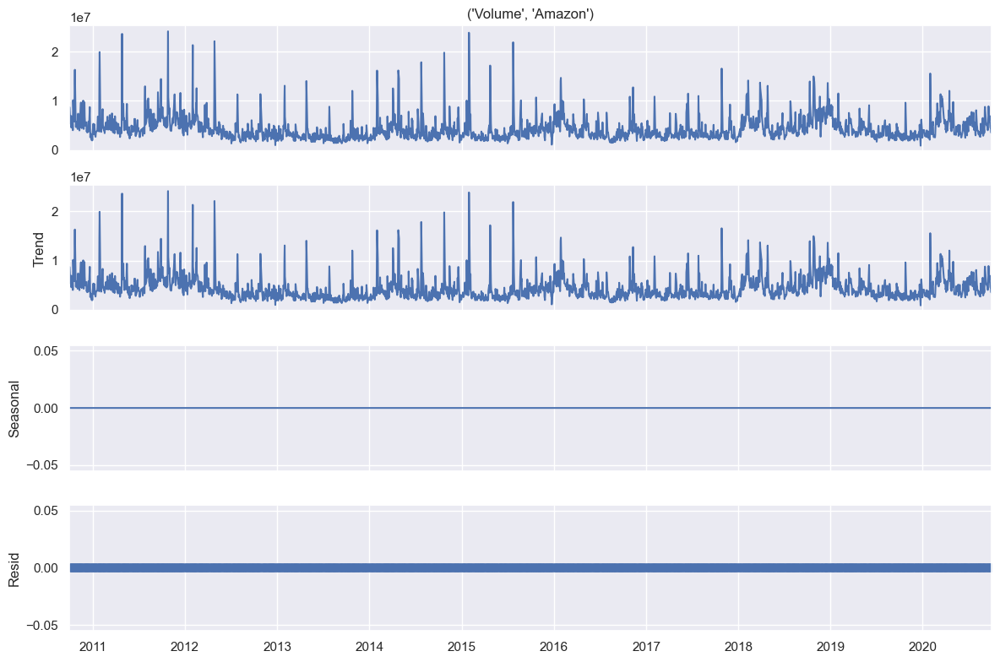

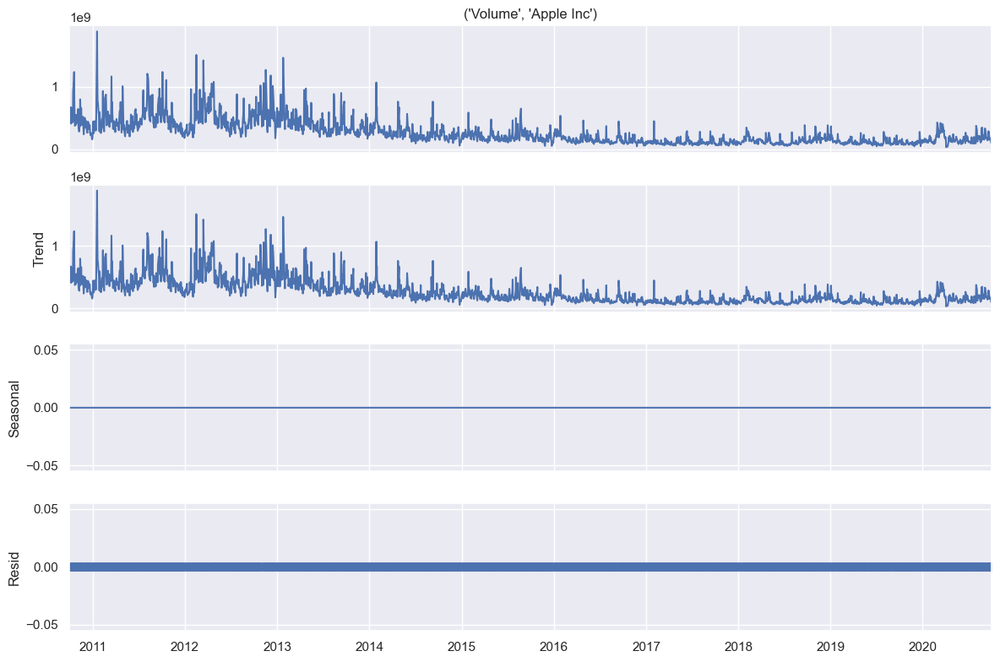

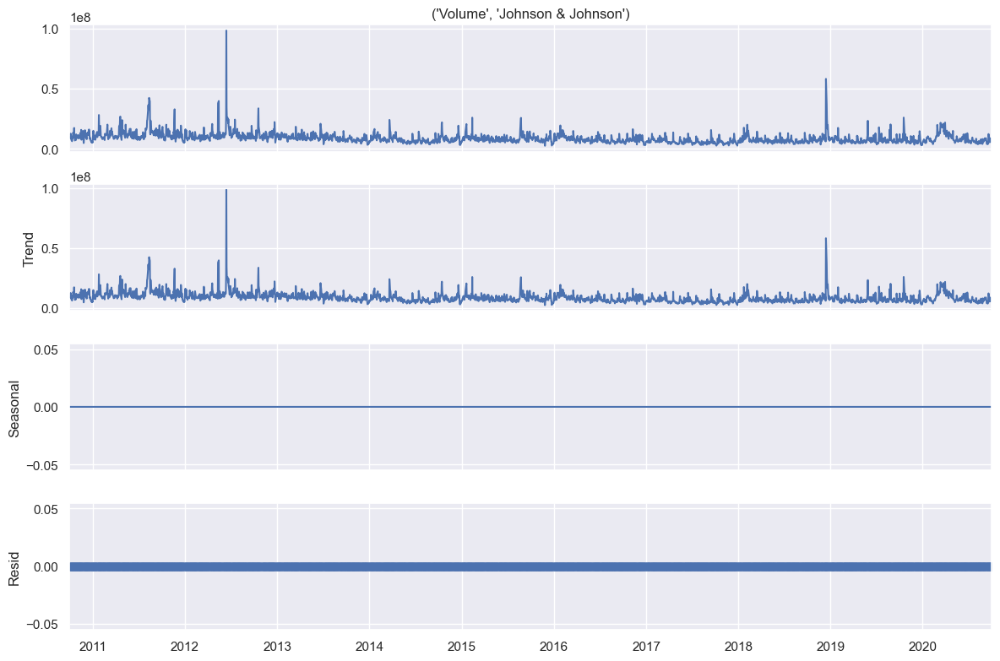

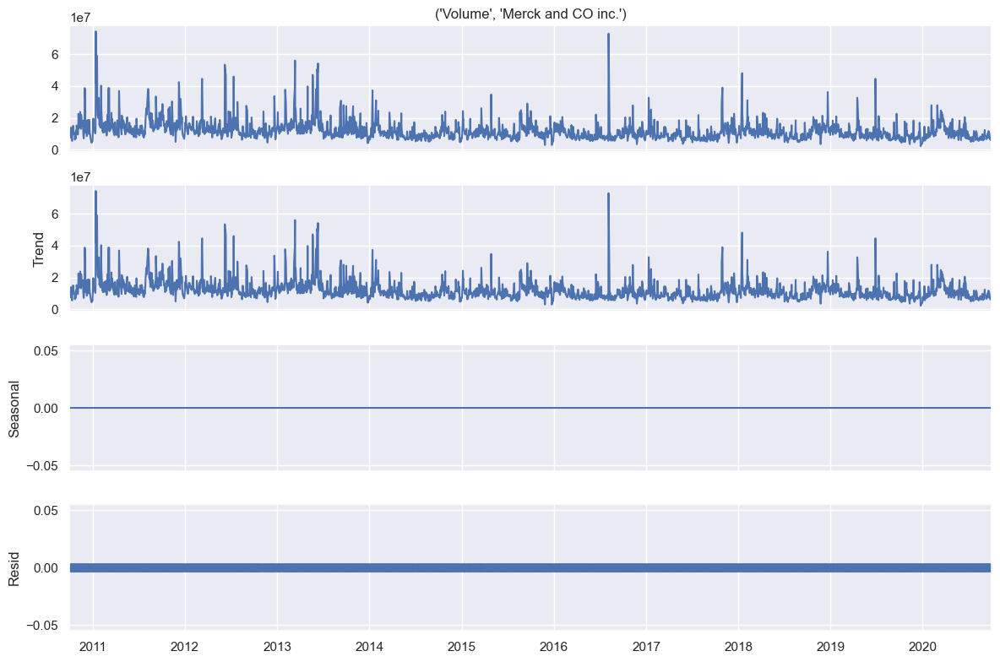

In [324]:
# Additive seasonal decomposition for all stocks
for i,j in price_vol.columns:
    if j in ['Johnson & Johnson','Merck and CO inc.','Amazon','Apple Inc','Alphabet']:
        rcParams['figure.figsize'] = 12, 8
        add_result = seasonal_decompose(price_vol[i,j], model='additive', period =1) # additive seasonal index
        fig = add_result.plot()
        plt.show()

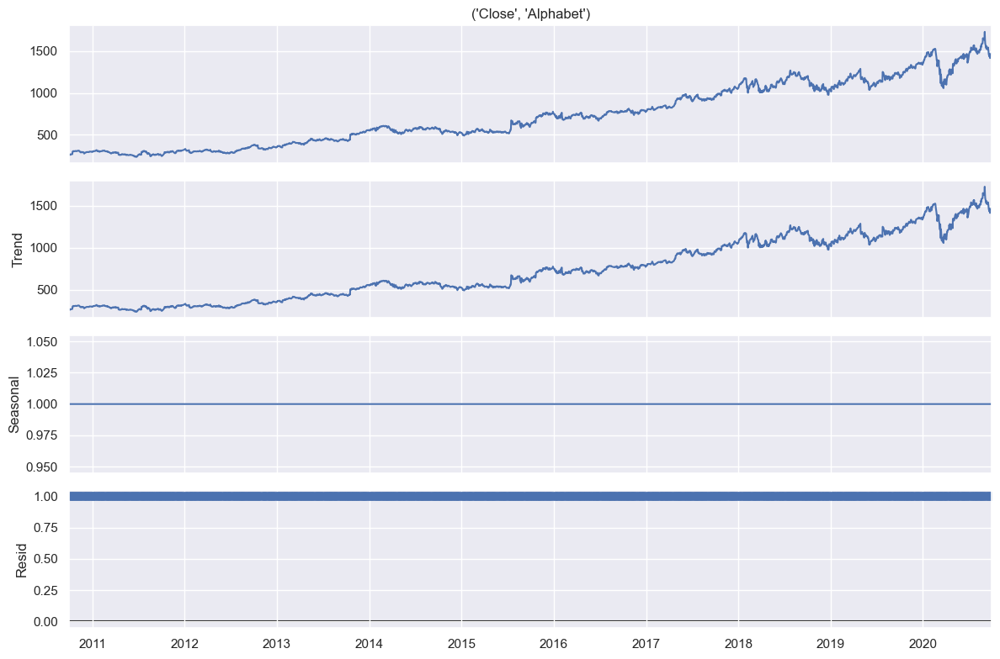

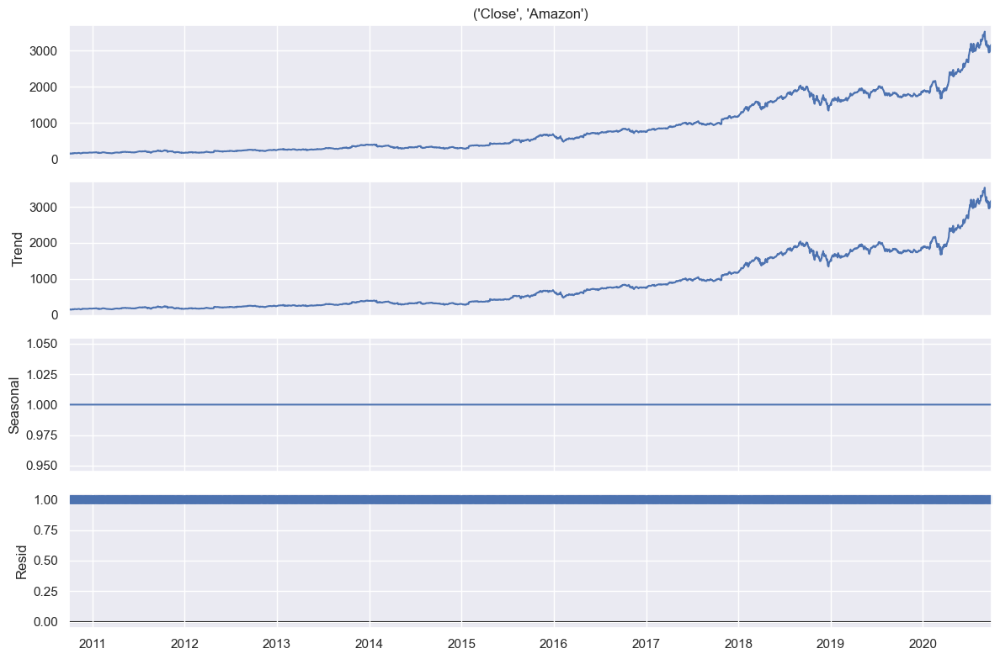

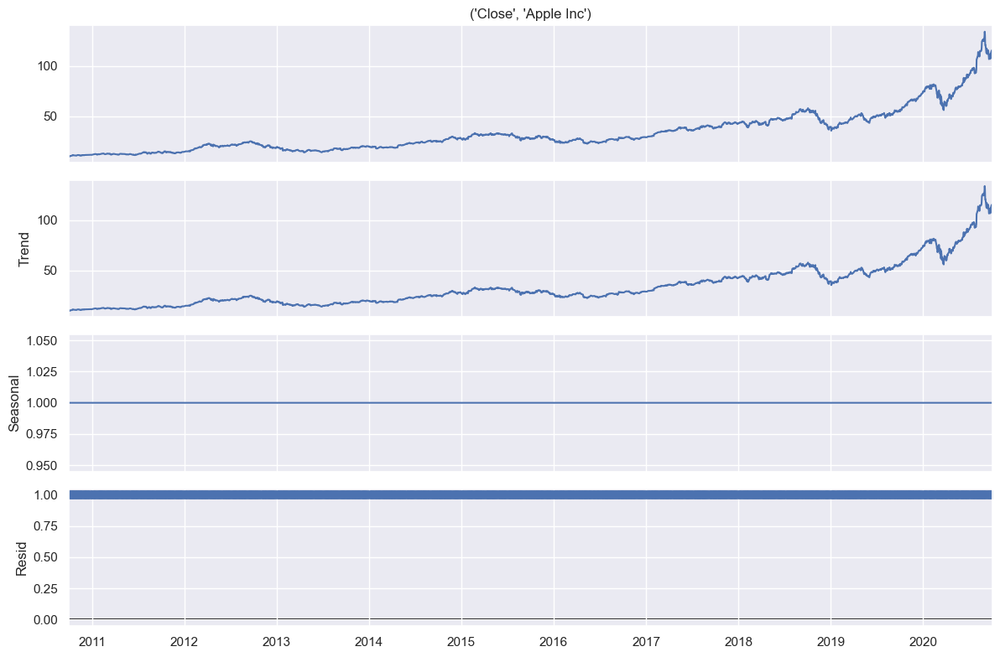

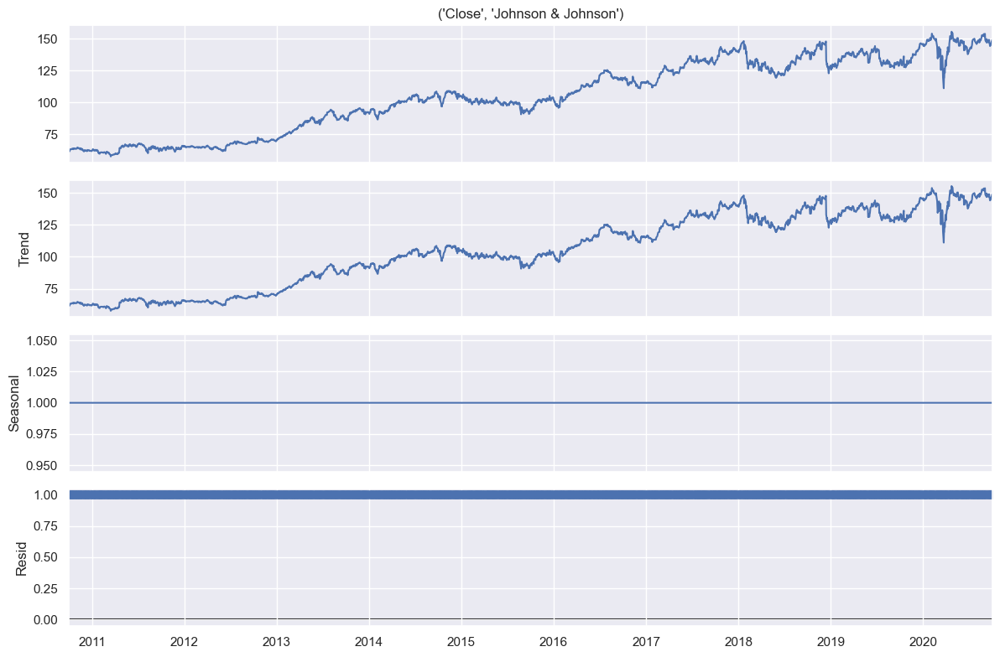

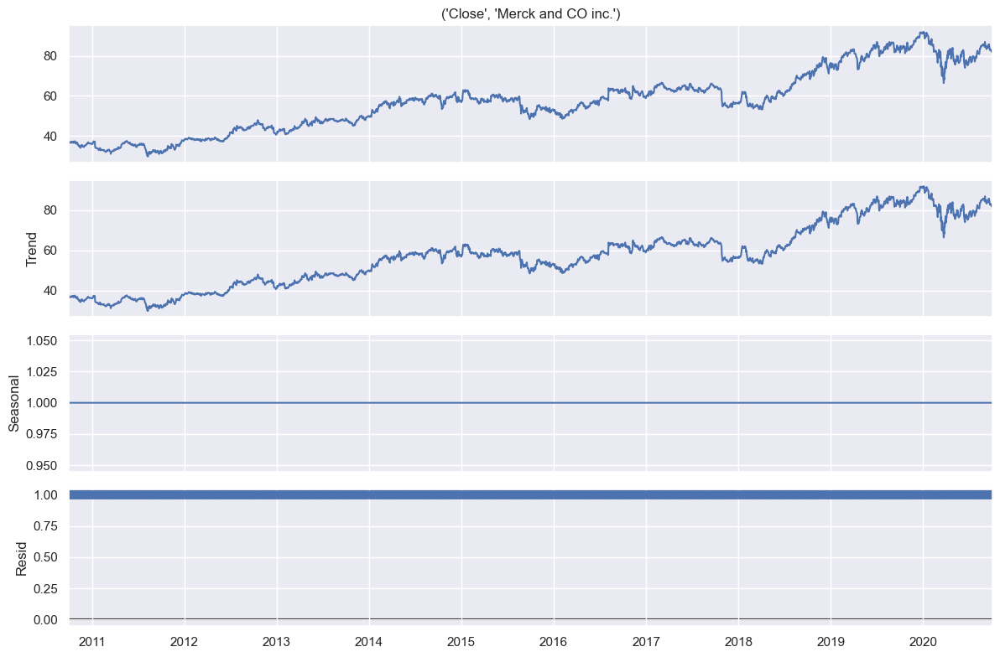

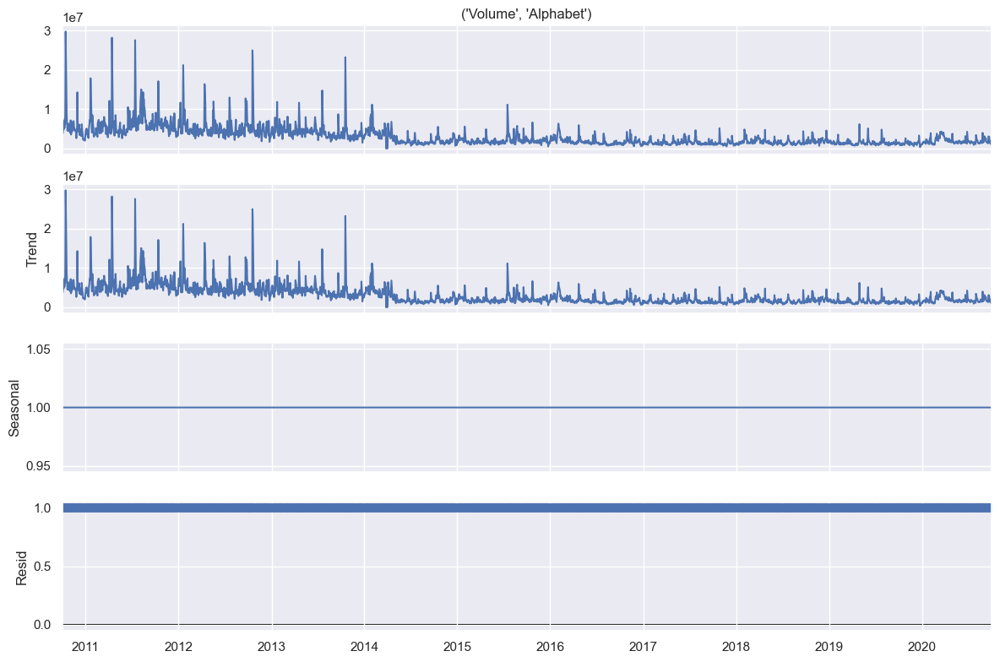

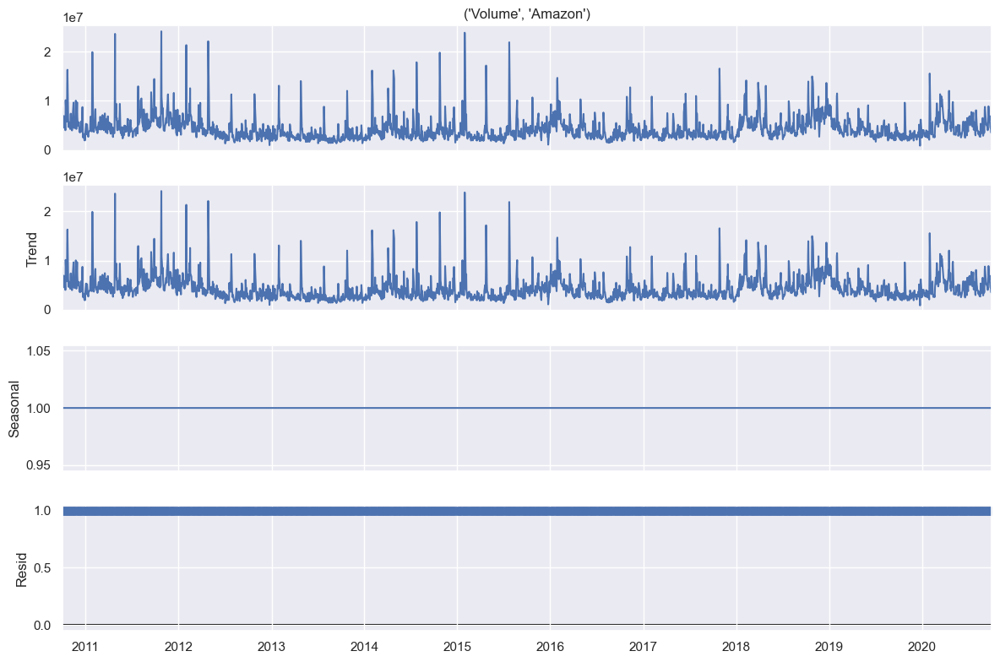

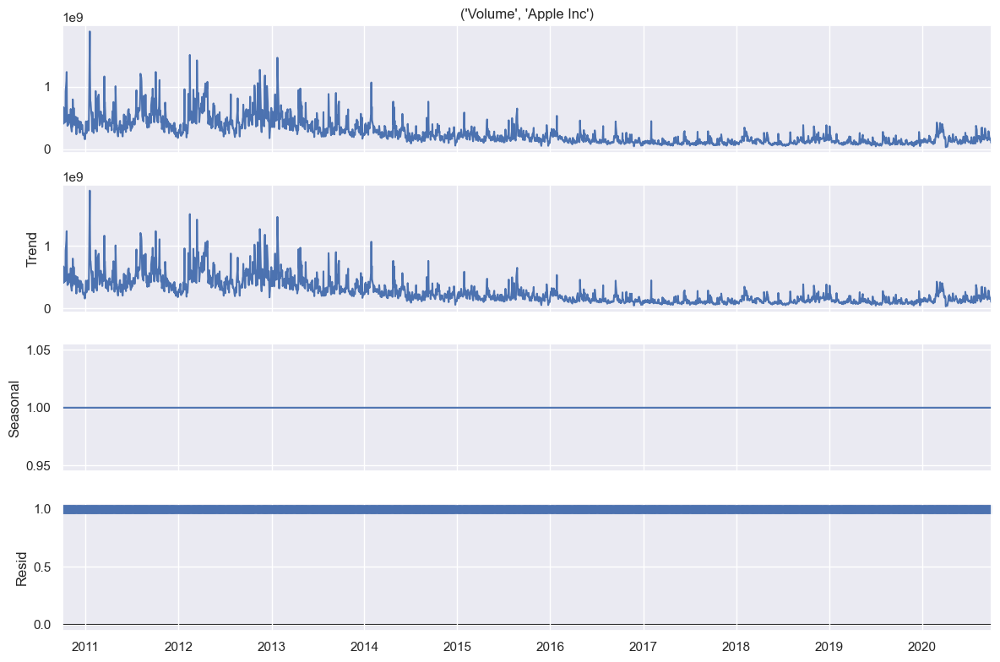

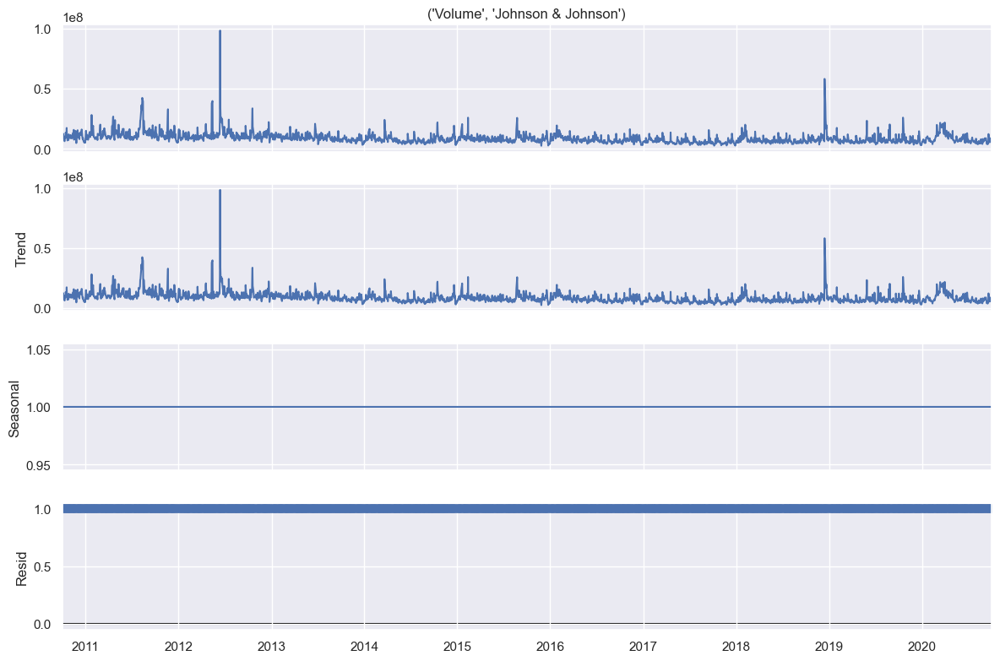

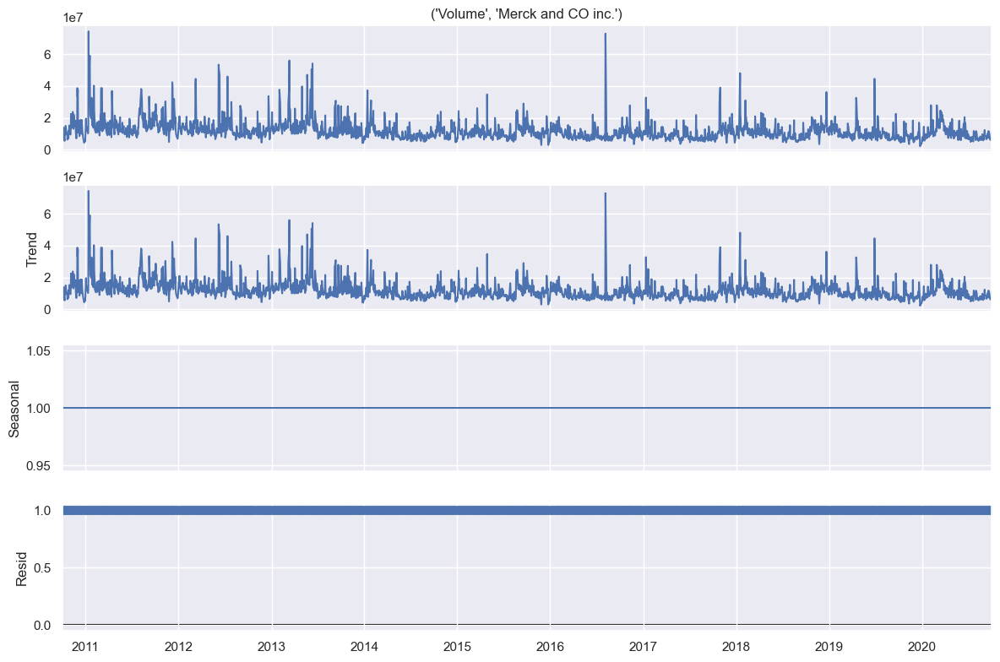

In [325]:
for i,j in price_vol.columns:
    if j in ['Johnson & Johnson','Merck and CO inc.','Amazon','Apple Inc','Alphabet']:
        rcParams['figure.figsize'] = 12, 8
        mult_result = seasonal_decompose(price_vol[i,j], model='multiplicative', period =1) # additive seasonal index
        fig = mult_result.plot()
        plt.show()

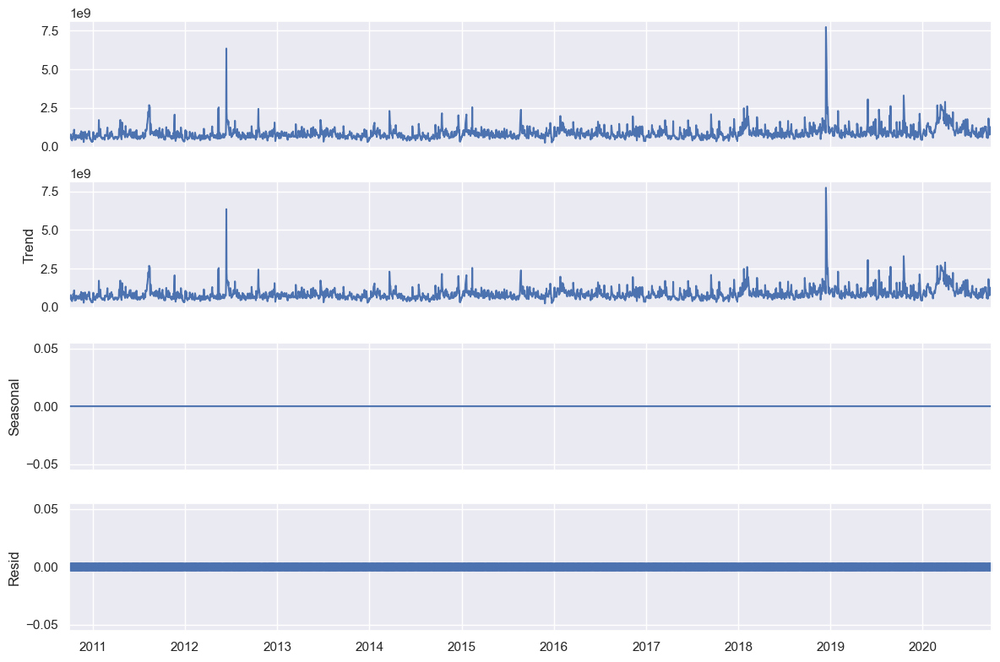

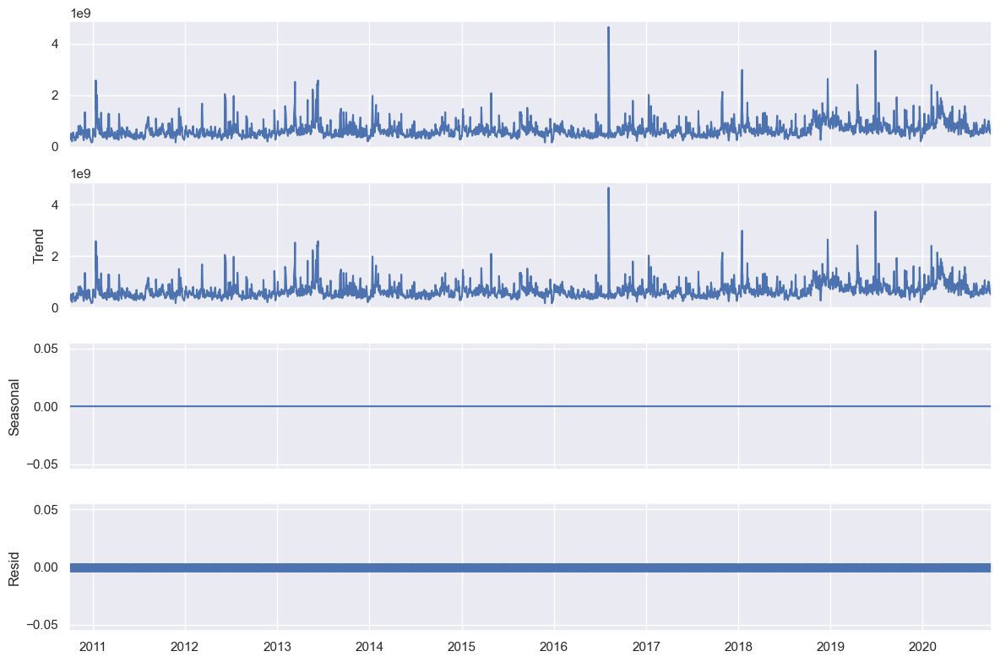

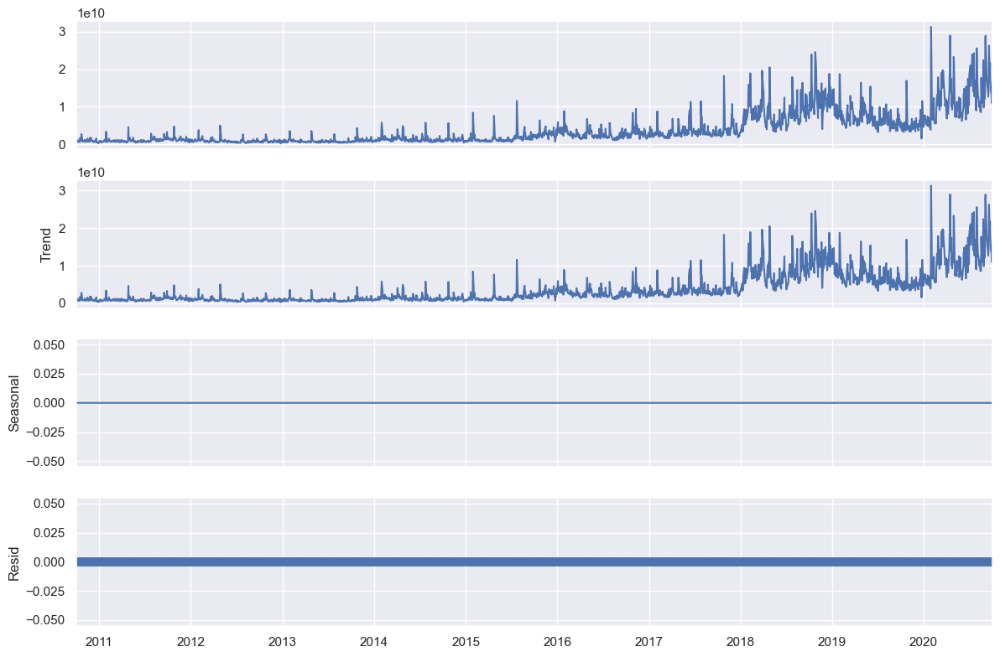

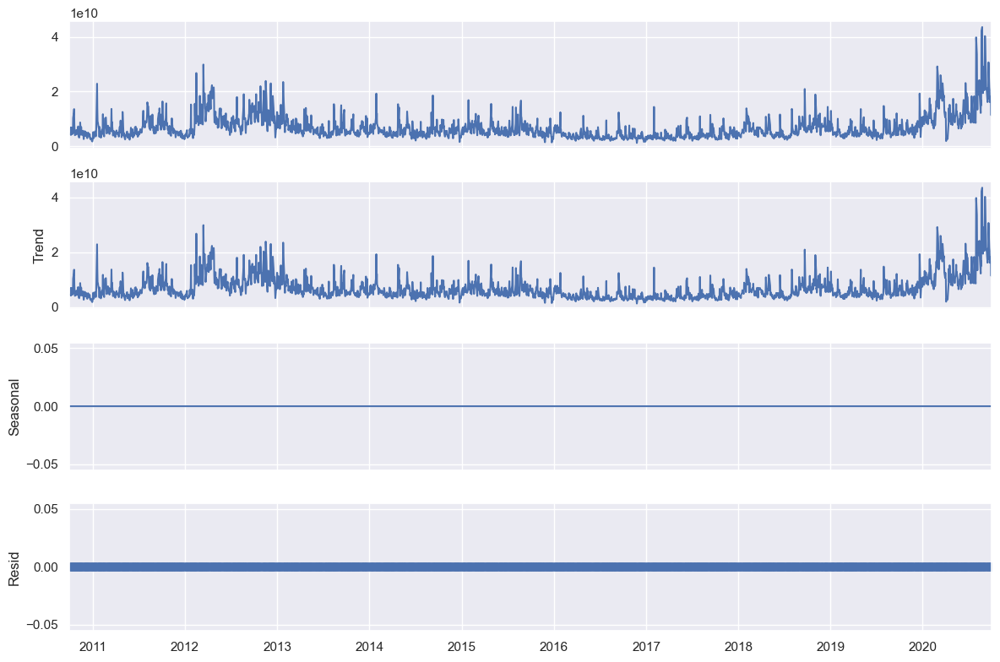

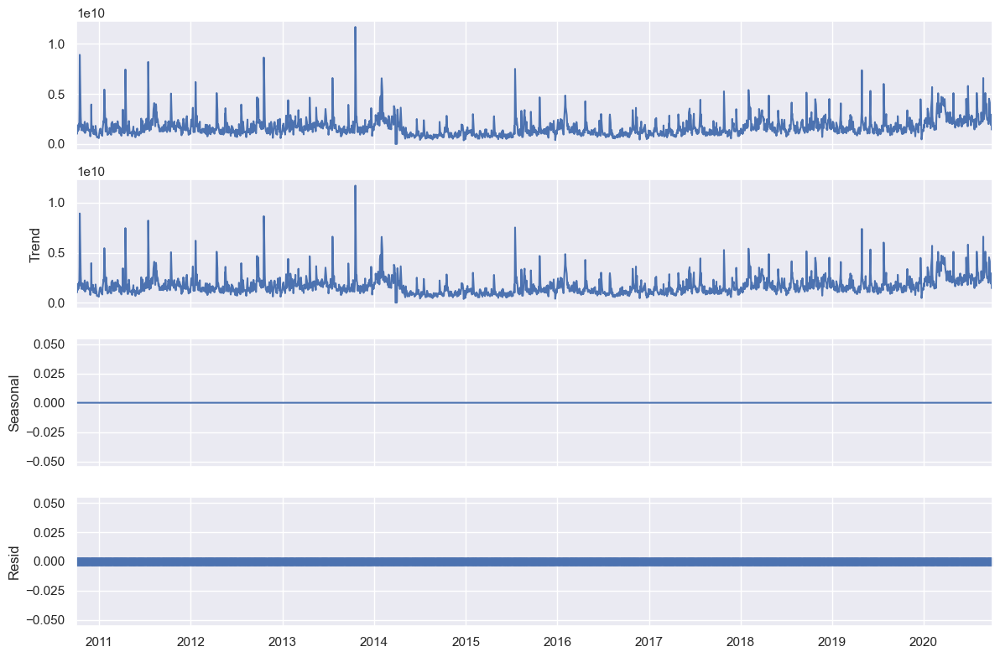

In [330]:
for i in ['Johnson & Johnson','Merck and CO inc.','Amazon','Apple Inc','Alphabet']:
    y=price_vol['Close',i]*price_vol['Volume',i]    
    rcParams['figure.figsize'] = 12, 8
    add_result = seasonal_decompose(y, model='additive', period =1) # additive seasonal index
    fig = add_result.plot()
    plt.show()

price volume Dataframe of Stocks in Portfolio 

In [297]:
Portfolio_price_vol=price_vol.copy()
for i,j in price_vol.columns:
    if j in ['Johnson & Johnson','Merck and CO inc.','Amazon','Apple Inc','Alphabet']:
        continue
    else:
        Portfolio_price_vol.drop((i,j),axis=1,inplace=True)
Portfolio_price_vol.head()

Close                                           \
Company Name    Alphabet      Amazon  Apple Inc Johnson & Johnson   
Date                                                                
2010-10-01    261.828613  153.710007  10.090000         61.750000   
2010-10-04    260.199707  155.389999   9.951428         61.669998   
2010-10-05    268.110046  160.869995  10.319285         62.799999   
2010-10-06    266.177307  155.399994  10.328215         63.209999   
2010-10-07    264.015411  156.270004  10.329286         63.220001   

                                   Volume                          \
Company Name Merck and CO inc.   Alphabet     Amazon    Apple Inc   
Date                                                                
2010-10-01           36.599998  4466600.0  8683400.0  448142800.0   
2010-10-04           36.520000  3895400.0  5346500.0  435302000.0   
2010-10-05           37.020000  7040400.0  5620000.0  501967200.0   
2010-10-06           37.009998  5545200.0  6060800.0  670868800.0   
2010-10-07           36.709999  4809400.0  4622000.0  408399600.0   

                                                  
Company Name Johnson & Johnson Merck and CO inc.  
Date                                              
2010-10-01           9773200.0        11741900.0  
2010-10-04           8703600.0         9234900.0  
2010-10-05          12439400.0        10669200.0  
2010-10-06          11339800.0         7541300.0  
2010-10-07           9826600.0        13897800.0

In [299]:
# Keeping 70% values as train
train_len = int(Portfolio_price_vol.shape[0]*0.7)
test_len = int(Portfolio_price_vol.shape[0]) - int(Portfolio_price_vol.shape[0]*0.7)

# Train data
train_data = Portfolio_price_vol[:train_len] 

# Test data
test_data = Portfolio_price_vol[train_len:]

# Train data - differenced
#train_data_boxcox = data_boxcox[:train_len]
#train_data_boxcox_diff = data_boxcox_diff[:train_len-1]

# Test data - differenced
#test_data_boxcox = data_boxcox[train_len:]
#test_data_boxcox_diff = data_boxcox_diff[train_len-1:]

In [314]:
# Fitting the VAR model to the data
from statsmodels.tsa.api import VAR

model = VAR(train_data)

C:\Users\HP\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [315]:
# To select the lag order
x = model.select_order(maxlags=50)
x.summary()

,AIC,BIC,FPE,HQIC
0,184.9,184.9,2.015e+80,184.9
1,159.5,159.8*,1.808e+69,159.6*
2,159.5,160.1,1.795e+69,159.7
3,159.5*,160.4,1.784e+69*,159.8
4,159.5,160.8,1.810e+69,160.0
5,159.5,161.1,1.888e+69,160.1
6,159.6,161.5,1.987e+69,160.3
7,159.6,161.9,2.074e+69,160.4
8,159.7,162.2,2.211e+69,160.6
9,159.7,162.6,2.305e+69,160.8


In [316]:
# Providing maxlags as 5 (minimum AIC vaue)
results = model.fit(maxlags = 3, ic = 'aic')

In [317]:
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 04, Feb, 2024
Time:                     23:31:06
--------------------------------------------------------------------
No. of Equations:         10.0000    BIC:                    160.445
Nobs:                     1758.00    HQIC:                   159.836
Log likelihood:          -164818.    FPE:                1.82450e+69
AIC:                      159.480    Det(Omega_mle):     1.53189e+69
--------------------------------------------------------------------
Results for equation Close_Alphabet
                                 coefficient       std. error           t-stat            prob
----------------------------------------------------------------------------------------------
const                               0.388818         2.269502            0.171           0.864
L1.Close_Alphabet                   0.992324         0.030737           32.285           0

In [318]:
# Forecasting using the VAR model
# Selecting the lag value from the above results
lag_order = 3

In [319]:
# Obtaining the forecast values
predicted = results.forecast(train_data.values[-lag_order:], test_len)
forecast = pd.DataFrame(predicted, index = Portfolio_price_vol.index[train_len:], columns = Portfolio_price_vol.columns)

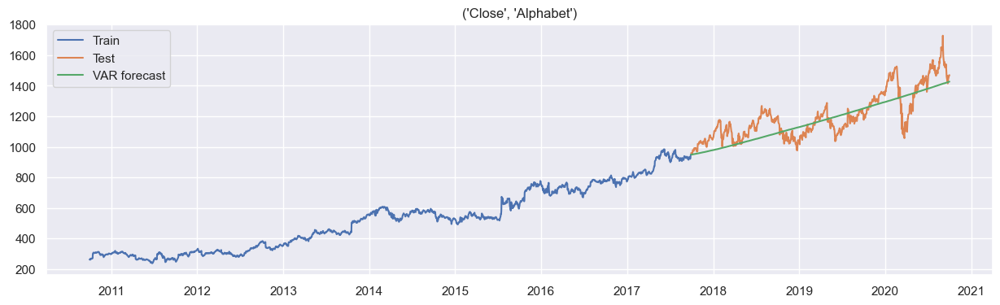

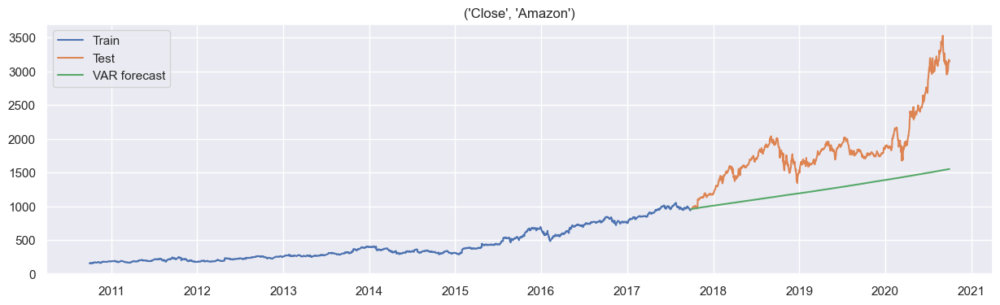

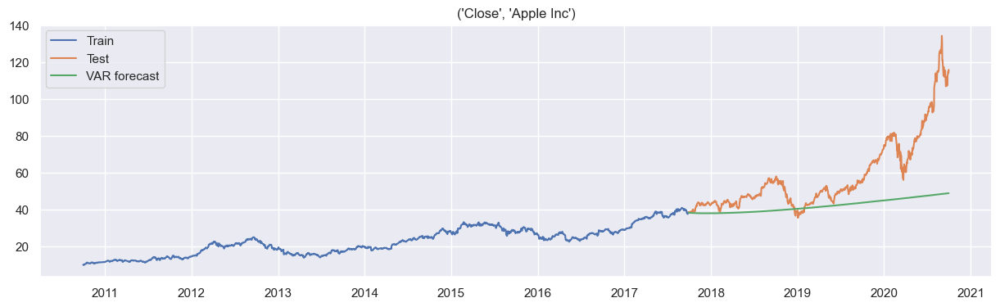

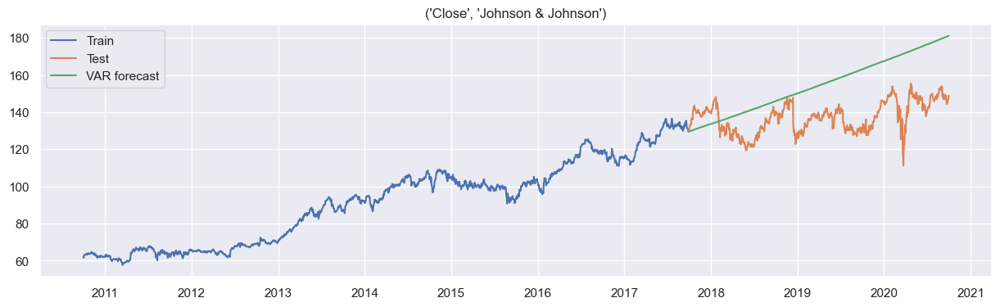

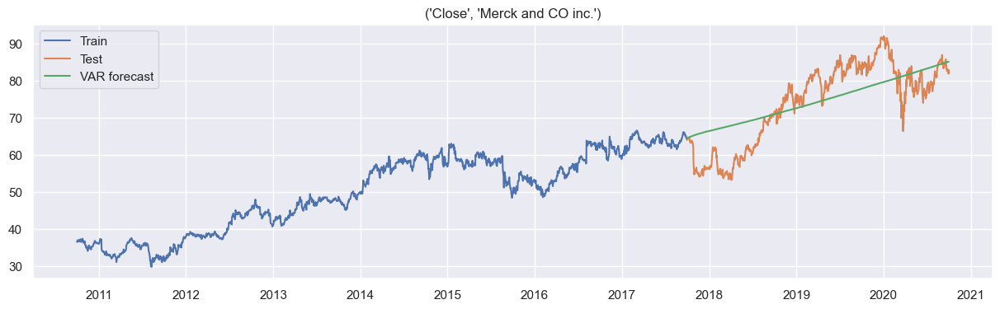

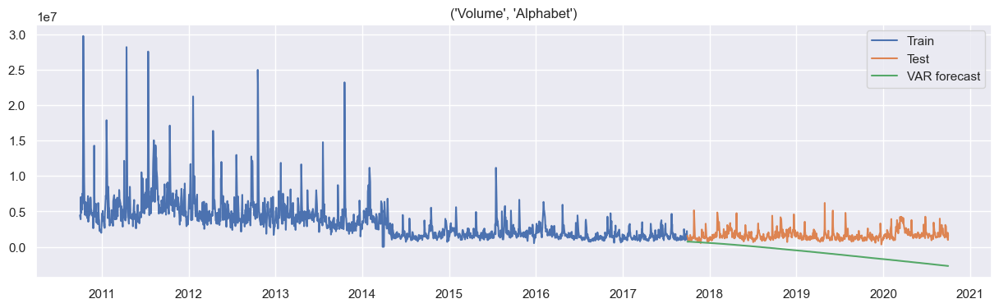

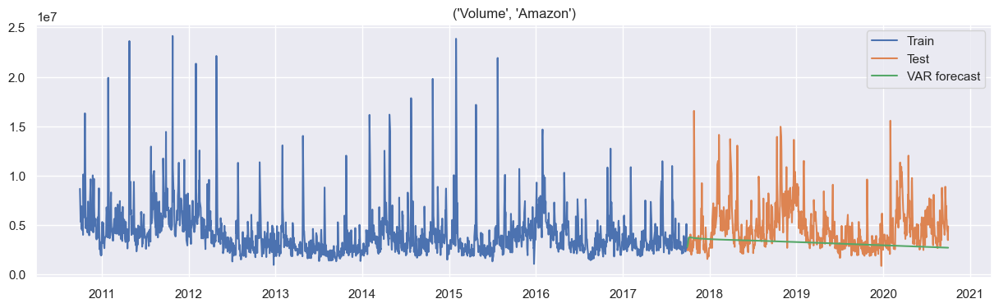

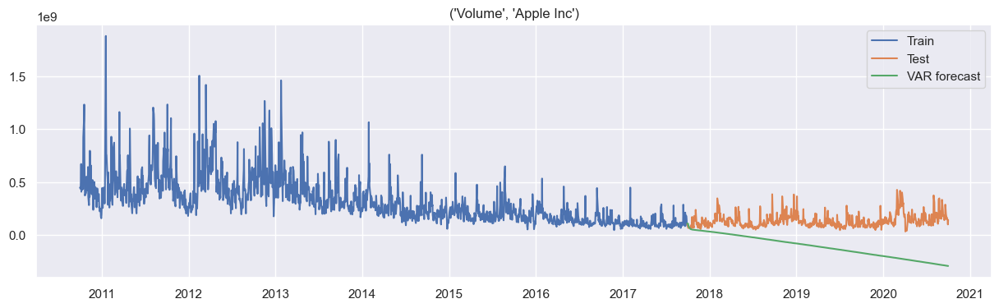

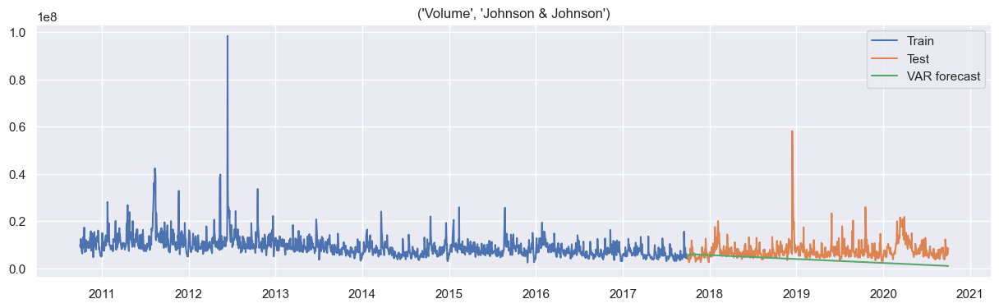

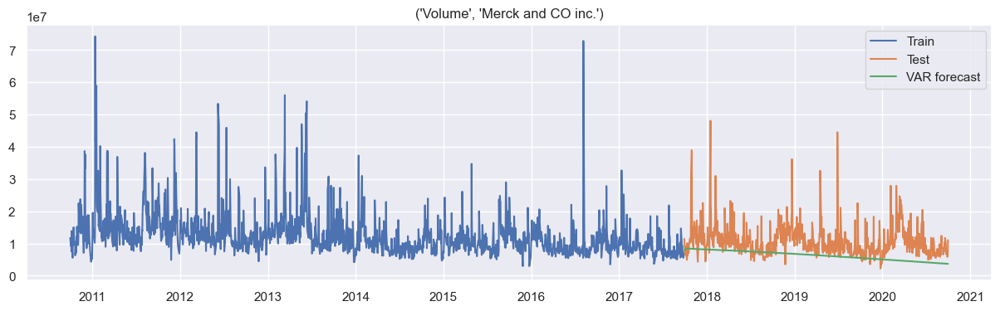

In [320]:
# Printing the train, test and forecasted values
for col in Portfolio_price_vol.columns:
    plt.figure(figsize=(15,4))
    plt.plot(Portfolio_price_vol[col][:train_len], label='Train')
    plt.plot(Portfolio_price_vol[col][train_len:], label='Test')
    plt.plot(forecast[col][:], label='VAR forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

In [321]:
# Model Evaluation
from sklearn.metrics import mean_squared_error

eval_results = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])
tempResults = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])

for col in Portfolio_price_vol.columns:
    rmse = np.sqrt(mean_squared_error(test_data[col], forecast[col][:])).round(2)
    mape = np.round(np.mean(np.abs(test_data[col]-forecast[col][:])/test_data[col])*100,2)

    tempResults = pd.DataFrame({'Column':[col], 'RMSE': [rmse],'MAPE': [mape] })
    eval_results = pd.concat([eval_results, tempResults])
    
eval_results

,Column,RMSE,MAPE
0,"(Close, Alphabet)",9.524000e+01,6.36
0,"(Close, Amazon)",7.230900e+02,30.61
0,"(Close, Apple Inc)",2.359000e+01,23.08
0,"(Close, Johnson & Johnson)",2.190000e+01,14.11
0,"(Close, Merck and CO inc.)",6.950000e+00,8.51
0,"(Volume, Alphabet)",2.824529e+06,155.13
0,"(Volume, Amazon)",2.742201e+06,32.78
0,"(Volume, Apple Inc)",2.774450e+08,192.83
0,"(Volume, Johnson & Johnson)",5.873552e+06,49.87
0,"(Volume, Merck and CO inc.)",6.494272e+06,38.22


In [ ]:
beta

In [ ]:
pd.pivot_table?

In [ ]:
prices=pd.DataFrame(SP500['Close'])
dataframes = {name: globals()[name] for name in industry['Ticker']}
for df_name, df in dataframes.items():
    print("{} has shape {}".format(df_name,df.shape))
    

In [ ]:
SP500.shape

In [ ]:
CS.head()

In [ ]:
for df_name, df in dataframes.items():
    print("{} has {} Null values".format(df_name,df.isnull().sum()))

In [ ]:
for df_name, df in dataframes.items():
    df.drop_duplicates(inplace=True)
    df.dropna(inplace=True)

In [ ]:
dataframes = {name: globals()[name] for name in industry['Ticker']}
for df_name, df in dataframes.items():
    print("{} has shape {}".format(df_name,df.shape))

In [ ]:
CS.head()

In [ ]:
CS.tail()

In [ ]:
CS.shape

In [ ]:
CS.head()

In [ ]:
SP500.head()

In [ ]:
SP500.tail()

In [ ]:
GOOG.tail()

In [ ]:
GOOG.drop_duplicates(inplace=True)
GOOG.shape

In [ ]:
prices.head()

In [ ]:
columns=['SP500']
for df_name, df in dataframes.items():
    prices=pd.merge(prices,df['Close'],how='outer',on='Date')
    columns.append(df_name)
prices.columns=columns
  

In [ ]:
pd.merge?

In [ ]:
prices.head()

In [ ]:
prices.shape

In [ ]:
prices.isnull().sum()

In [ ]:
prices.dropna(axis=0,inplace=True)
prices.isnull().sum()

In [ ]:
prices.shape

In [ ]:
x=pd.read_csv('S&P500.csv',index_col='Date')
plt.figure(figsize=[15,10])
x.Close.plot()
plt.show()

In [ ]:
y=pd.read_csv('S&P500.csv',parse_dates=True, index_col='Date', infer_datetime_format=True)
plt.figure(figsize=[15,10])
y.Close.plot()
plt.show()

In [ ]:
y = pd.read_csv('S&P500.csv', parse_dates=True, index_col='Date')

# Resample the data to include missing dates (daily frequency) and forward-fill missing values
y_resampled = y.resample('D').ffill()

# Plot the original and forward-filled data
plt.figure(figsize=(10, 6))
y['Close'].plot(label='Original Data')
y_resampled['Close'].plot(label='Forward-filled Data')
plt.legend()
plt.show()

In [ ]:
for i in prices.columns:
    plt.figure(figsize=[10,6])
    prices[i].plot()
    plt.title(i)
    plt.show()

In [ ]:
returns=prices.pct_change()

In [ ]:
returns.head()

In [ ]:
returns.dropna(axis=0,inplace=True)

In [ ]:
returns.head()

In [ ]:
for i in returns.columns:
    if i!='SP500':
        returns[[i,'SP500']].plot()
        plt.title(i)
        plt.show()

In [ ]:
for i in returns.columns:
        sns.histplot(returns[i])
        plt.title(i)
        plt.show()

In [ ]:
for i in returns.columns:
        sns.boxplot(returns[i])
        plt.title(i)
        plt.show()

In [ ]:
returns.median()

In [ ]:
returns.mean()

# Outlier treatment

Lets replace outliers with median values

In [ ]:
# Replacing the outliers with the median value
for col in returns.columns:
    Q1 = returns[col].quantile(0.01)
    Q3 = returns[col].quantile(0.99)
    IQR = Q3 - Q1
    
    col_median = returns[col].median()
    
    # IQR
    returns[col] = np.where(returns[col] < Q1, col_median, returns[col])
    returns[col] = np.where(returns[col] > Q3, col_median, returns[col])

In [ ]:
for i in returns.columns:
        sns.boxplot(returns[i],orient='h')
        plt.title(i)
        plt.show()

In [ ]:
for i in returns.columns:
        sns.distplot(returns[i])
        plt.title(i)
        plt.show()

In [ ]:
returns.mean()

In [ ]:
Cumulative_returns_daily = (1+returns).cumprod()
Cumulative_returns_daily.tail(5)

In [ ]:
Cumulative_returns_daily.head(50)

In [ ]:
for i in Cumulative_returns_daily .columns:
        Cumulative_returns_daily[i].plot()
        plt.title(i)
        plt.show()